## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_standard_14"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "standard"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


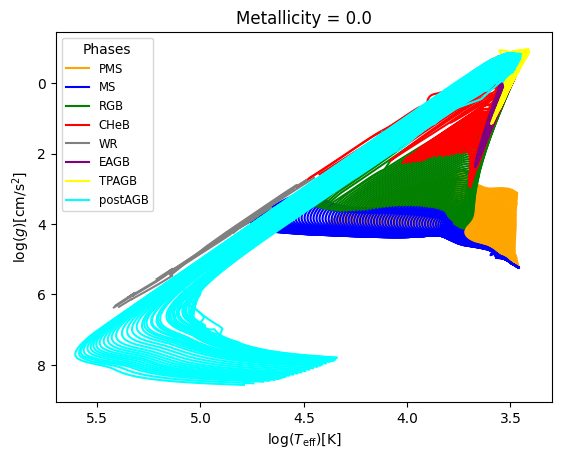

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.00,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.00,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.00,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.05,4.482577,4.350883,0.0,-0.25,12.925175,0.596074
4,5.05,4.485667,4.349692,0.0,-0.25,13.105490,0.600130
...,...,...,...,...,...,...,...
519286,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
519287,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
519288,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
519289,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


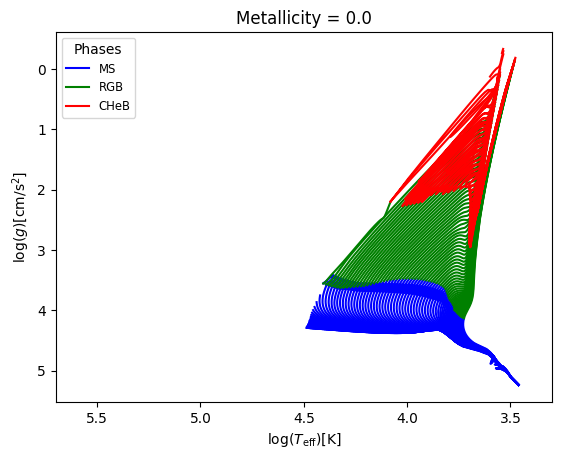

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], 'star_mass':('<', 14)})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4629, Median : 8.5

log_Teff  : Range : 3.34 - 4.6345, Mean : 3.9346, Median : 3.8644

log_g  : Range : -1.08 - 5.4331, Mean : 3.5485, Median : 3.9492

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 13.9995, Mean : 3.398, Median : 2.0471

log_R  : Range : -1.0 - 3.0828, Mean : 0.6067, Median : 0.5386



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 4.634489491902143
Median value in train data for the log_Teff parameter: 3.8641118622993966
Mean value in train data for the log_Teff parameter: 3.9345581069095505

Range in train data for the log_g parameter : -1.0828963170617296 - 5.433094523832443
Median value in train data for the log_g parameter: 3.9484790508590737
Mean value in train data for the log_g parameter: 3.548006174763417

Range in train data for the log_R parameter : -0.9974747647513328 - 3.082068881511837
Median value in train data for the log_R parameter: 0.5381900688843242
Mean value in train data for the log_R parameter: 0.6069651248403705

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 4.633956017110521
Median value in test data for the log_Teff parameter: 3.865317881638998
Mean value in test data for the log_Teff parameter: 3.9346904482232112

Range in test data for the log_g p

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.7470393633147319
  RMSE :  0.1576108105425503
  MAE :  0.13580161922594564
  MedAE :  0.1397893911347099
  CORR :  0.8653632874170335
  MAX_ER :  0.768320162253056
  Percentiles : 
    75th percentile :  0.1927388918585975
    90th percentile :  0.23076871650668612
    95th percentile :  0.2486207157033973
    99th percentile :  0.3334919910032085

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.6781453648754645
  RMSE :  0.14257958157255585
  MAE :  0.1082338482529041
  MedAE :  0.08910971836588888
  CORR :  0.8251398762758951
  MAX_ER :  0.7251774774019246
  Percentiles : 
    75th percentile :  0.14465574145614313
    90th percentile :  0.20896386442022977
    95

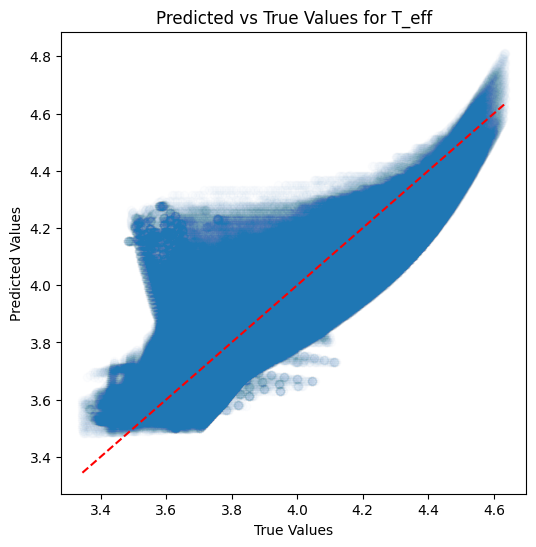

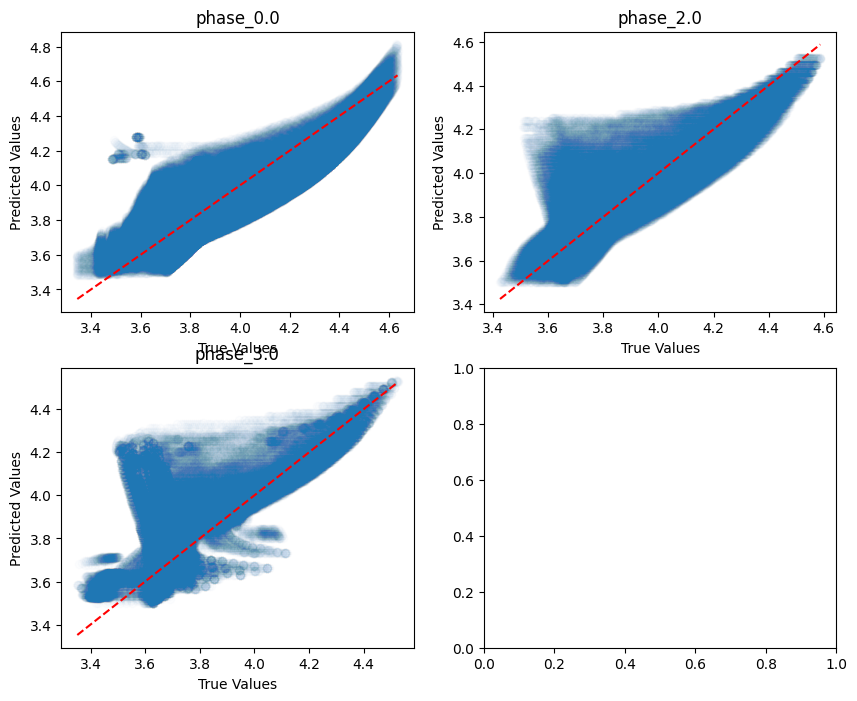

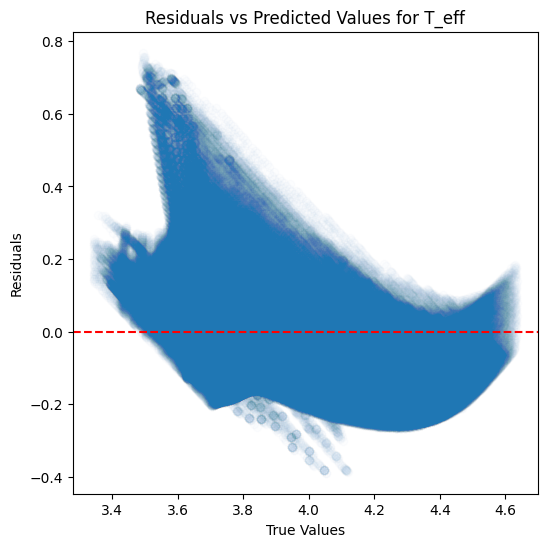

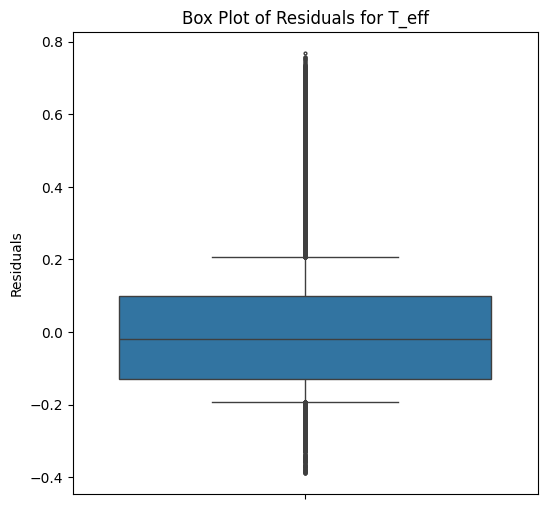

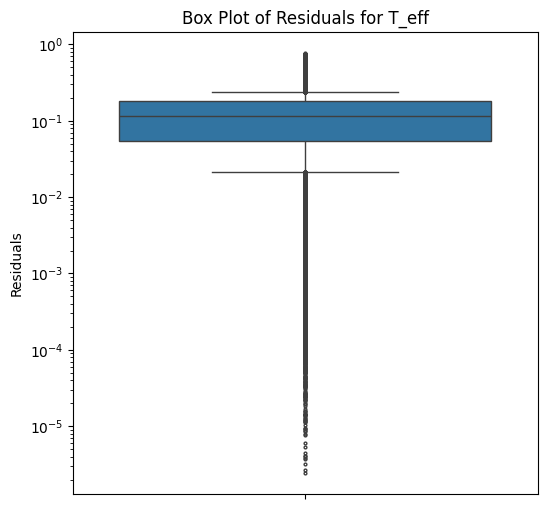

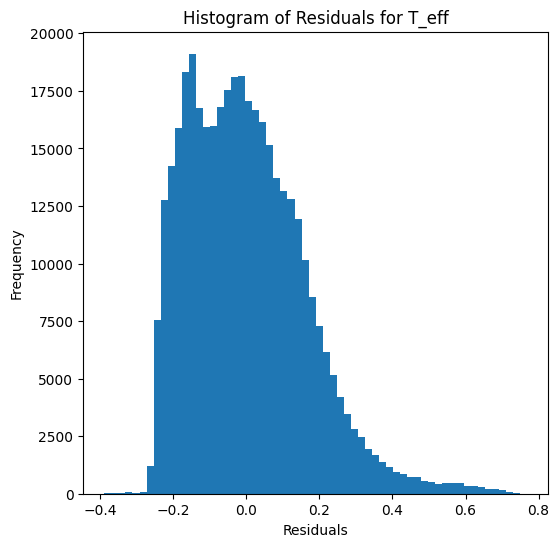

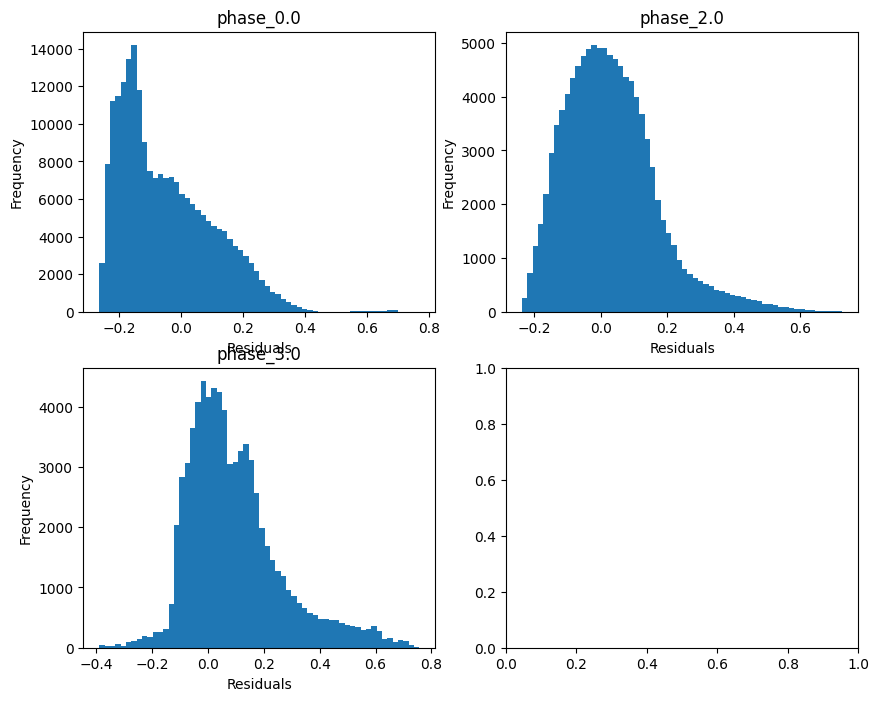

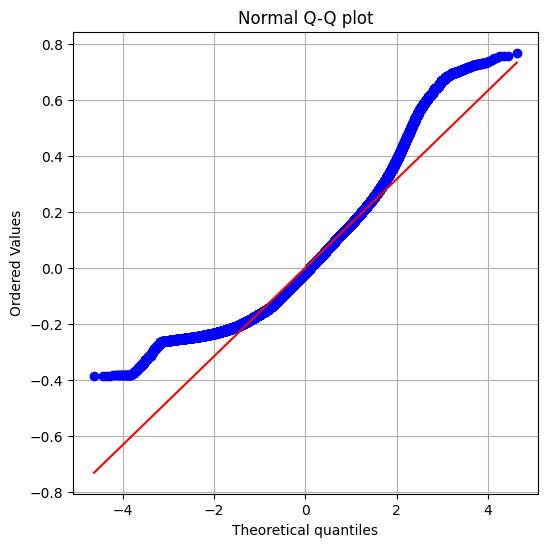

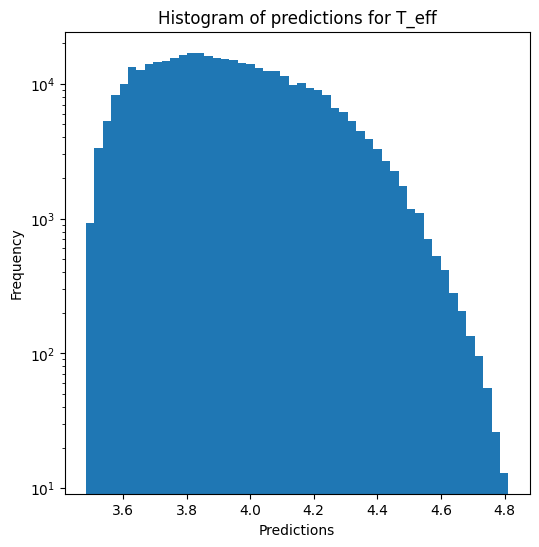

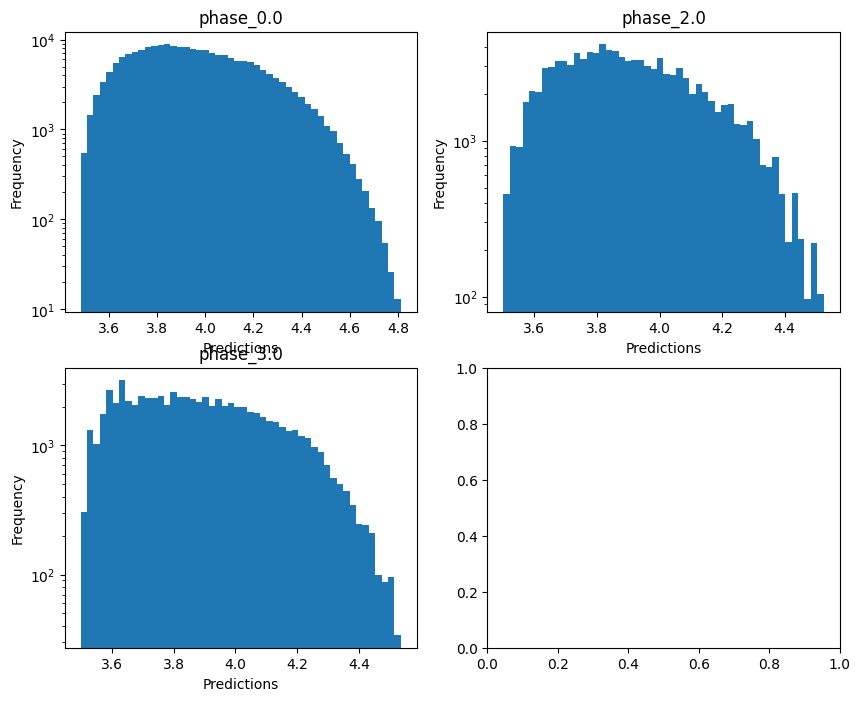

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.8445653587464037
  RMSE :  0.9286347190736687
  MAE :  0.7655351567908051
  MedAE :  0.6407871161161194
  CORR :  0.45563954743445234
  MAX_ER :  3.1294577680892437
  Percentiles : 
    75th percentile :  1.0952907627303845
    90th percentile :  1.5717930911516993
    95th percentile :  1.789109710296555
    99th percentile :  2.127134202158224

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.11325394232663888
  RMSE :  1.0537918411219005
  MAE :  0.83115948090381
  MedAE :  0.679899347479803
  CORR :  0.3675105535968923
  MAX_ER :  2.76269467754175
  Percentiles : 
    75th percentile :  1.2504419314987596
    90th percentile :  1.8059837957434883
    95th percentile :  2.1267820734530174
    99th percentile :  2.5281605437180232

log_g results for the phase categ

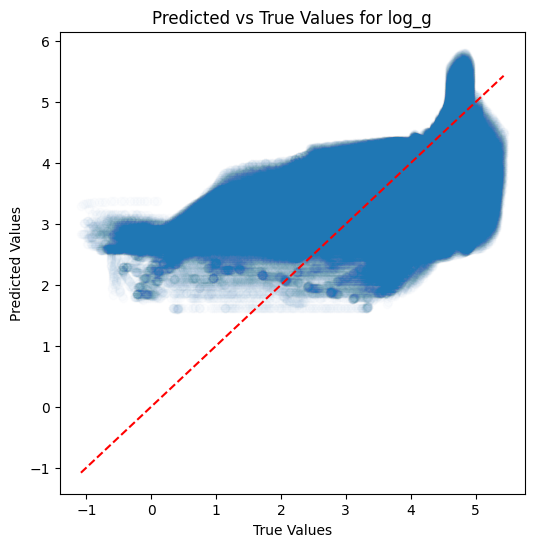

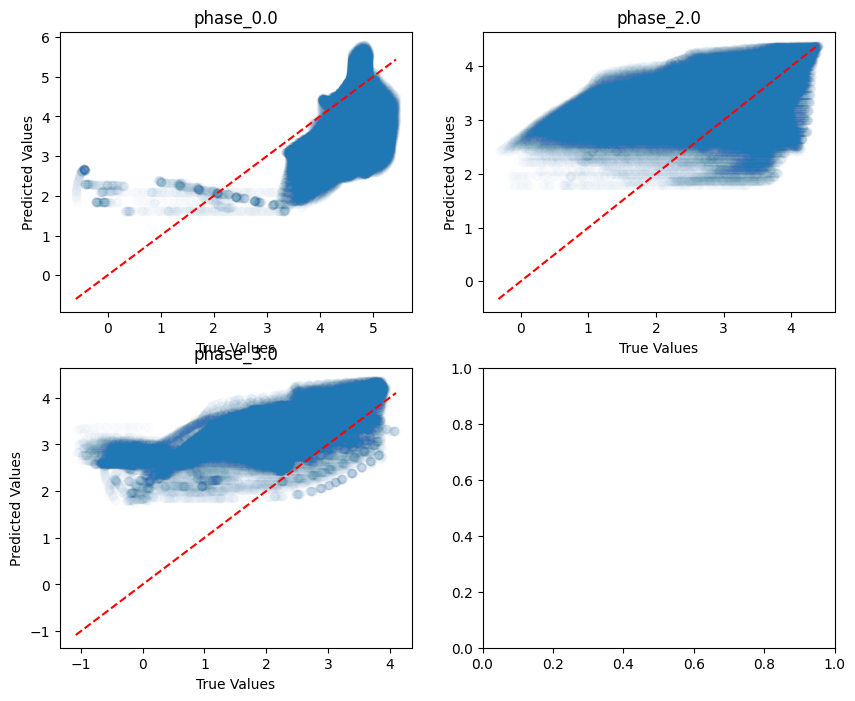

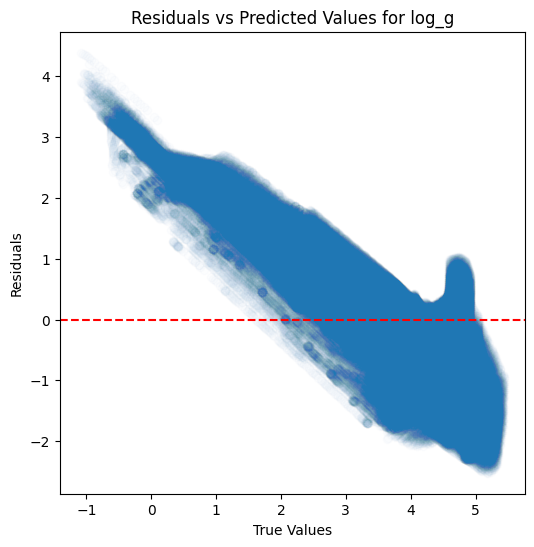

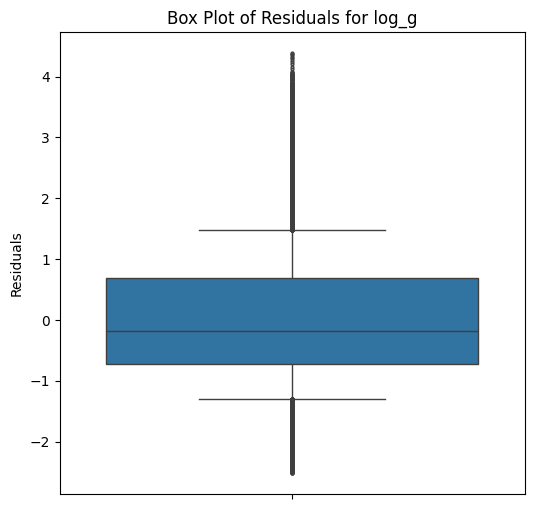

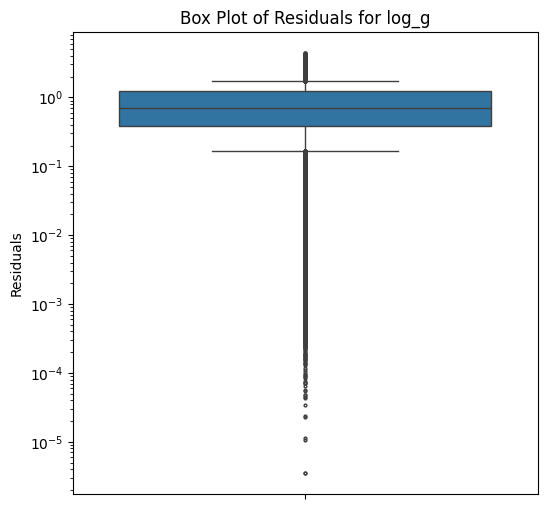

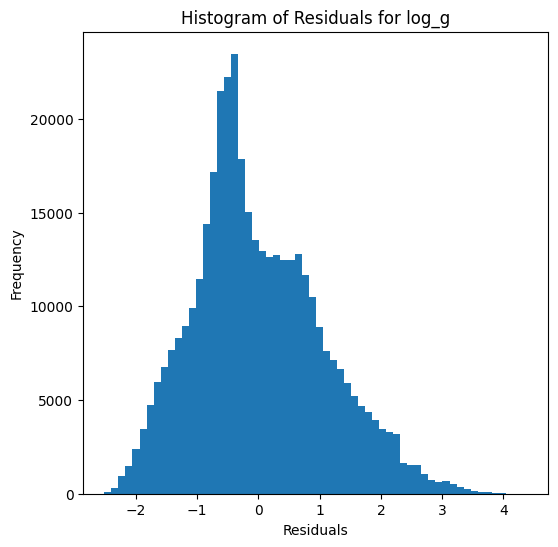

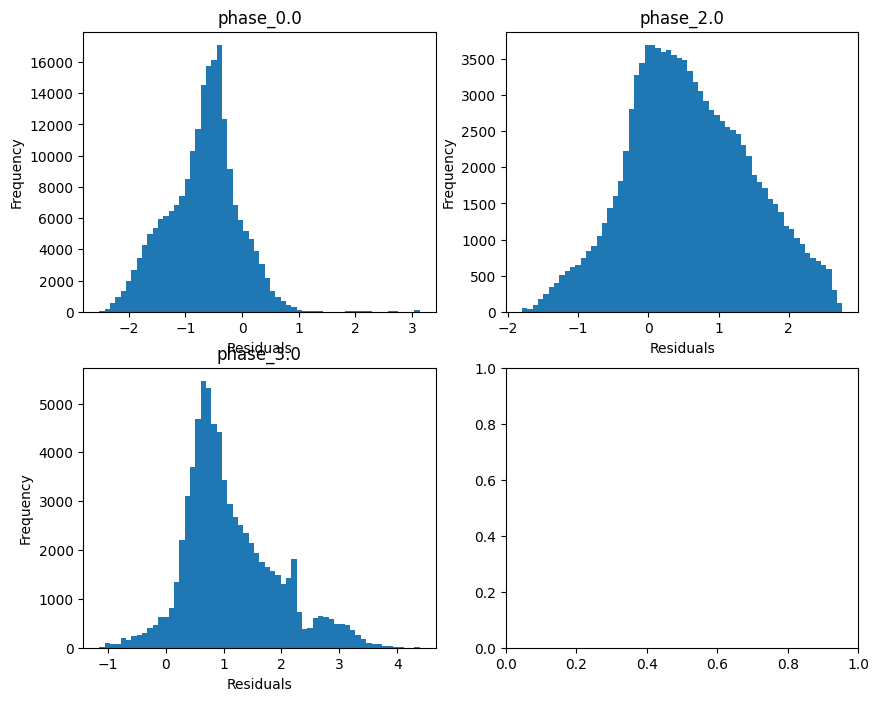

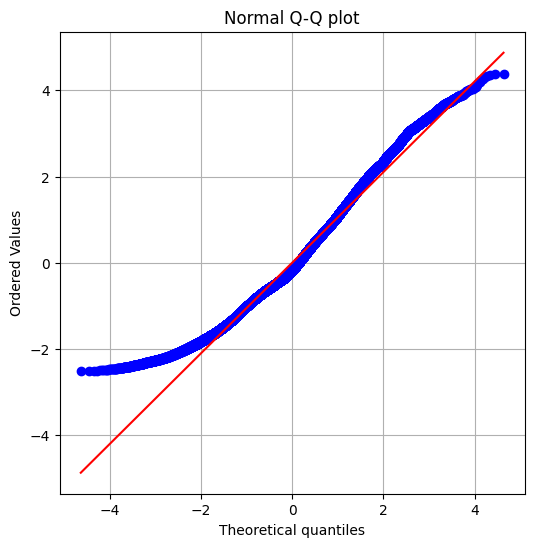

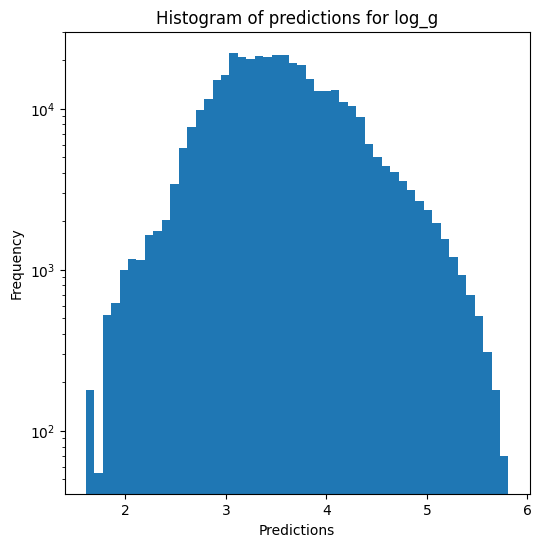

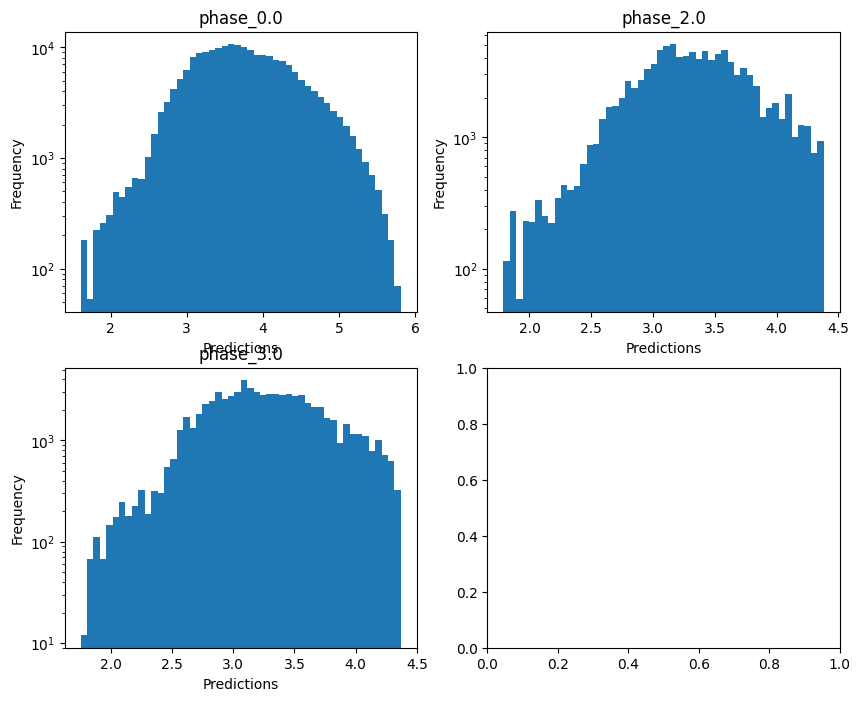


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.22469211359169838
  RMSE :  0.5339917638556835
  MAE :  0.4147907438751243
  MedAE :  0.30931170317807233
  CORR :  0.5947013137402153
  MAX_ER :  1.6784285207590892
  Percentiles : 
    75th percentile :  0.6287803648355285
    90th percentile :  0.9266574756383368
    95th percentile :  1.084066304117224
    99th percentile :  1.3445139919489029

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.059961009862140036
  RMSE :  0.564752889590136
  MAE :  0.4556922998735106
  MedAE :  0.3911693258184415
  CORR :  0.41957720790584696
  MAX_ER :  1.4086579713852225
  Percentiles : 
    75th percentile :  0.6853303345471323
    90th percentile :  0.9499009872921027
    95th percentile :  1.098816262159832
    99th percentile :  1.2904790596904498

radius results for the phase category with a 

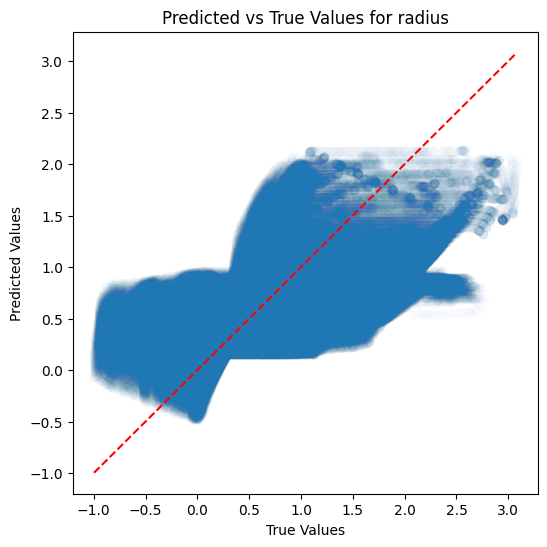

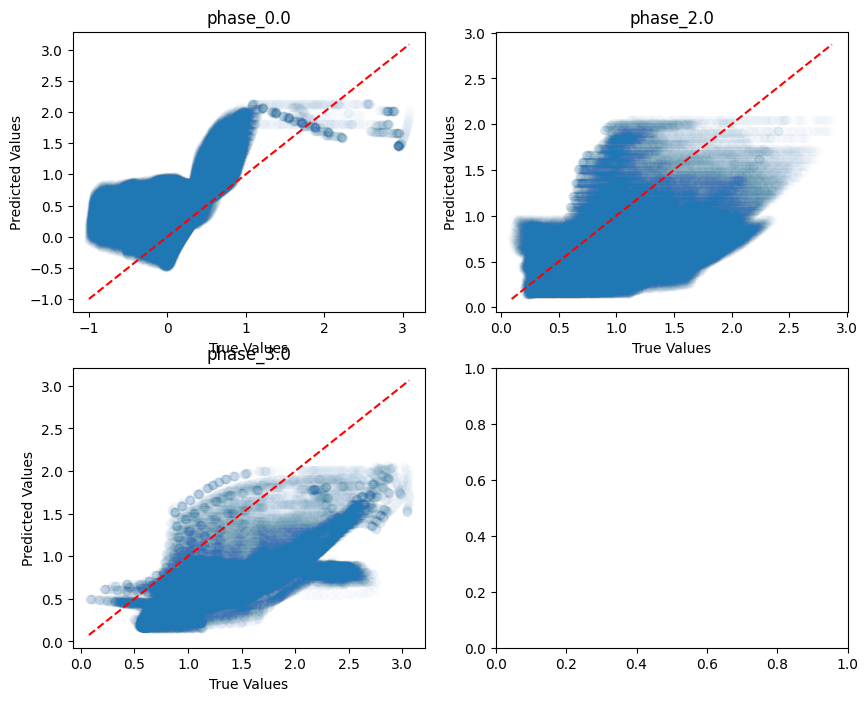

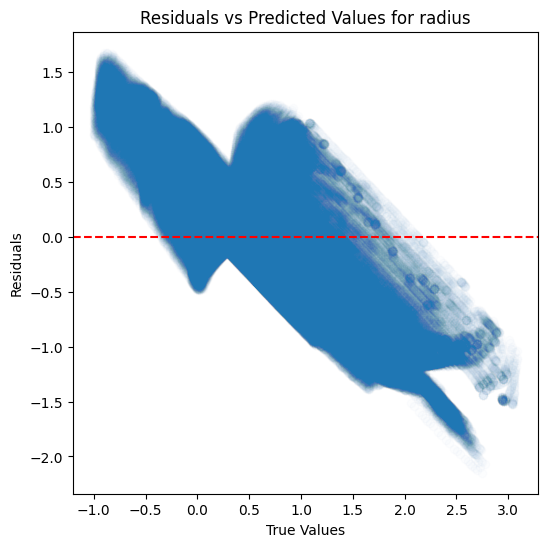

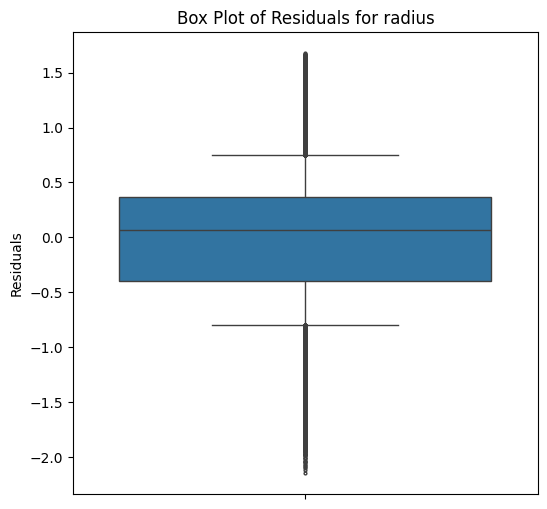

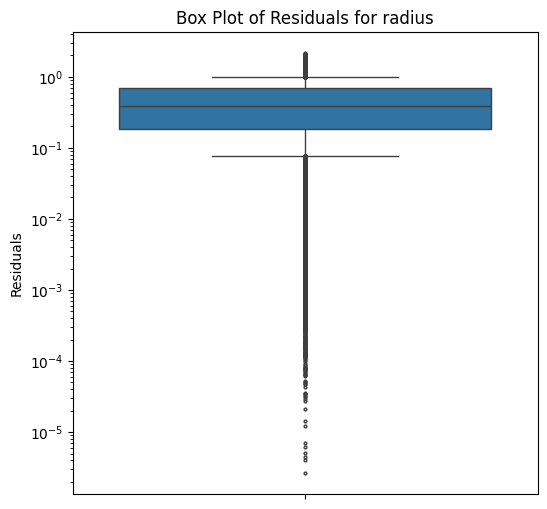

...

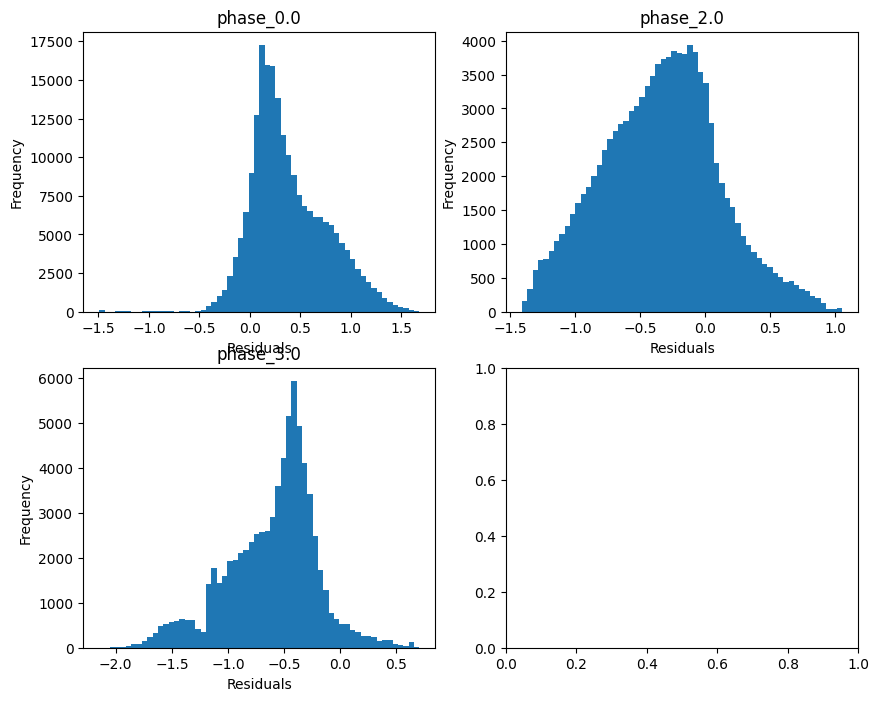

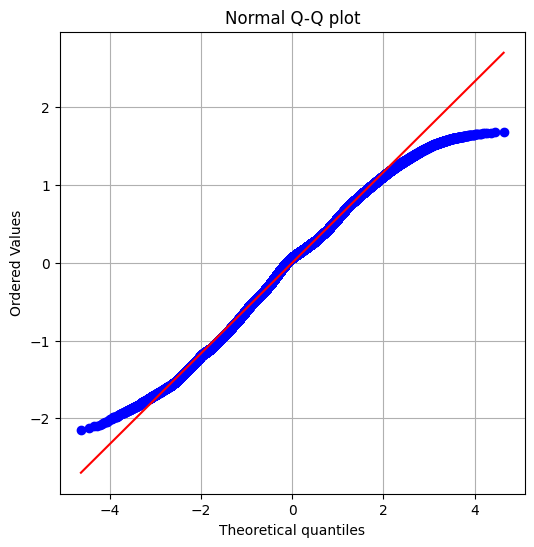

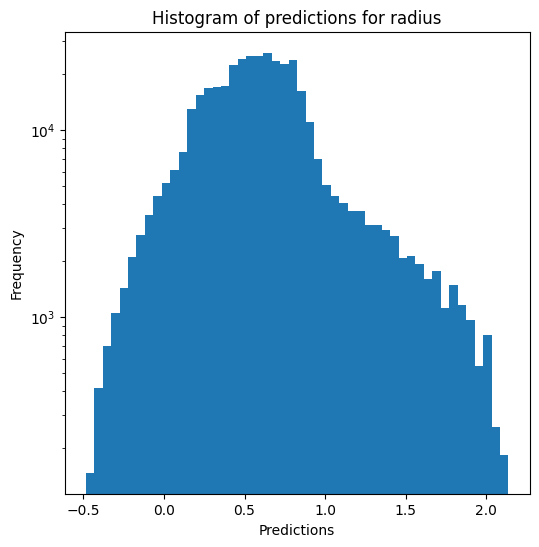

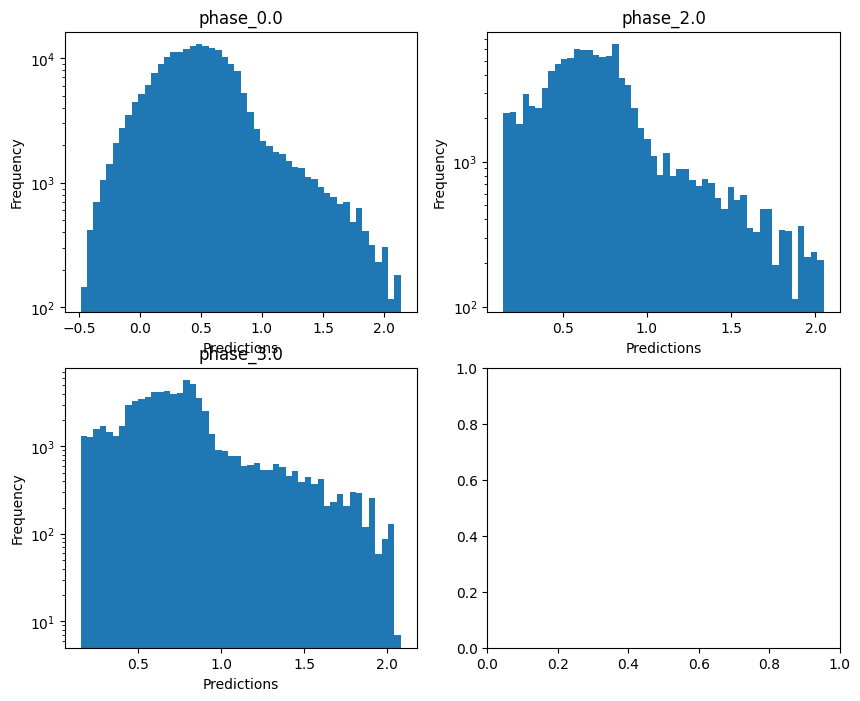

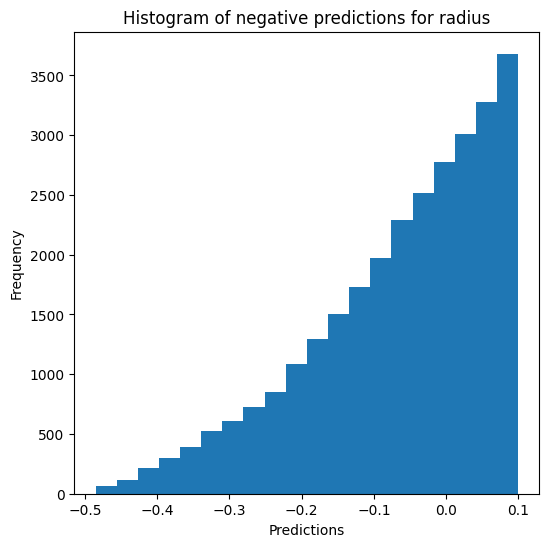

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9710984587313459
  RMSE :  0.05082048199298519
  MAE :  0.00700269707958333
  MedAE :  0.0010171719471134821
  CORR :  0.9857516123972246
  MAX_ER :  0.9170521162841481
  Percentiles : 
    75th percentile :  0.0022239791500124895
    90th percentile :  0.00398243775646776
    95th percentile :  0.007281746712736393
    99th percentile :  0.19504534354886052

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9290008496413422
  RMSE :  0.06545492416958788
  MAE :  0.02673566275420036
  MedAE :  0.003704608876652138
  CORR :  0.9642286393864585
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.014543155146450104
    90th percentile :  0.0938922765

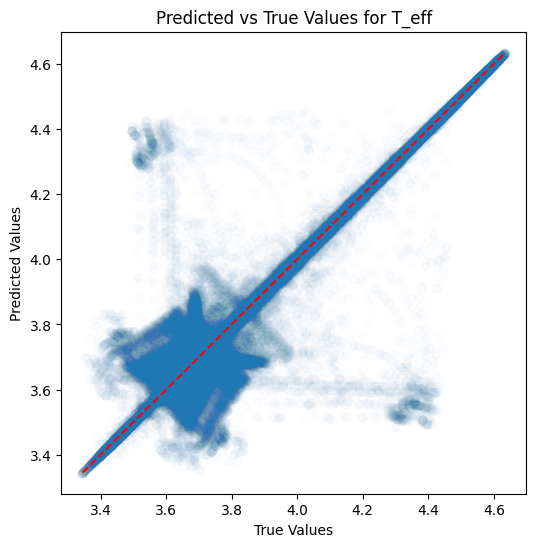

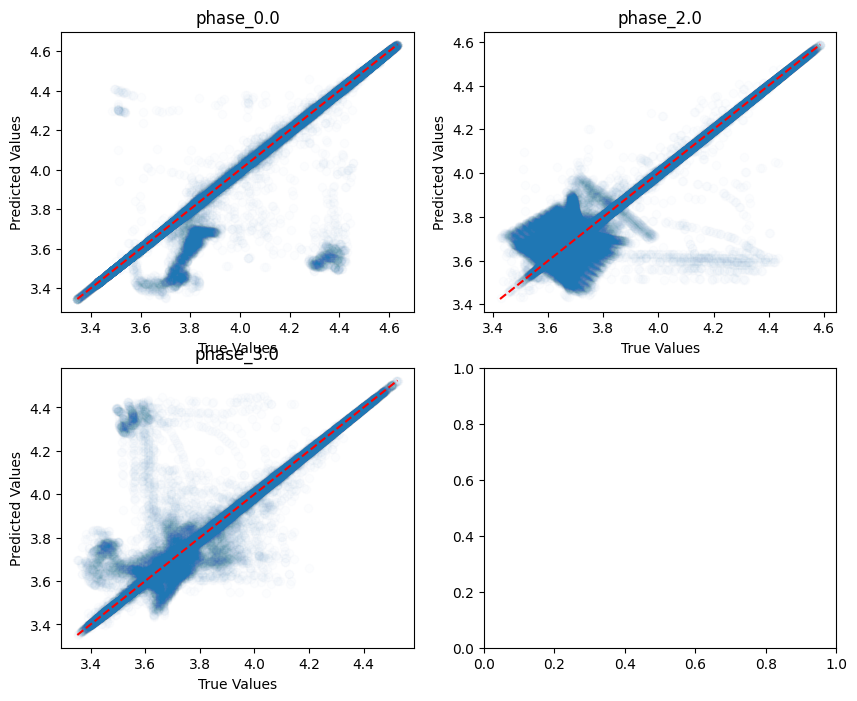

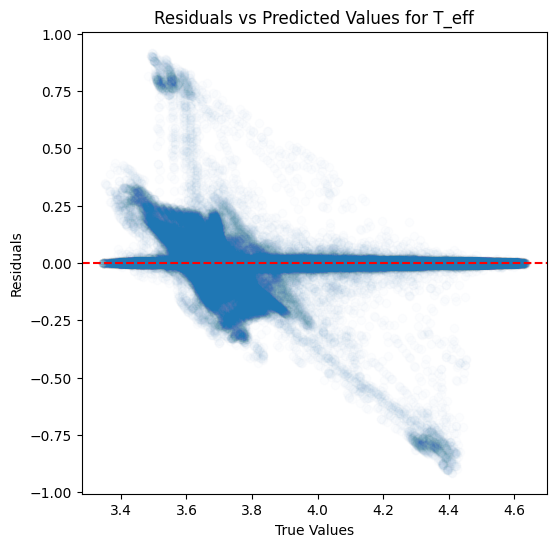

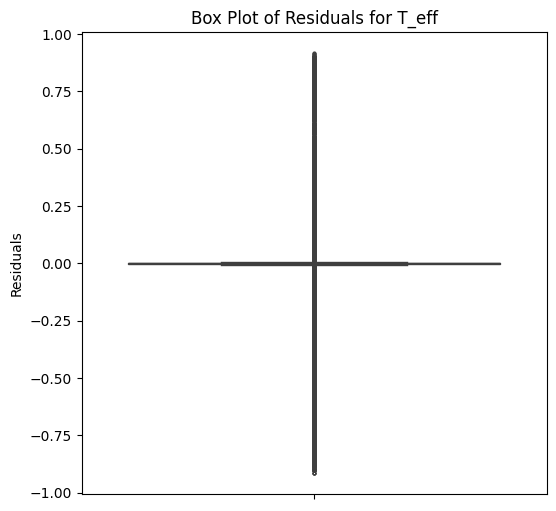

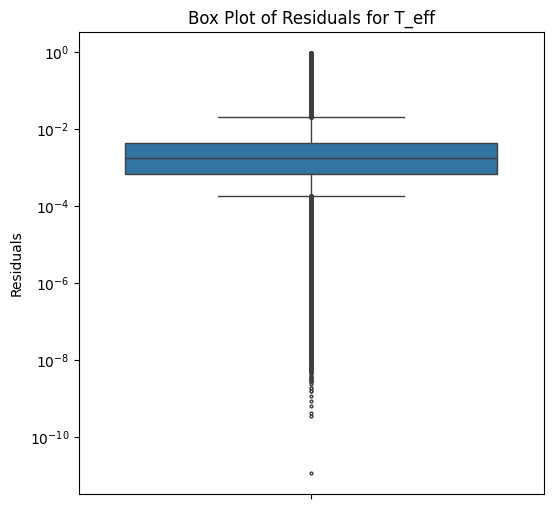

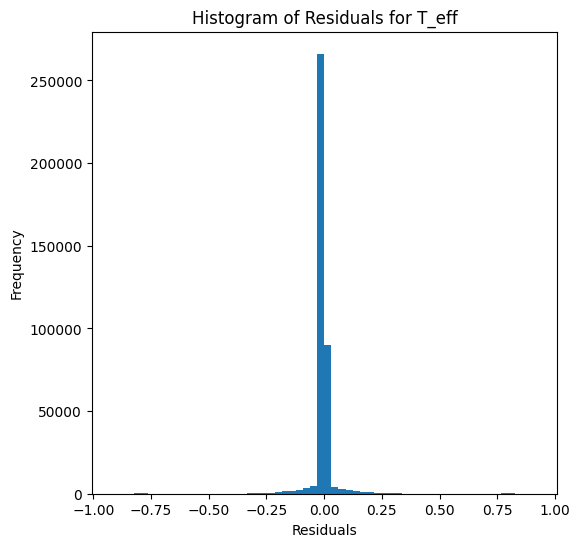

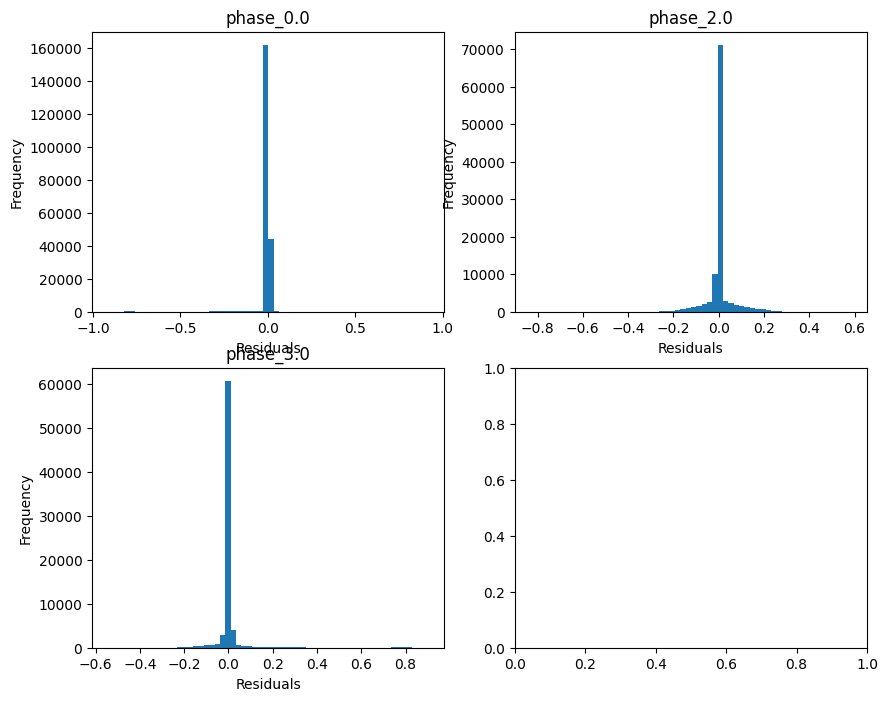

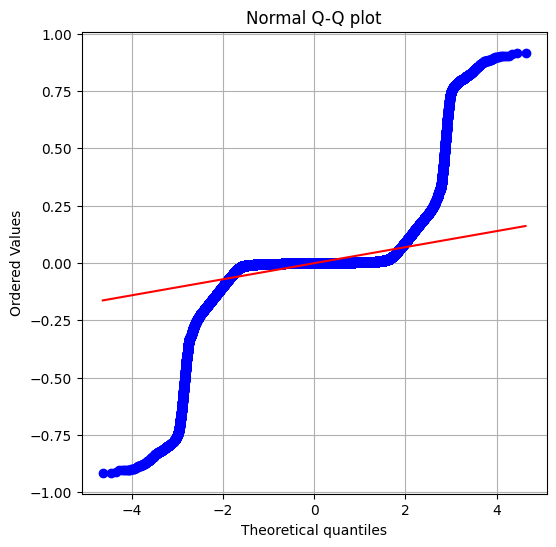

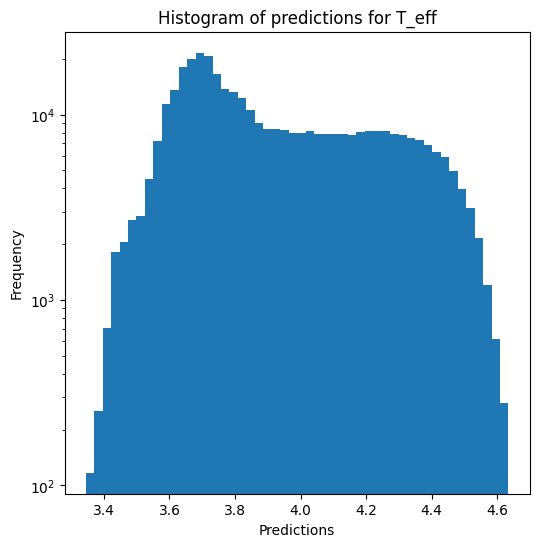

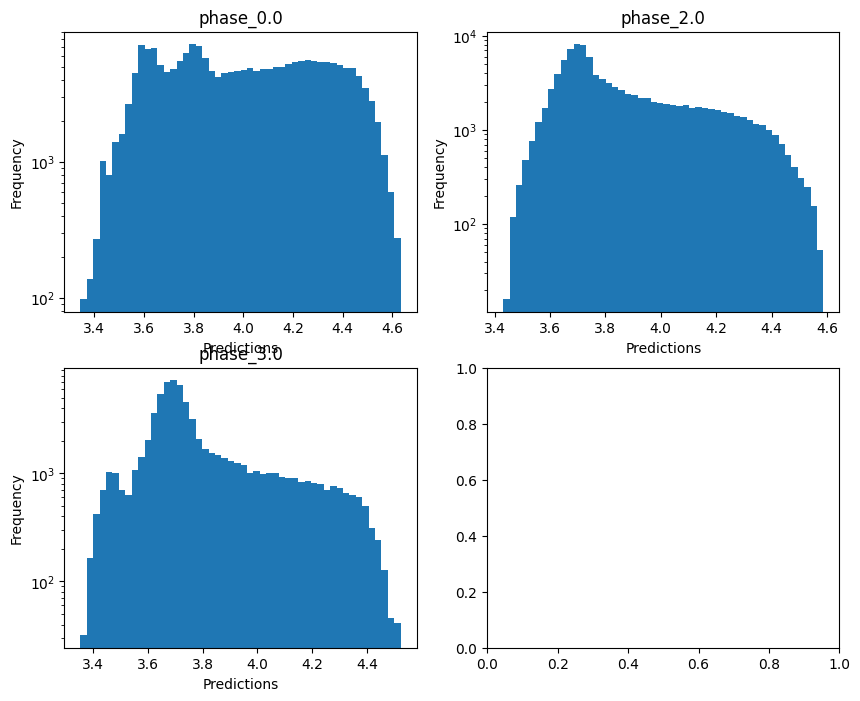


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.05941579428887589
  RMSE :  0.44504058910860883
  MAE :  0.05960227477047744
  MedAE :  0.003620715240701955
  CORR :  0.739516022601014
  MAX_ER :  5.693303843114662
  Percentiles : 
    75th percentile :  0.00719511666178807
    90th percentile :  0.012545464932683359
    95th percentile :  0.0212974065023111
    99th percentile :  3.174992425993657

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.035357642914205734
  RMSE :  0.9441520434160848
  MAE :  0.4194514830878307
  MedAE :  0.018277655536475867
  CORR :  0.47977410998199965
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.24685887590845695
    90th percentile :  1.7532135252356764
    95th percentile :  2.5261948177876
    99th percentile :  3.5419409109131252

log_g results for the phase category wit

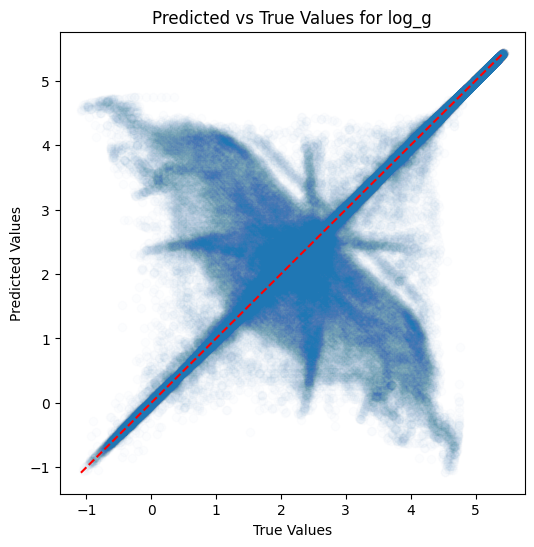

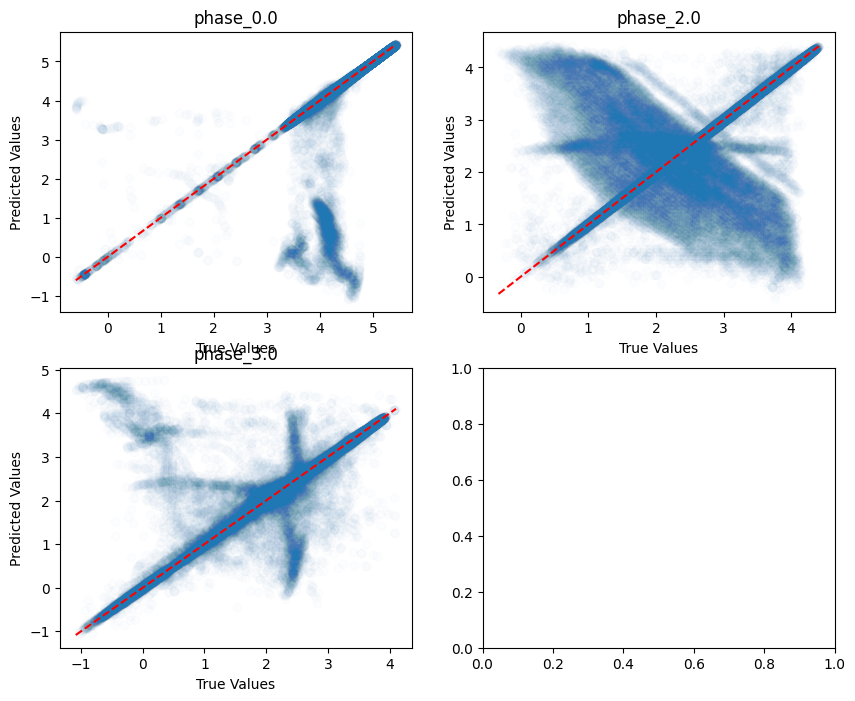

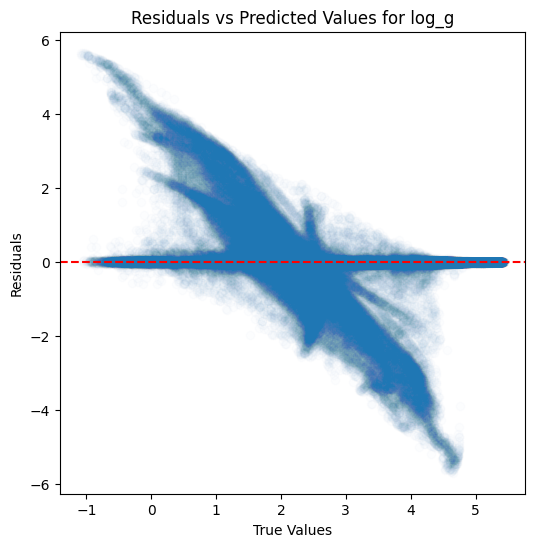

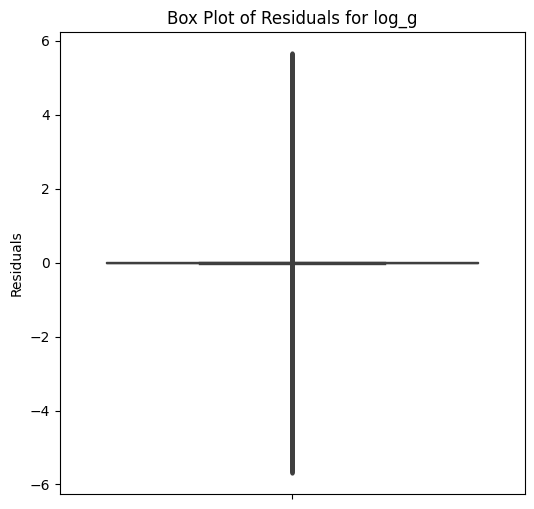

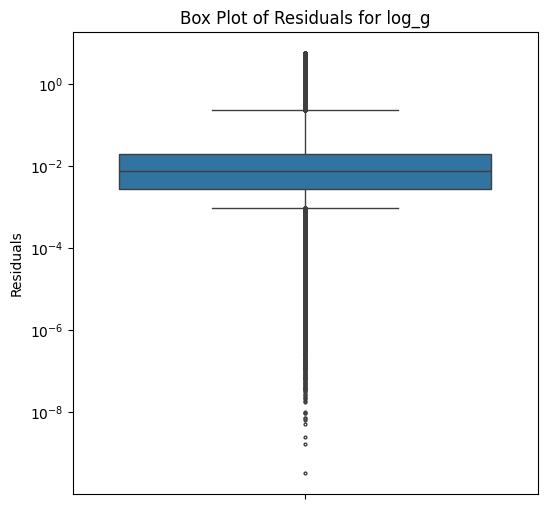

...

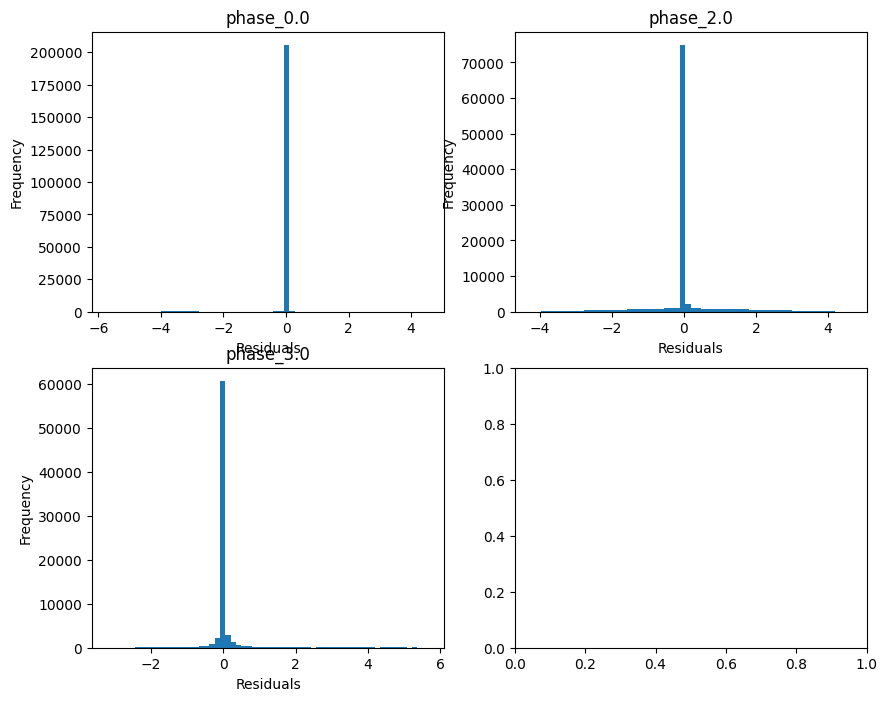

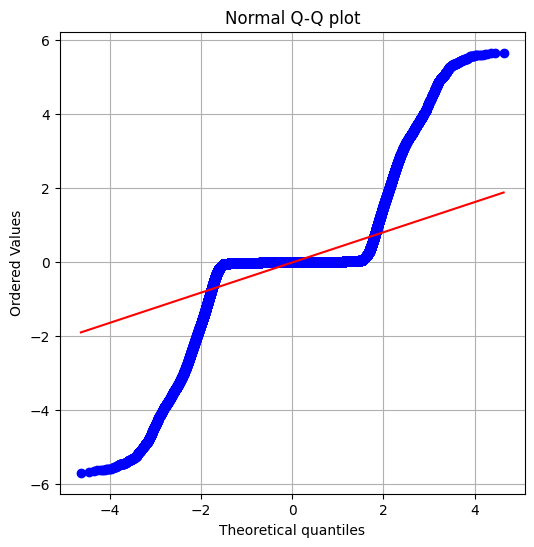

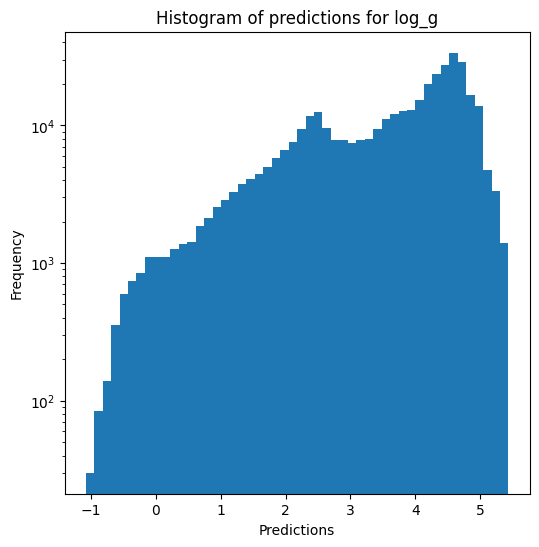

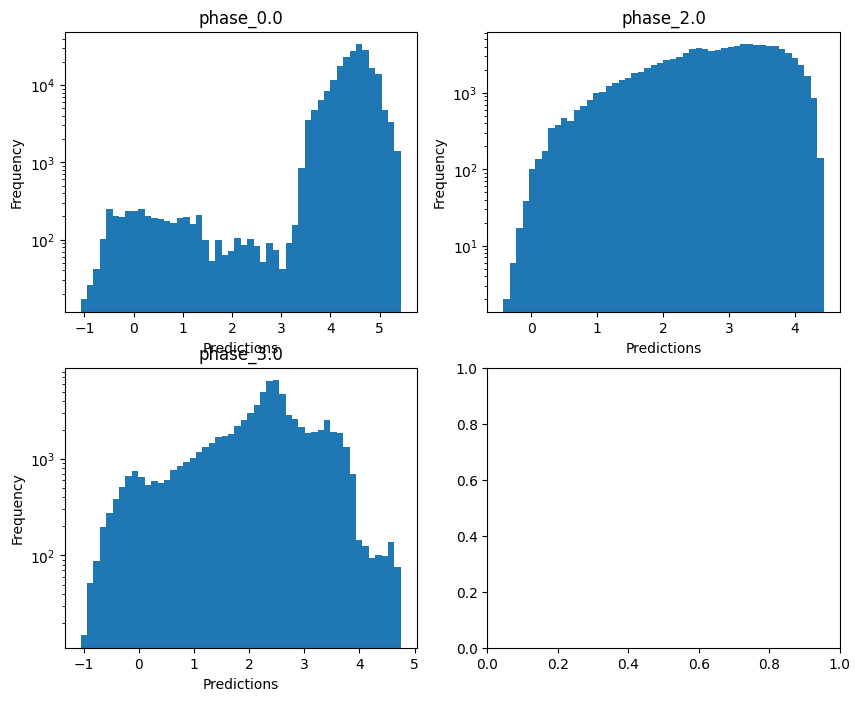

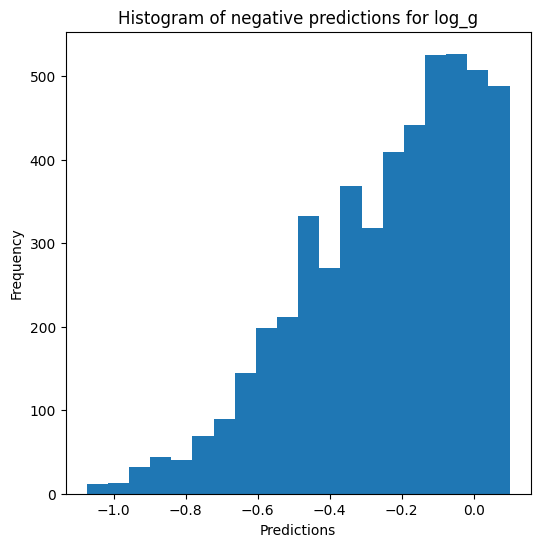


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7246414682243536
  RMSE :  0.22254730293124278
  MAE :  0.030507737138563536
  MedAE :  0.002484722995298505
  CORR :  0.8874893360813174
  MAX_ER :  2.84673517851732
  Percentiles : 
    75th percentile :  0.004655703332395289
    90th percentile :  0.007961389767700429
    95th percentile :  0.012245406683428866
    99th percentile :  1.5874053223258582

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  -0.028759647542487388
  RMSE :  0.4720656538724213
  MAE :  0.20973241905022327
  MedAE :  0.009153968829336612
  CORR :  0.4981730340528028
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.12346350849214627
    90th percentile :  0.8765924126093301
    95th percentile :  1.2630914474893096
    99th percentile :  1.7708616442747909

radius results for the phase ca

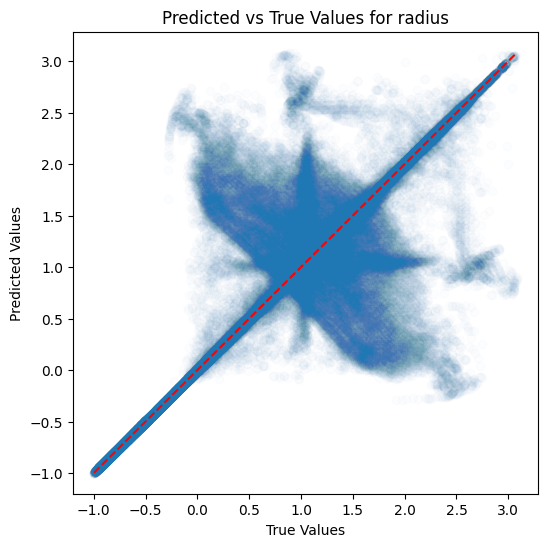

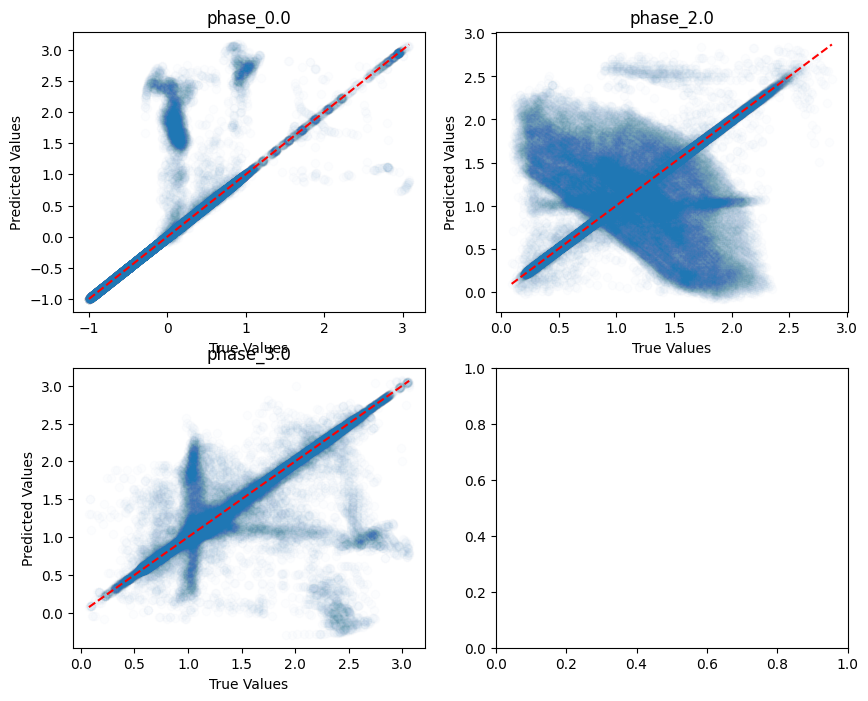

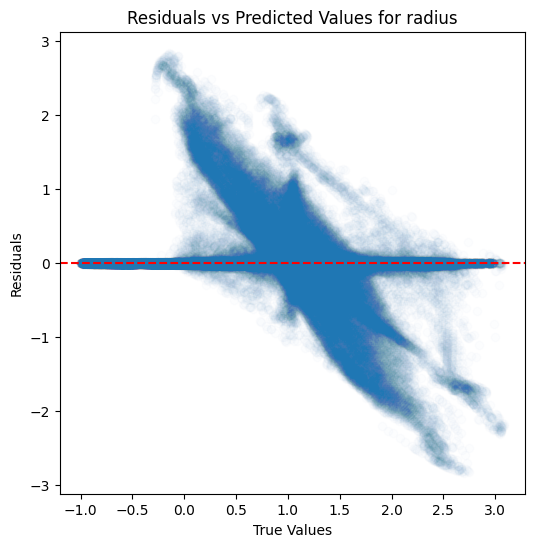

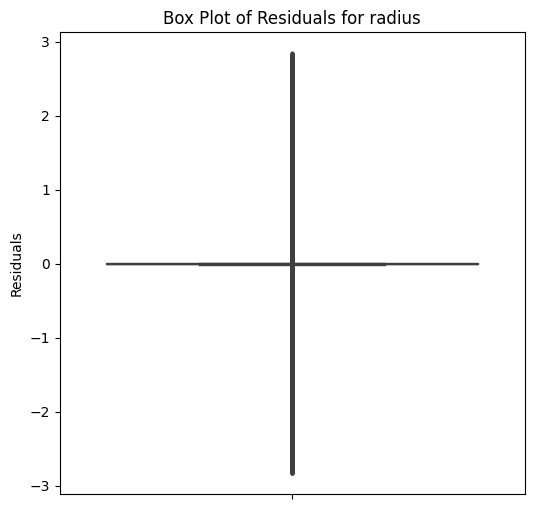

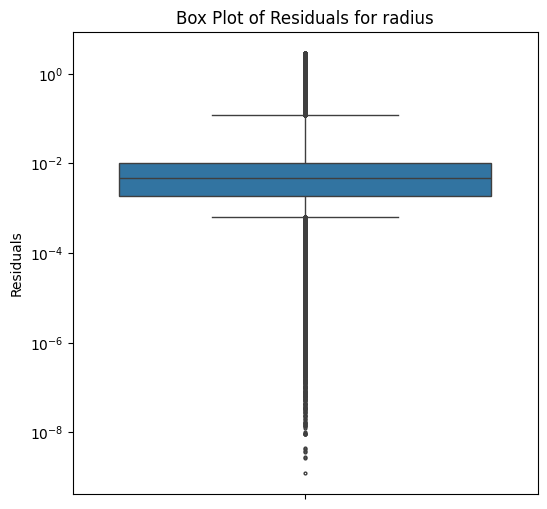

...

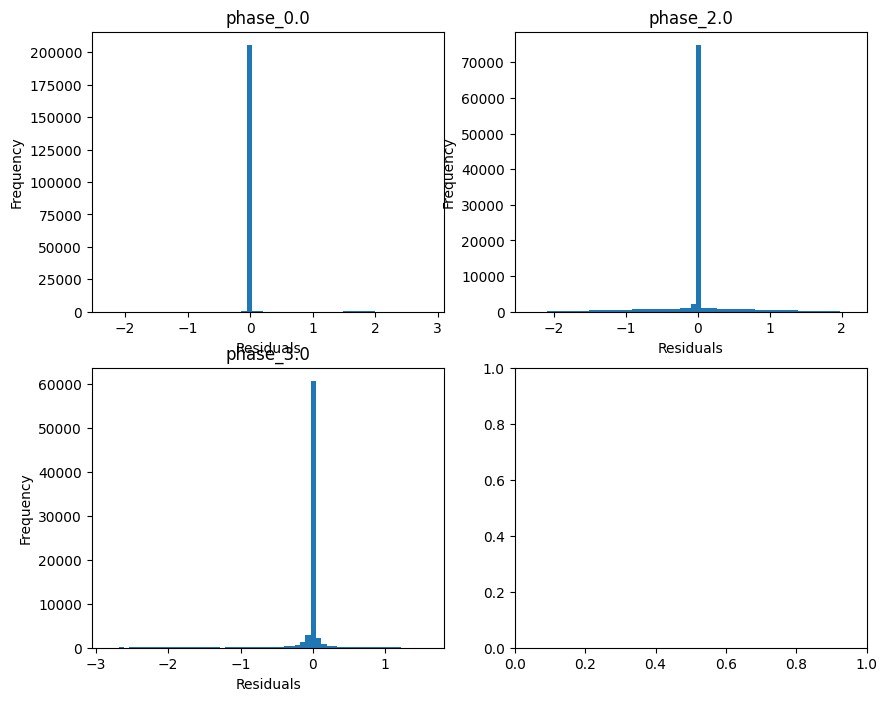

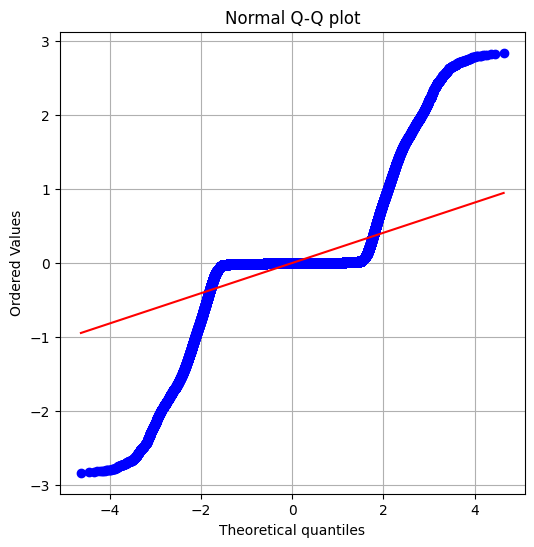

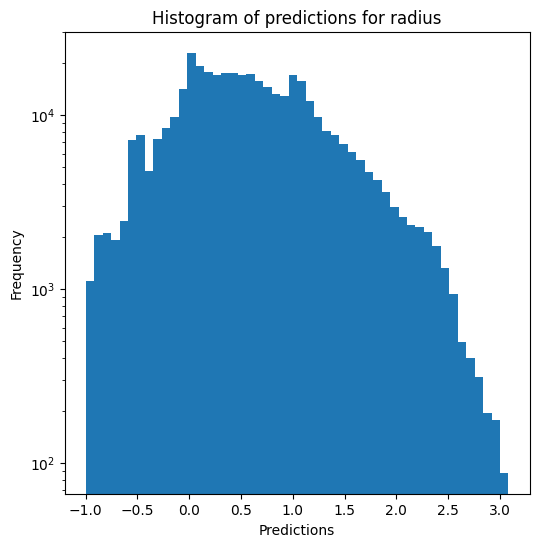

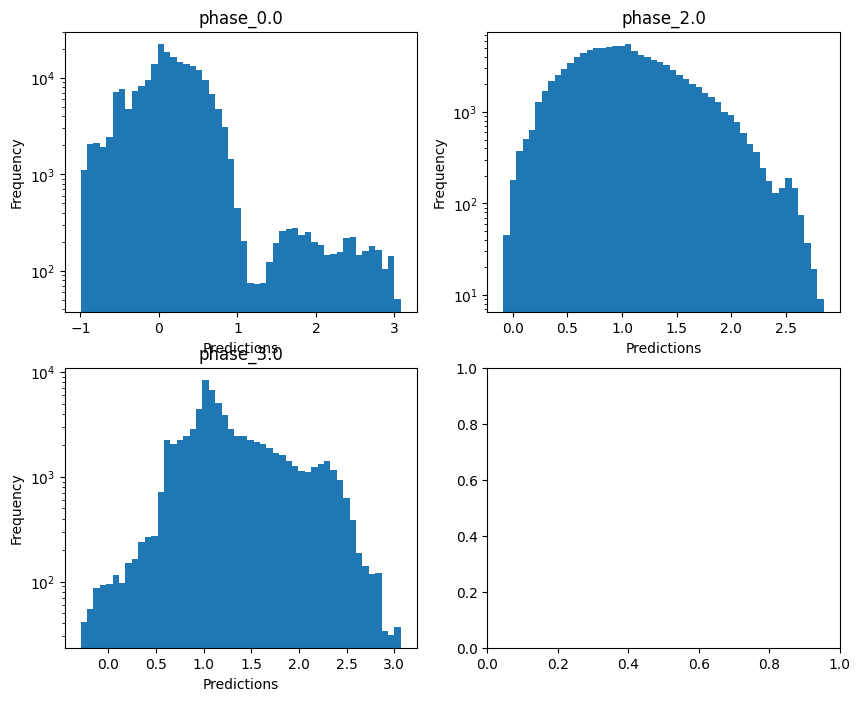

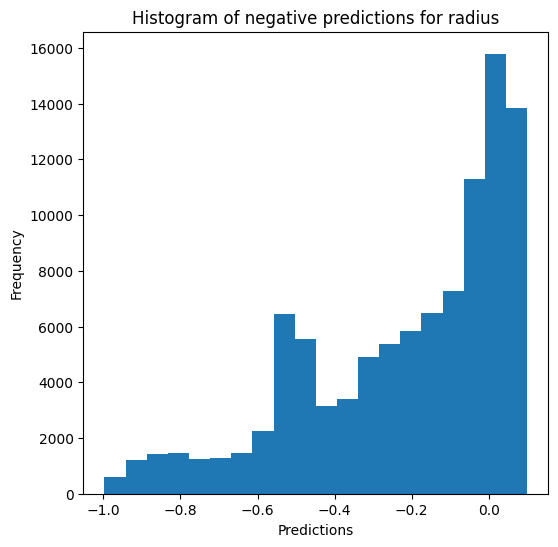

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9847594084690819
  RMSE :  0.03693579550476568
  MAE :  0.005961044805386298
  MedAE :  0.0011475637715943066
  CORR :  0.9924055869394738
  MAX_ER :  0.9159855246266679
  Percentiles : 
    75th percentile :  0.0025299124791606786
    90th percentile :  0.005291067576063037
    95th percentile :  0.008659409659898544
    99th percentile :  0.12412513687216636

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9724161793517285
  RMSE :  0.040805846938456077
  MAE :  0.01829742957066378
  MedAE :  0.0026645875083213255
  CORR :  0.9861270504699984
  MAX_ER :  0.6260565282565982
  Percentiles : 
    75th percentile :  0.015498387502951183
    90th percentile :  0.062080

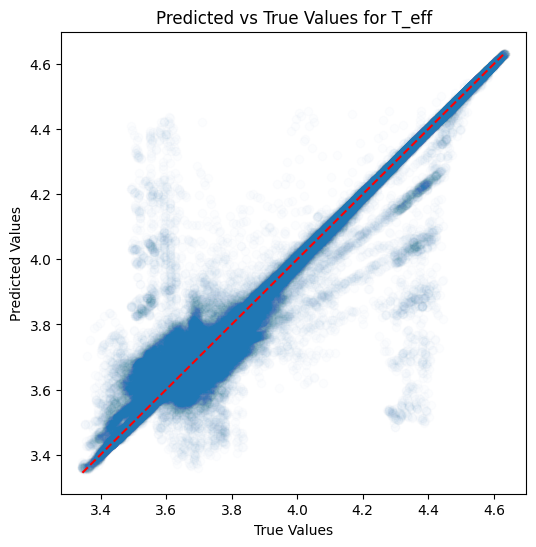

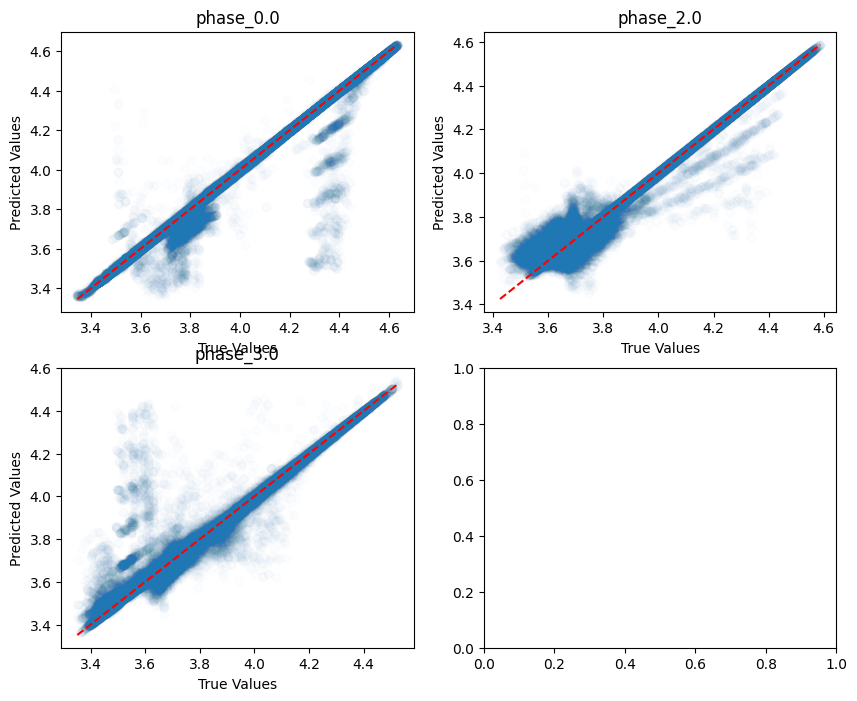

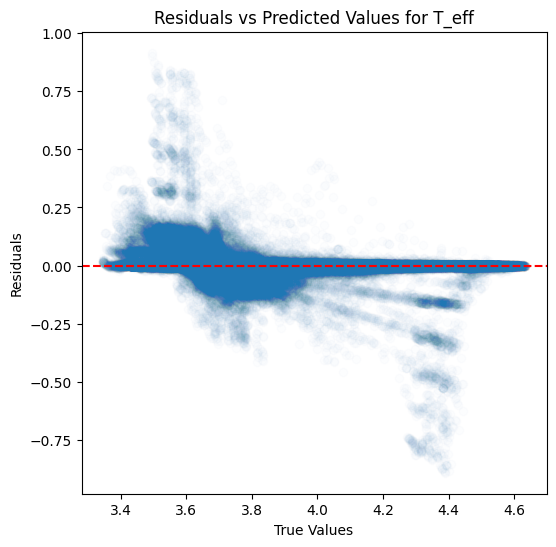

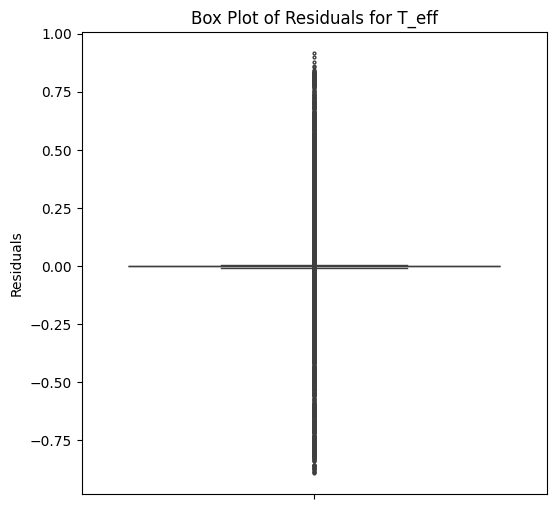

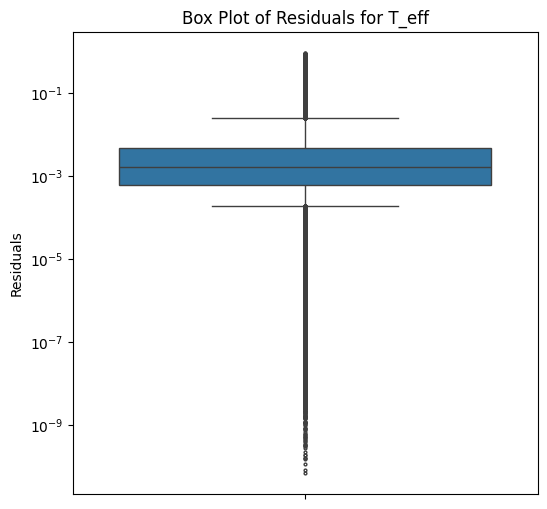

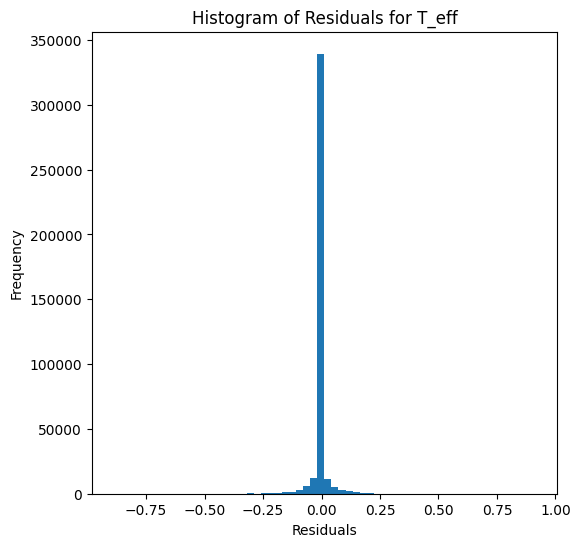

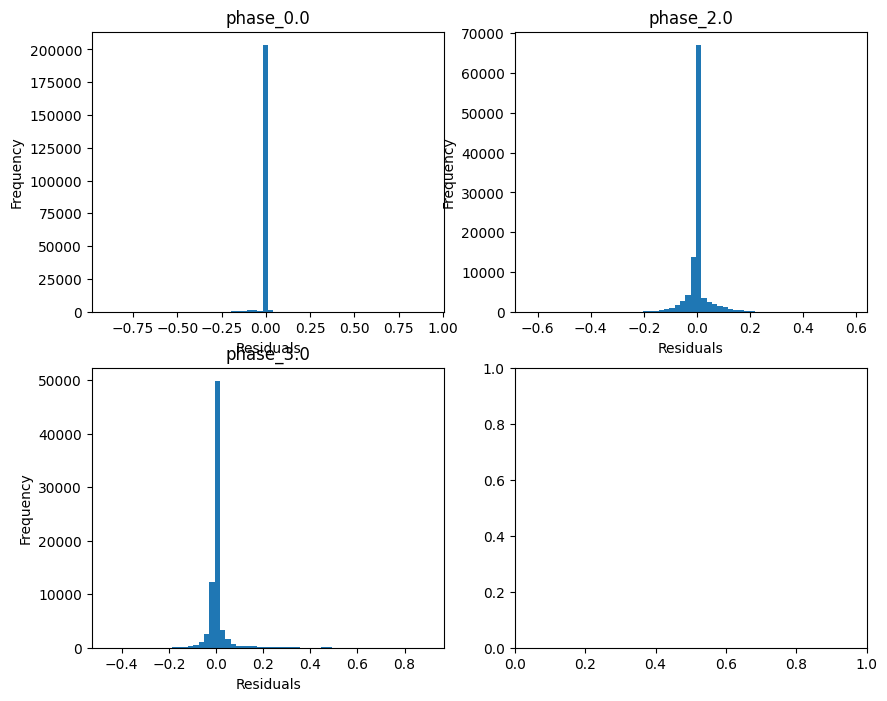

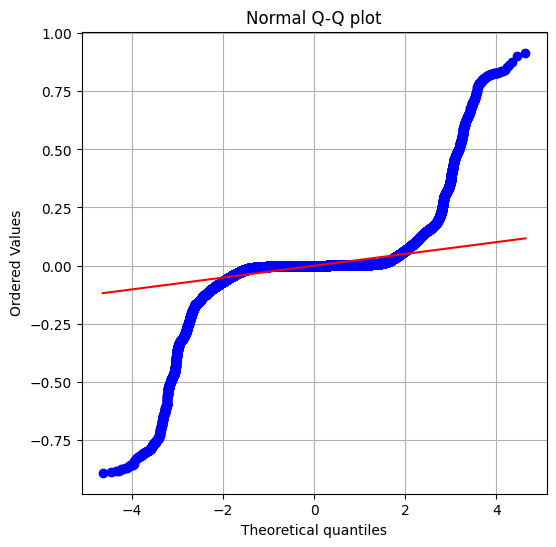

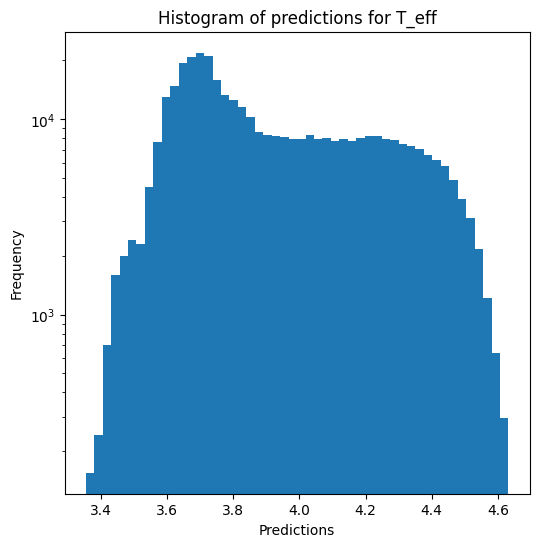

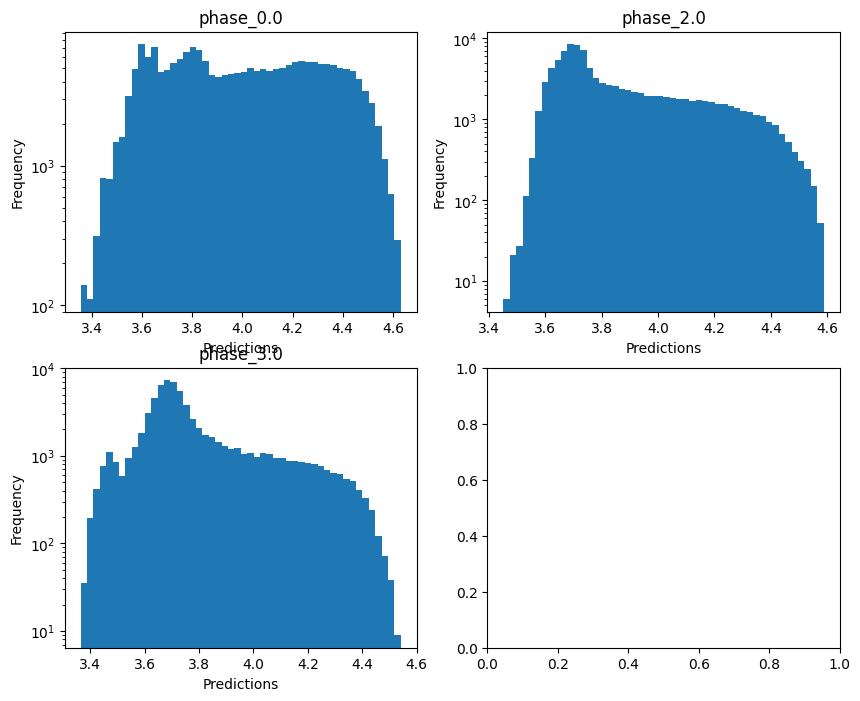


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.5162193052634259
  RMSE :  0.3198105480934307
  MAE :  0.047845795929095096
  MedAE :  0.0025475791116340574
  CORR :  0.8349375326645586
  MAX_ER :  5.545795164845766
  Percentiles : 
    75th percentile :  0.005928333229614502
    90th percentile :  0.013129525422324663
    95th percentile :  0.024091016358672626
    99th percentile :  1.7285229926644938

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5303123075394265
  RMSE :  0.6362343410520687
  MAE :  0.2939358566022489
  MedAE :  0.013088125859807676
  CORR :  0.7349547949015152
  MAX_ER :  4.330710890208363
  Percentiles : 
    75th percentile :  0.3127716402235827
    90th percentile :  1.126167359044974
    95th percentile :  1.5957279774559137
    99th percentile :  2.4083538429144684

log_g results for the phase category w

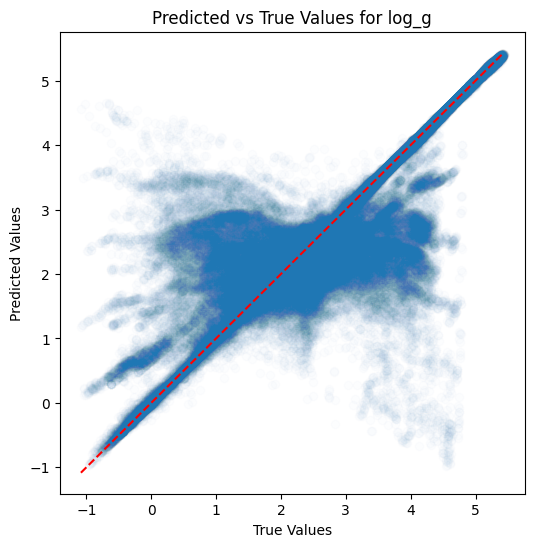

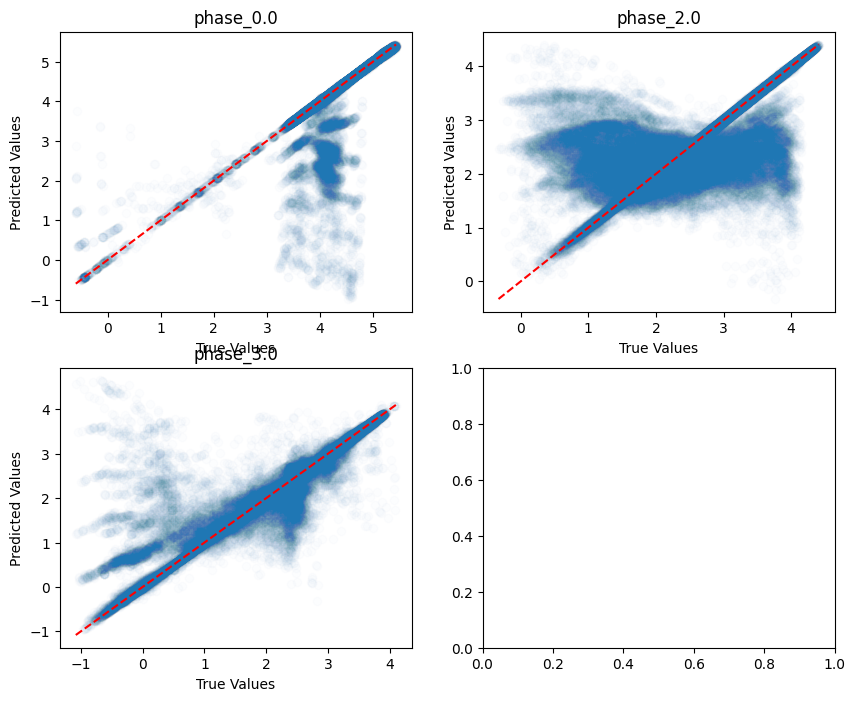

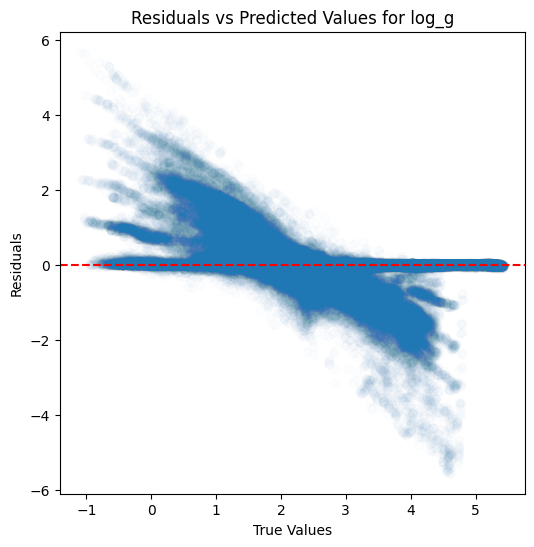

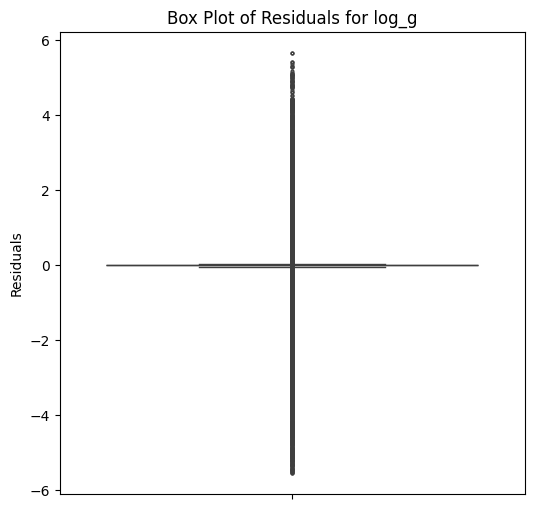

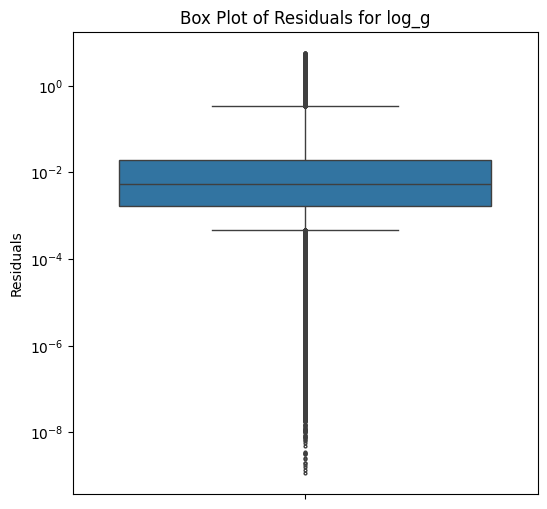

...

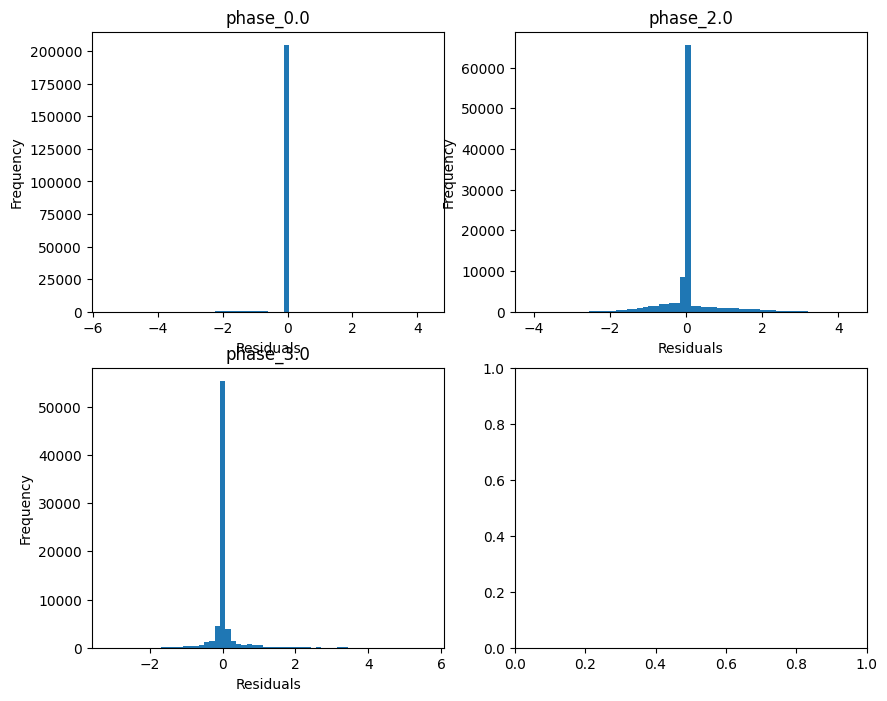

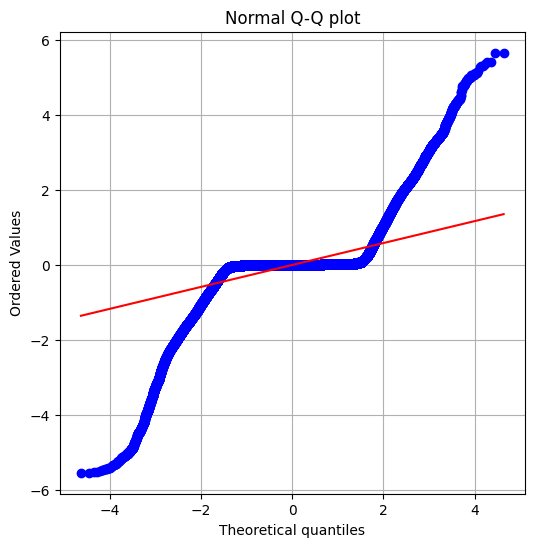

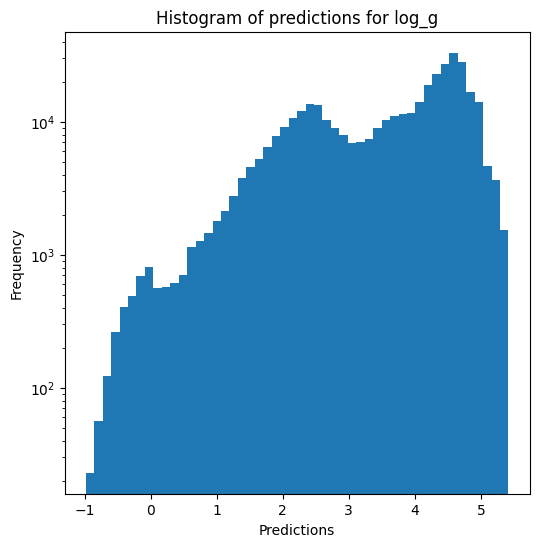

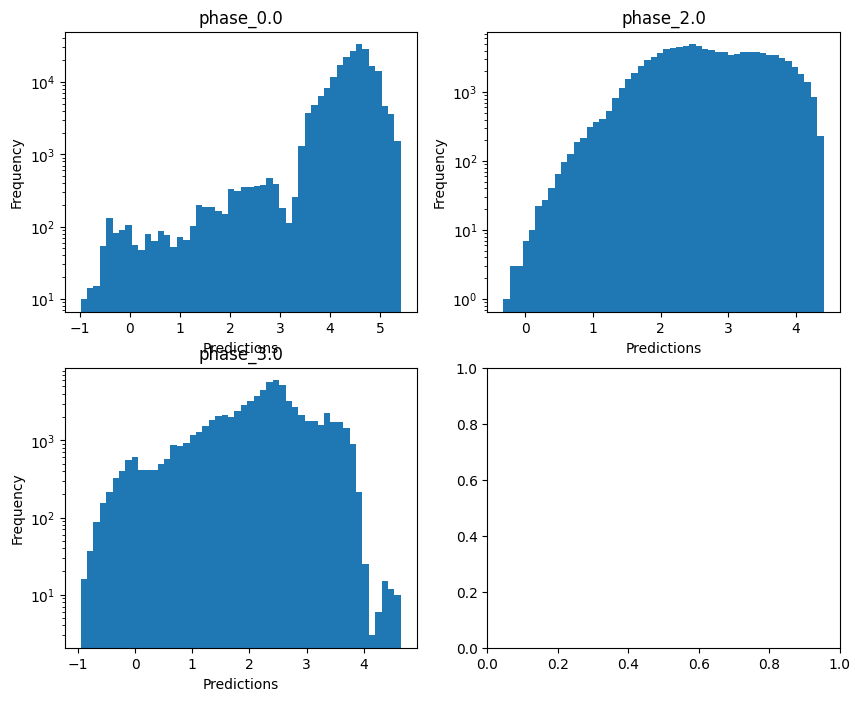

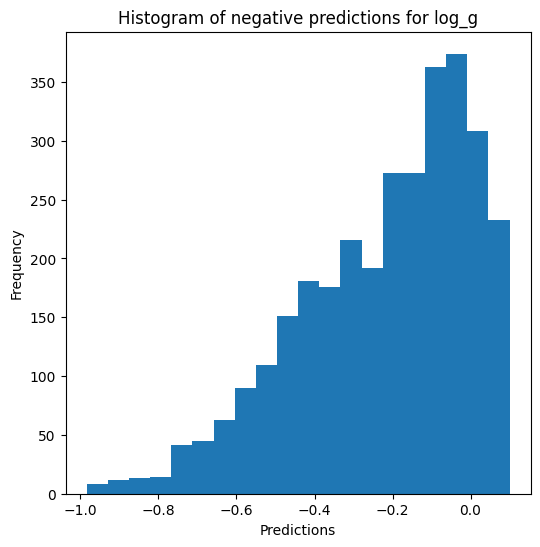


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8582192317234971
  RMSE :  0.16001045200347078
  MAE :  0.02532952520509246
  MedAE :  0.0021514633592309984
  CORR :  0.9370066290881761
  MAX_ER :  2.774405485576776
  Percentiles : 
    75th percentile :  0.00454325536338307
    90th percentile :  0.010001122297857051
    95th percentile :  0.019417473496761362
    99th percentile :  0.8644055509316735

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.5333019304174877
  RMSE :  0.3181112925136617
  MAE :  0.14697227306789126
  MedAE :  0.006558192996225398
  CORR :  0.7405883337799539
  MAX_ER :  2.16546836611197
  Percentiles : 
    75th percentile :  0.15639653669980128
    90th percentile :  0.5631670973370123
    95th percentile :  0.7979243566625472
    99th percentile :  1.204295821027935

radius results for the phase category

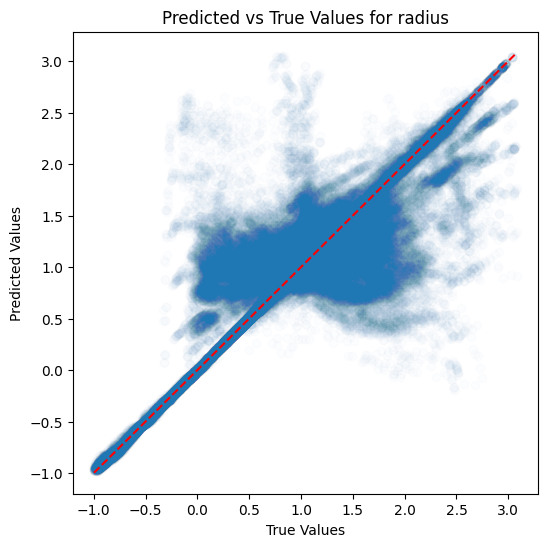

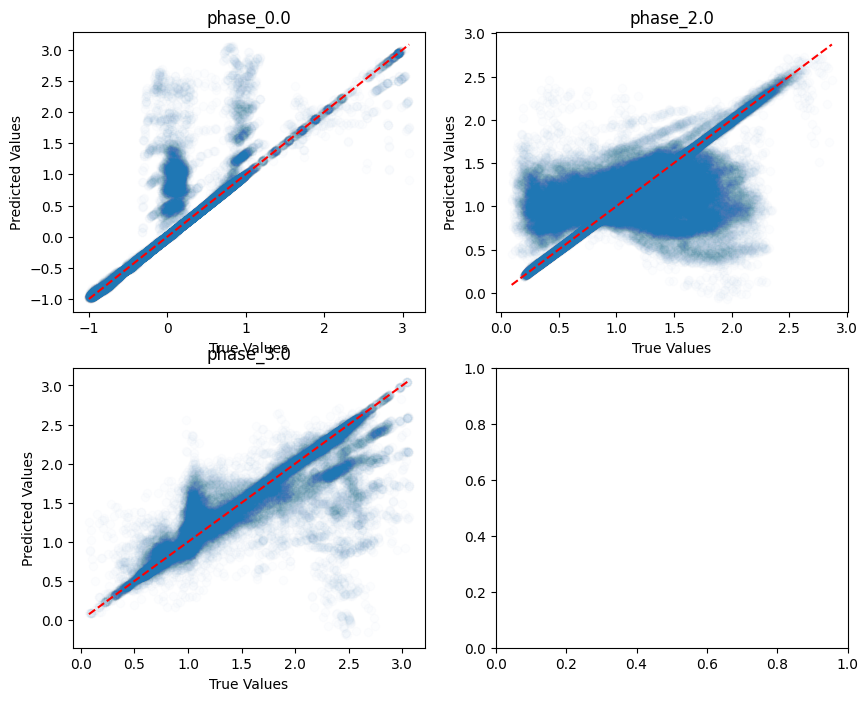

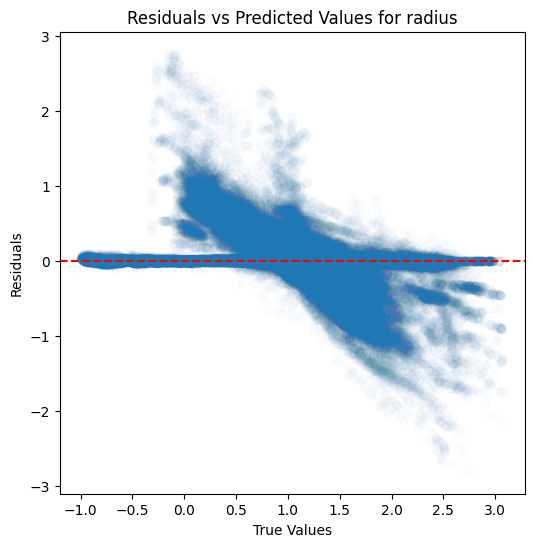

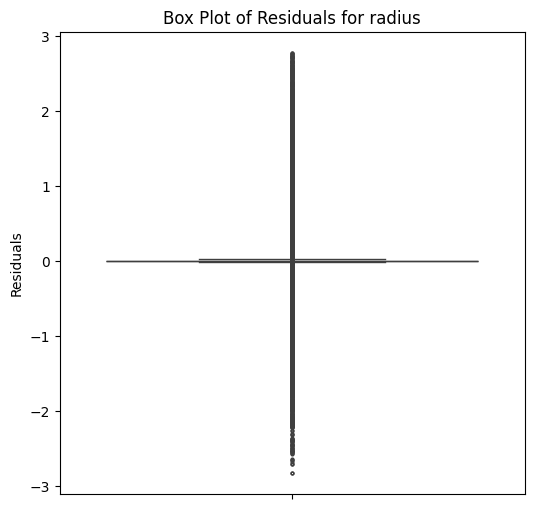

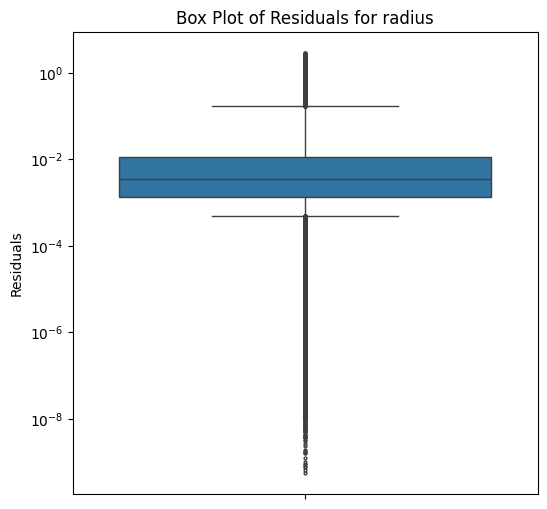

...

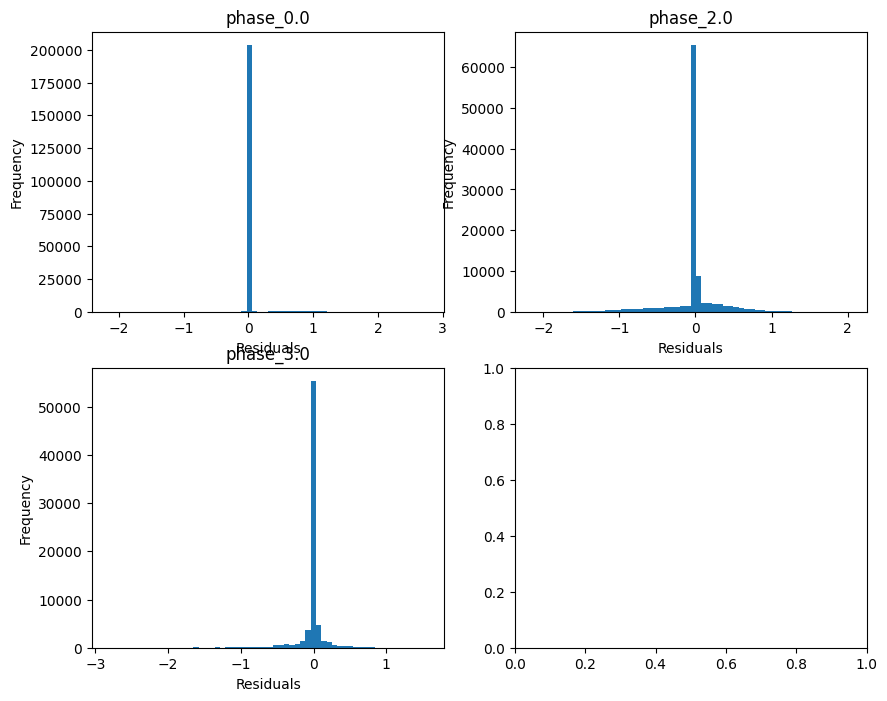

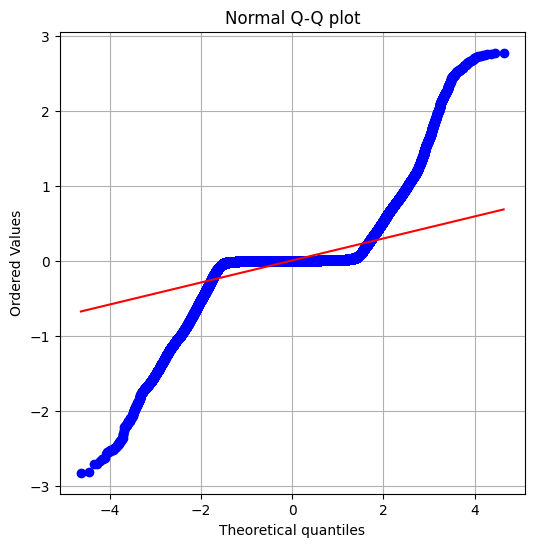

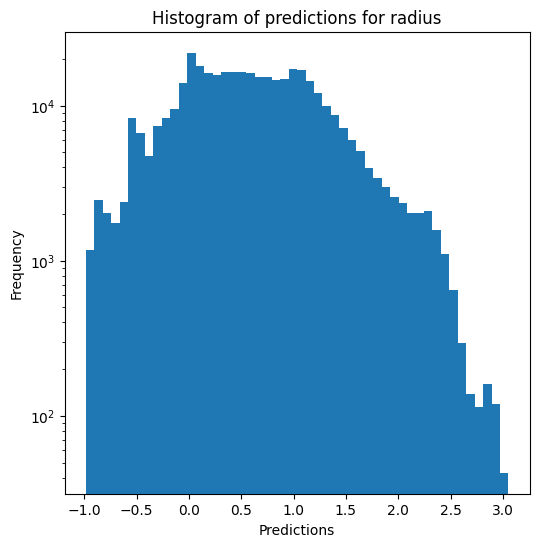

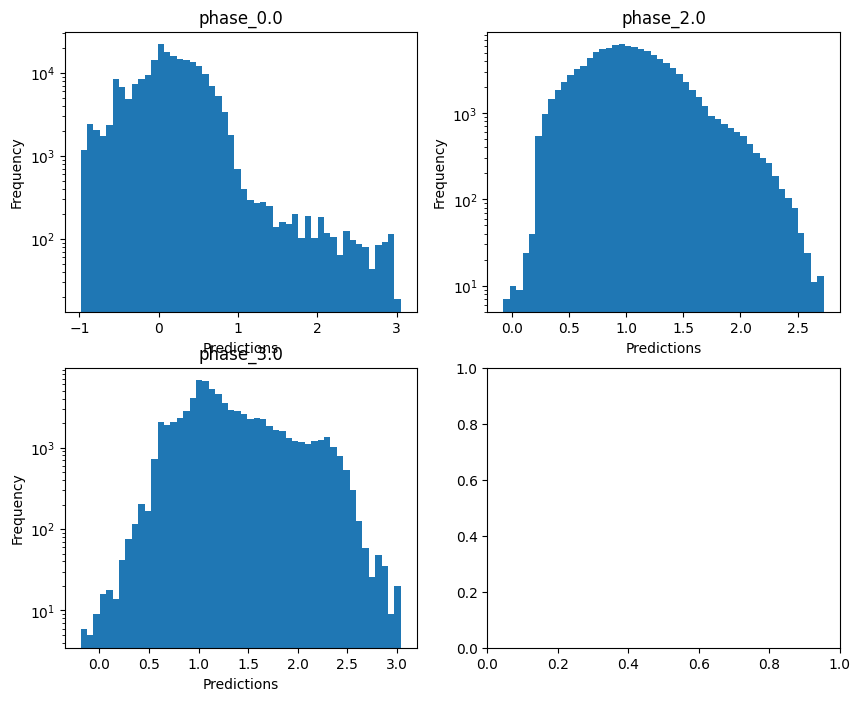

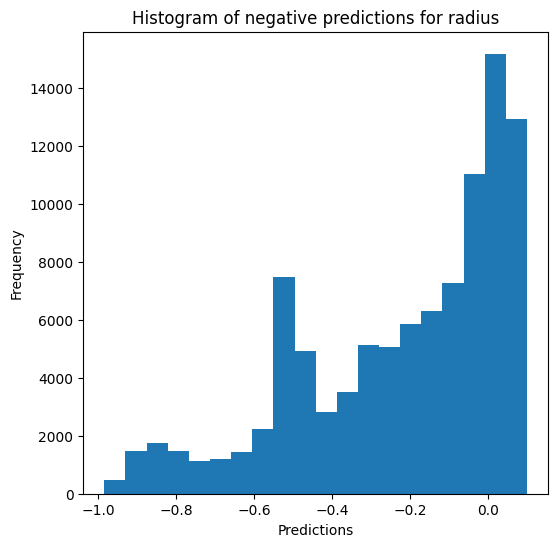

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9813070018855461
  RMSE :  0.04094239426621446
  MAE :  0.0059601451528629645
  MedAE :  0.0005292118977084925
  CORR :  0.9907199514009629
  MAX_ER :  0.8892732159160892
  Percentiles : 
    75th percentile :  0.0012988362798935782
    90th percentile :  0.003544111279833296
    95th percentile :  0.008629376829887441
    99th percentile :  0.14087049335439344

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9554652329660791
  RMSE :  0.051845168293338594
  MAE :  0.022261389497239527
  MedAE :  0.002651820483180023
  CORR :  0.9774887290045616
  MAX_ER :  0.7542817325596145
  Percentiles : 
    75th percentile :  0.017804850963612617
    90th percentile :  0.07715

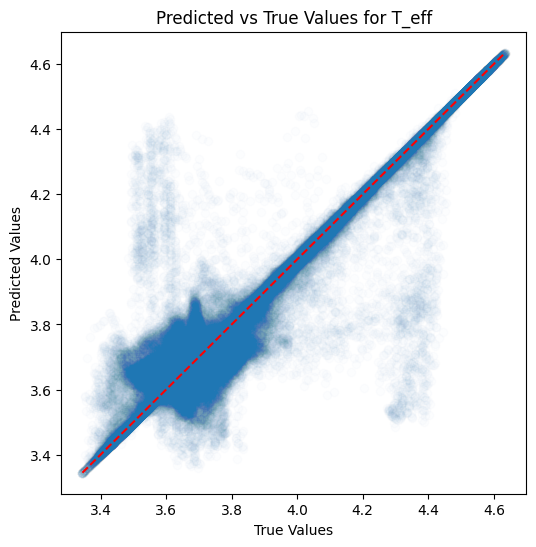

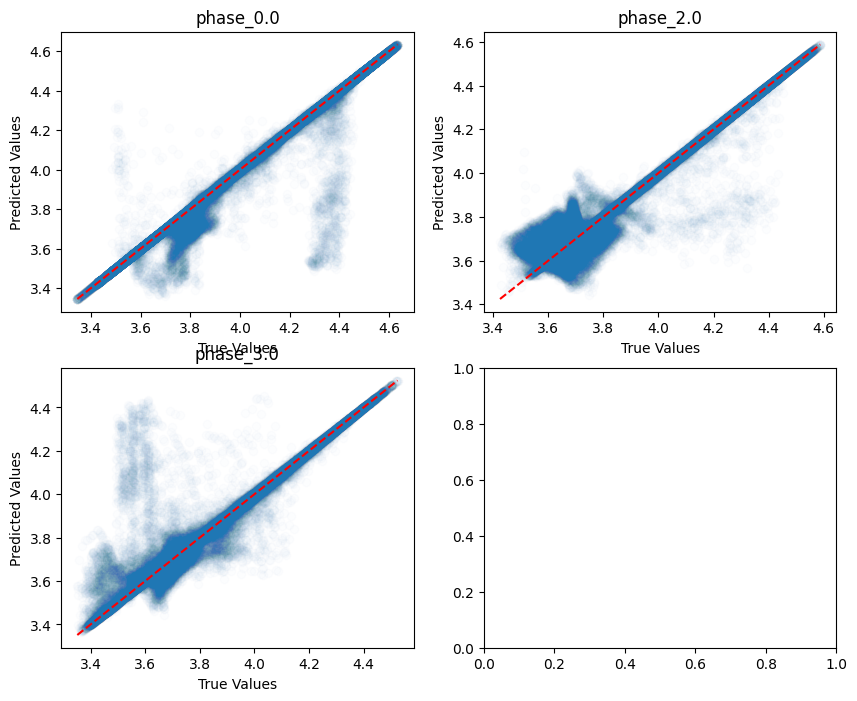

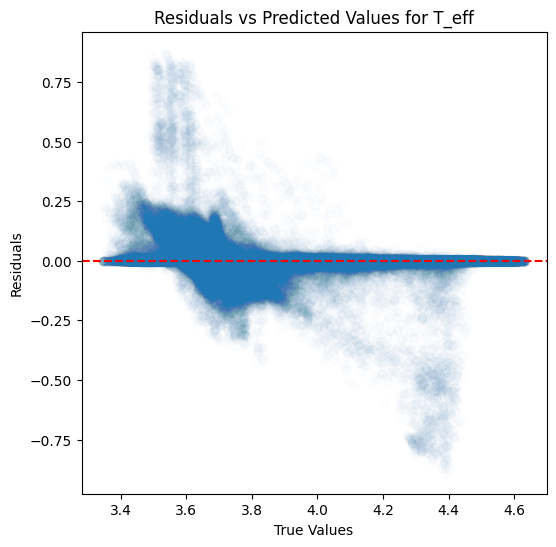

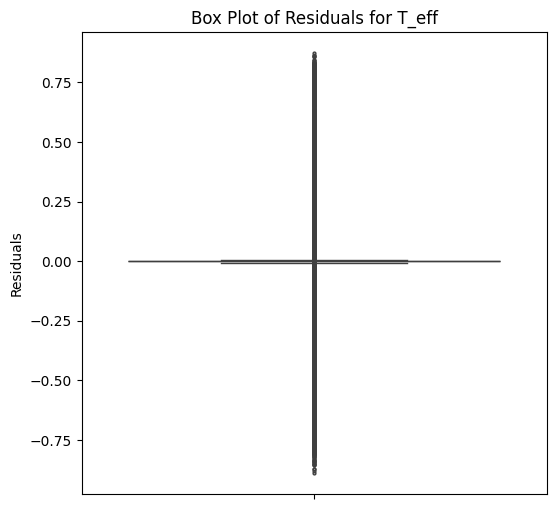

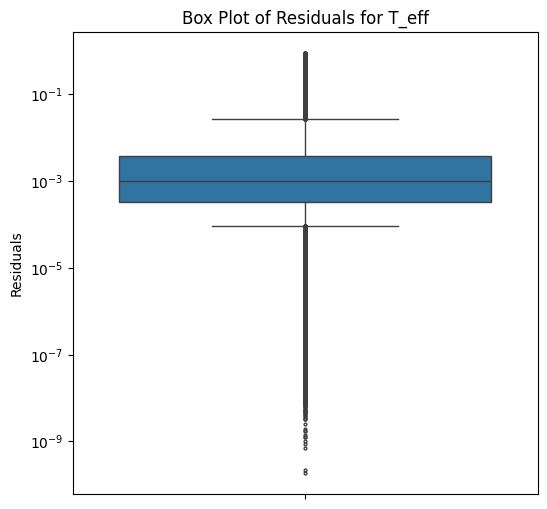

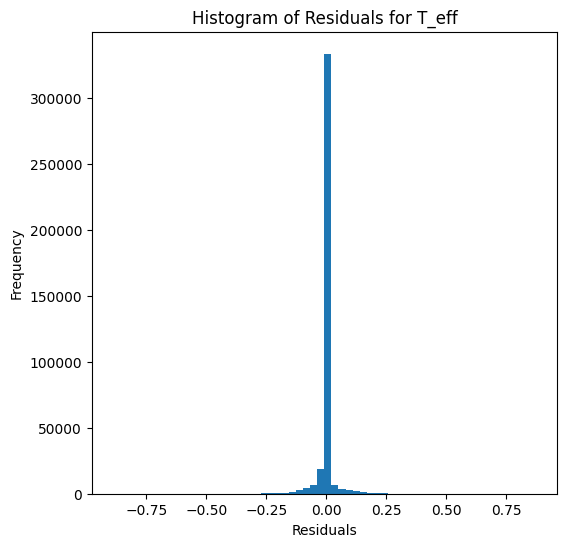

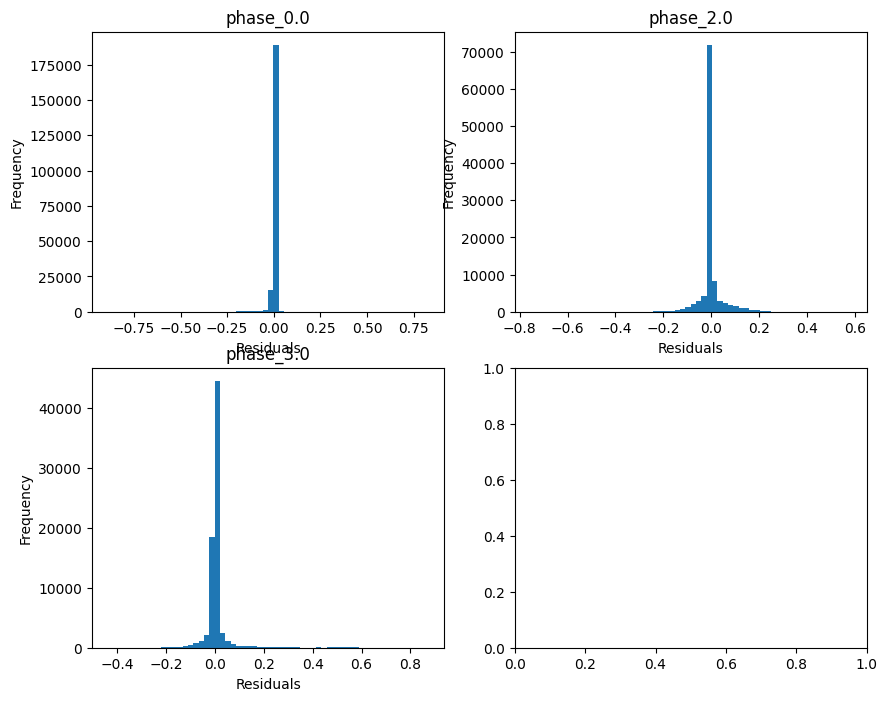

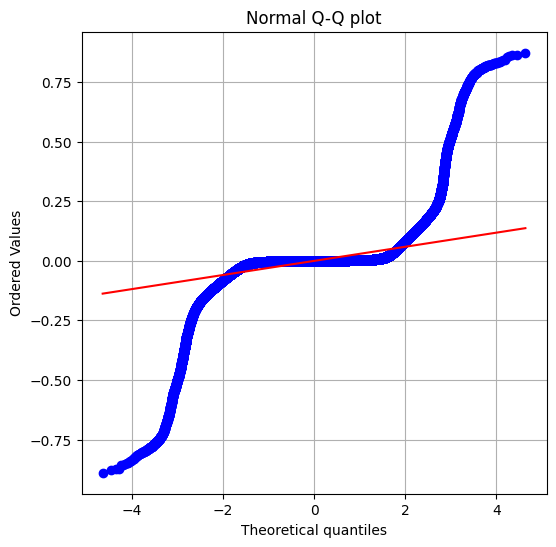

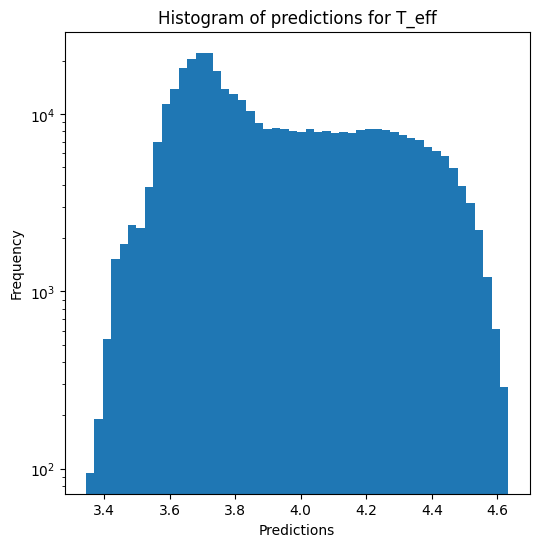

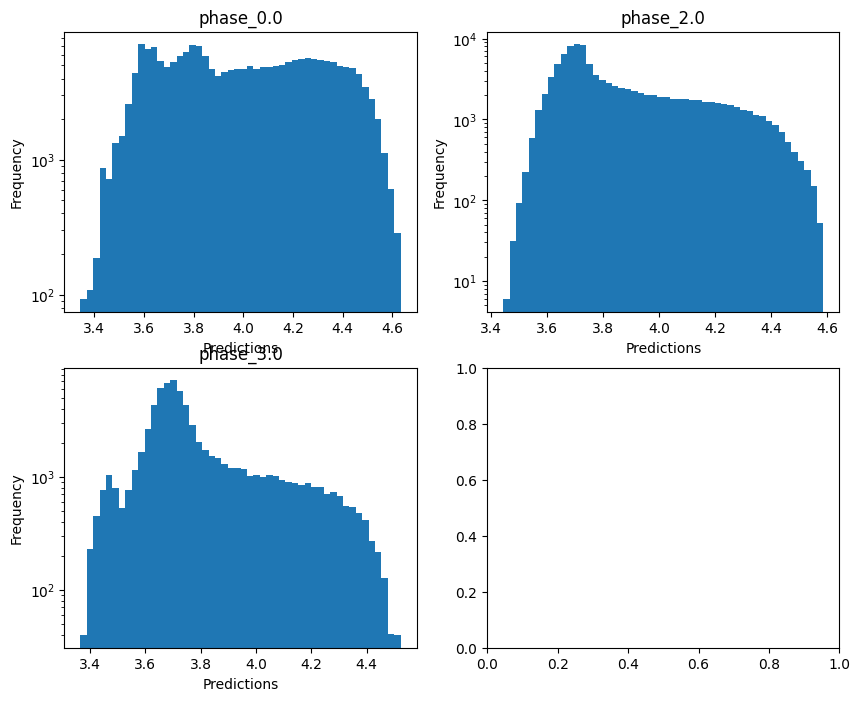


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.41076376677835114
  RMSE :  0.3534422914468464
  MAE :  0.05494400934784086
  MedAE :  0.001524512476225759
  CORR :  0.8117697356240084
  MAX_ER :  5.574067024286569
  Percentiles : 
    75th percentile :  0.004213228305929739
    90th percentile :  0.012279413923906553
    95th percentile :  0.04554982913763169
    99th percentile :  2.1438082397148714

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.28763808105151867
  RMSE :  0.7834527372678484
  MAE :  0.35950414502309014
  MedAE :  0.013471620966223785
  CORR :  0.60373428561346
  MAX_ER :  4.374872614518059
  Percentiles : 
    75th percentile :  0.33467393797936973
    90th percentile :  1.4369331638393648
    95th percentile :  2.0104470451503085
    99th percentile :  2.968658920805994

log_g results for the phase category wi

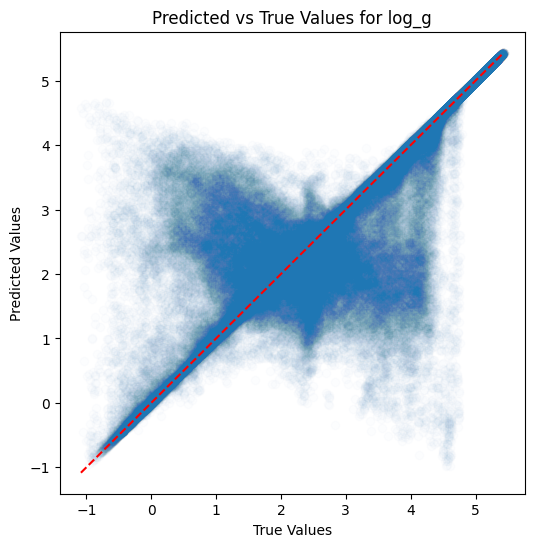

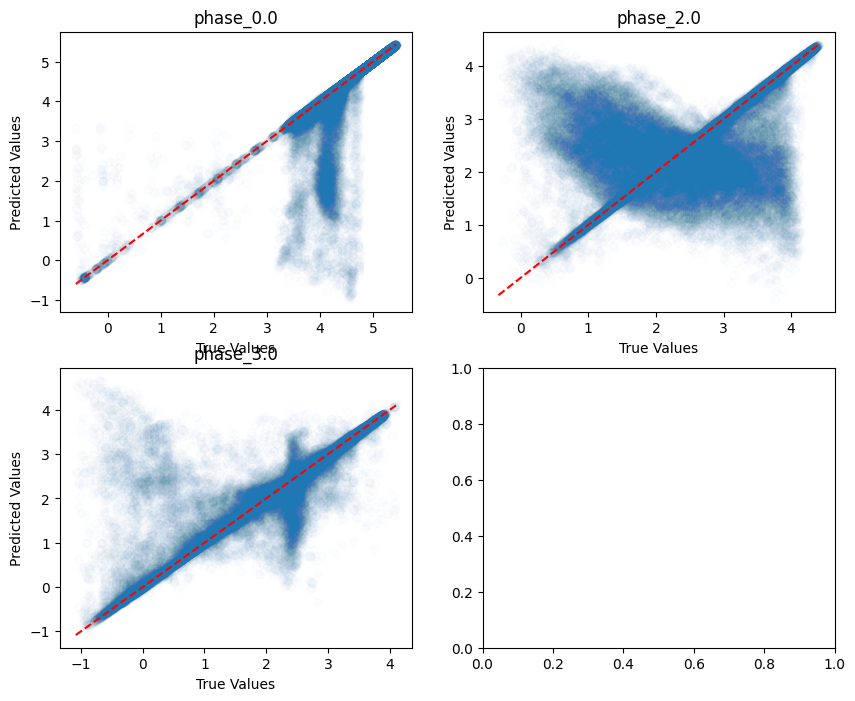

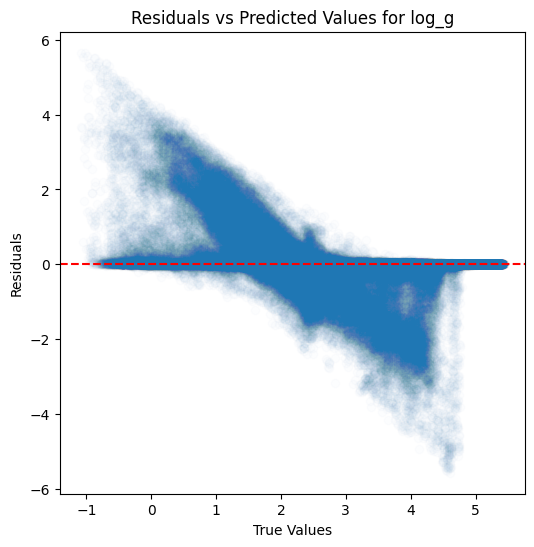

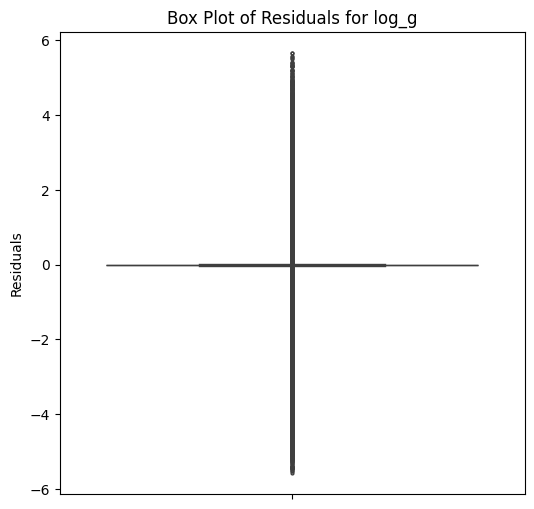

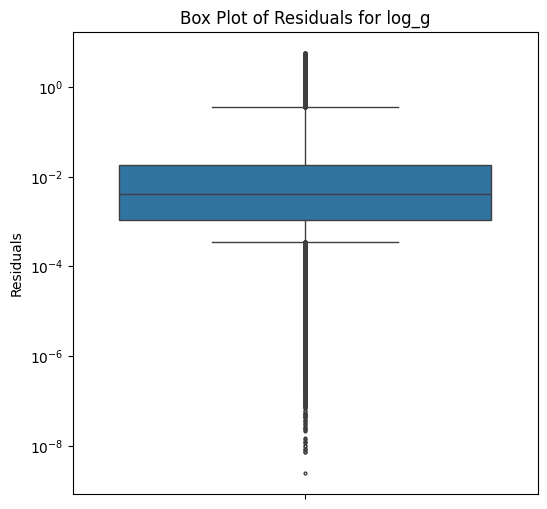

...

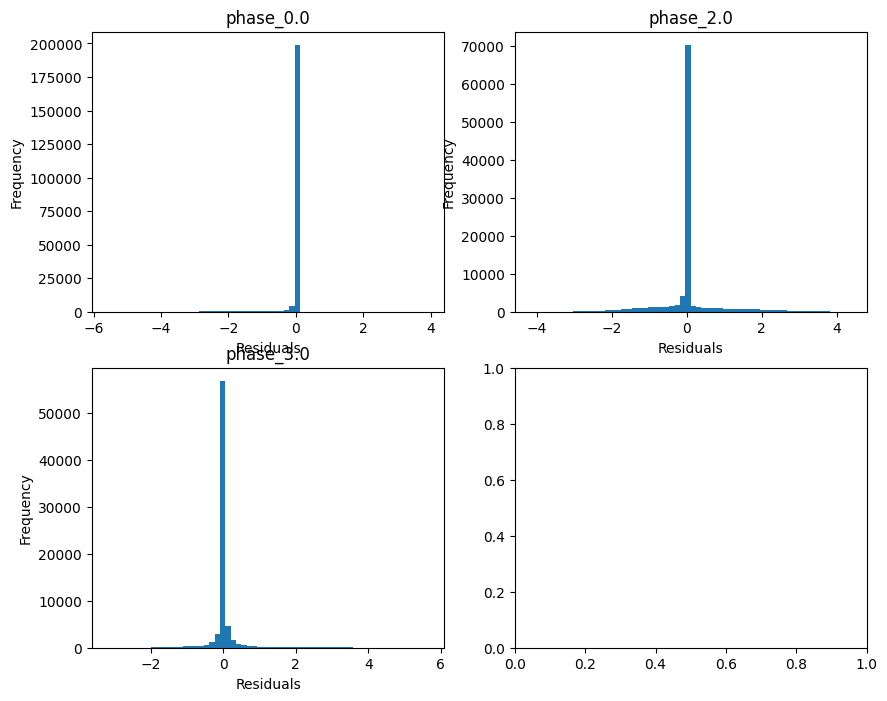

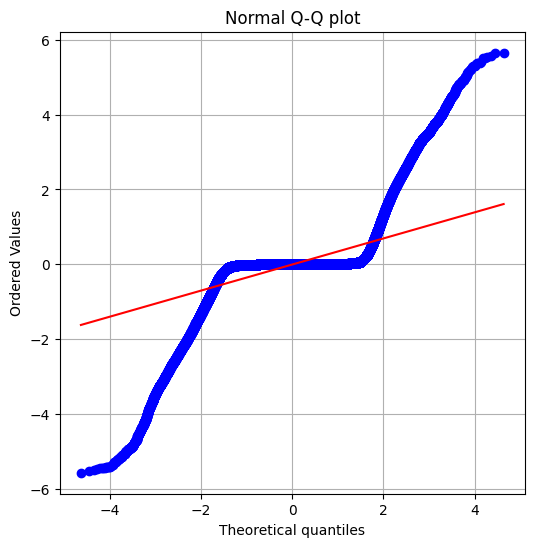

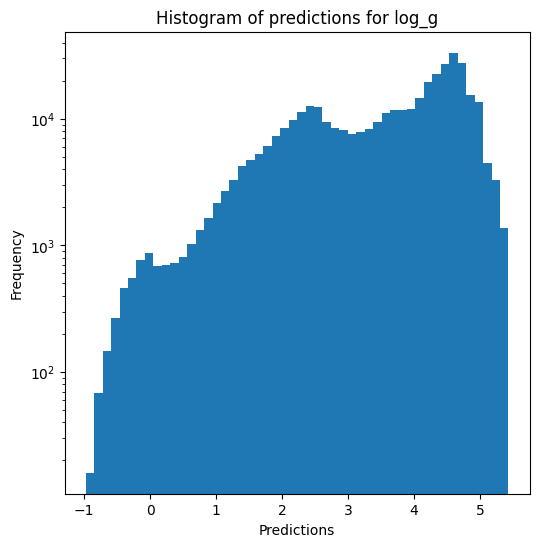

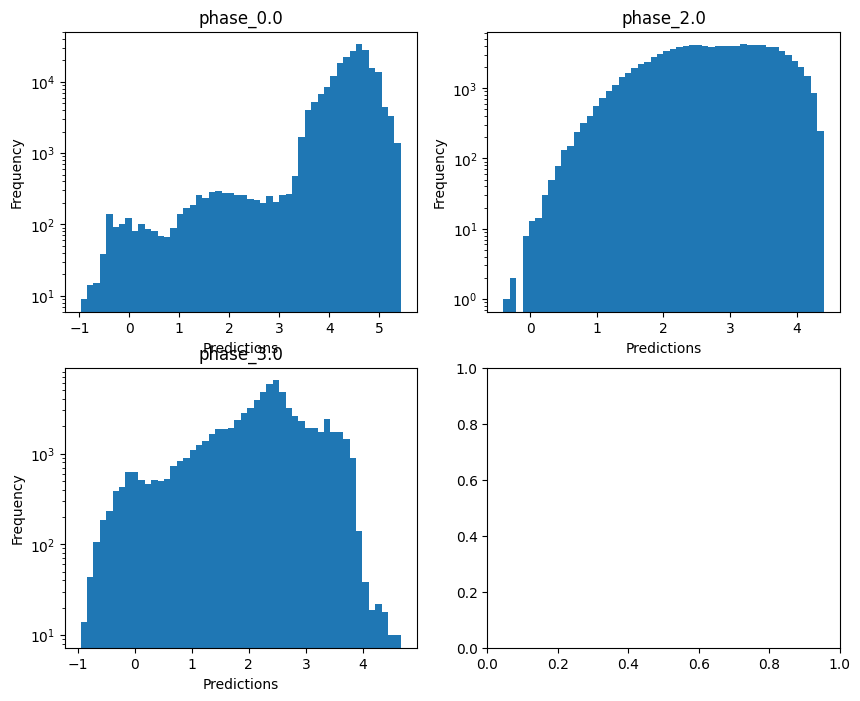

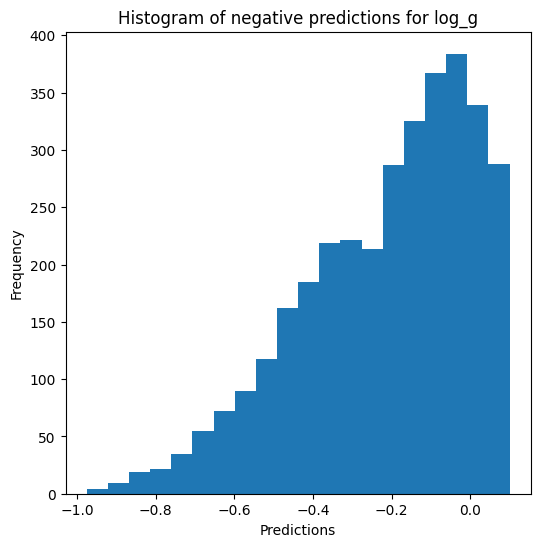


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8275106479690676
  RMSE :  0.17673903472789382
  MAE :  0.02769902613926617
  MedAE :  0.0009701626865948332
  CORR :  0.9250345237660491
  MAX_ER :  2.7886633522294173
  Percentiles : 
    75th percentile :  0.0024945287063432575
    90th percentile :  0.006717326237031666
    95th percentile :  0.02298756869924173
    99th percentile :  1.0719977424415525

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.29218053041048053
  RMSE :  0.3917170261777726
  MAE :  0.17975253068696376
  MedAE :  0.006744685962283947
  CORR :  0.6168218010996567
  MAX_ER :  2.1873520563363025
  Percentiles : 
    75th percentile :  0.16735678348781285
    90th percentile :  0.7183858439908432
    95th percentile :  1.0049215746898574
    99th percentile :  1.4843195812351204

radius results for the phase ca

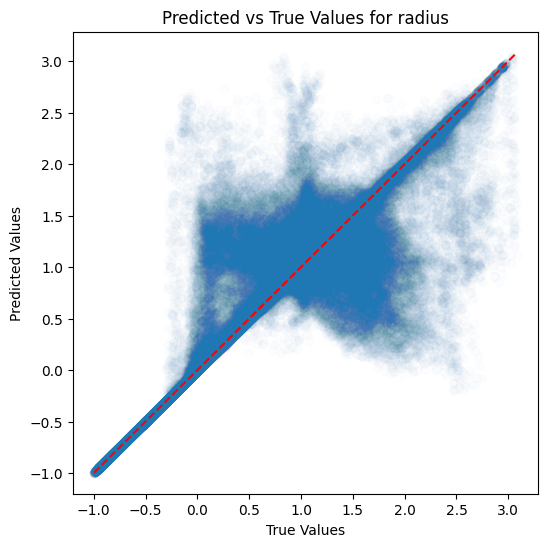

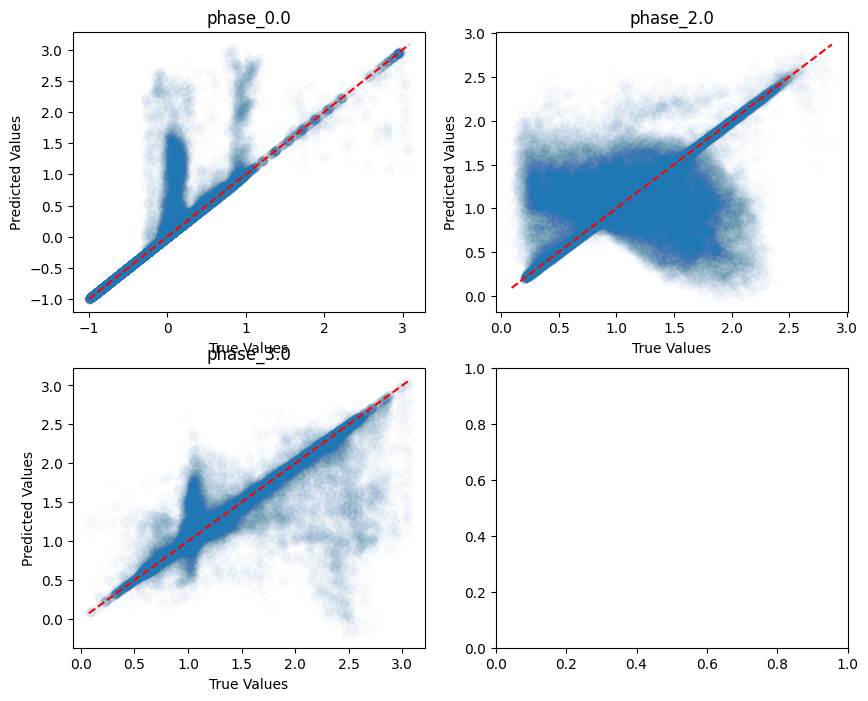

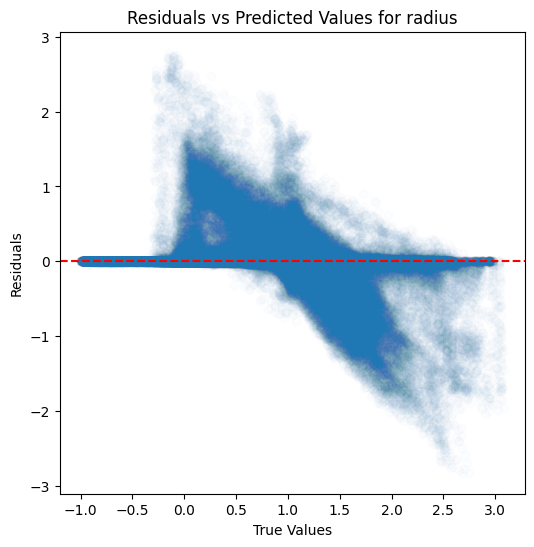

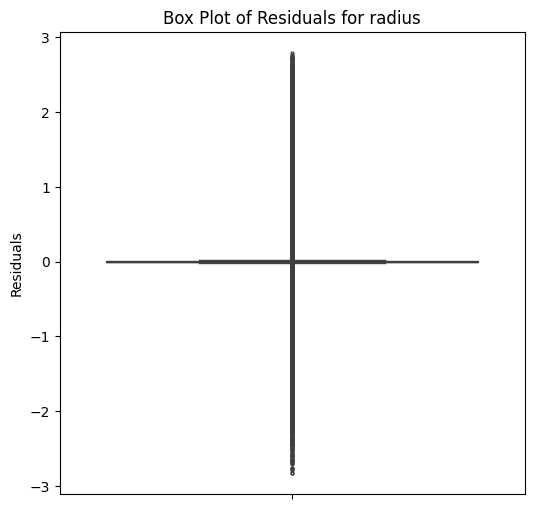

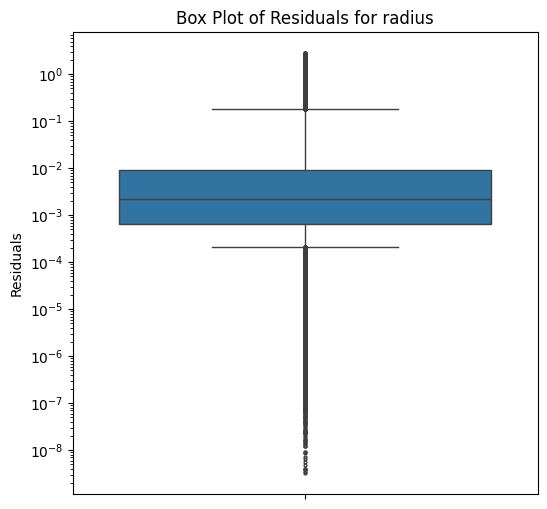

...

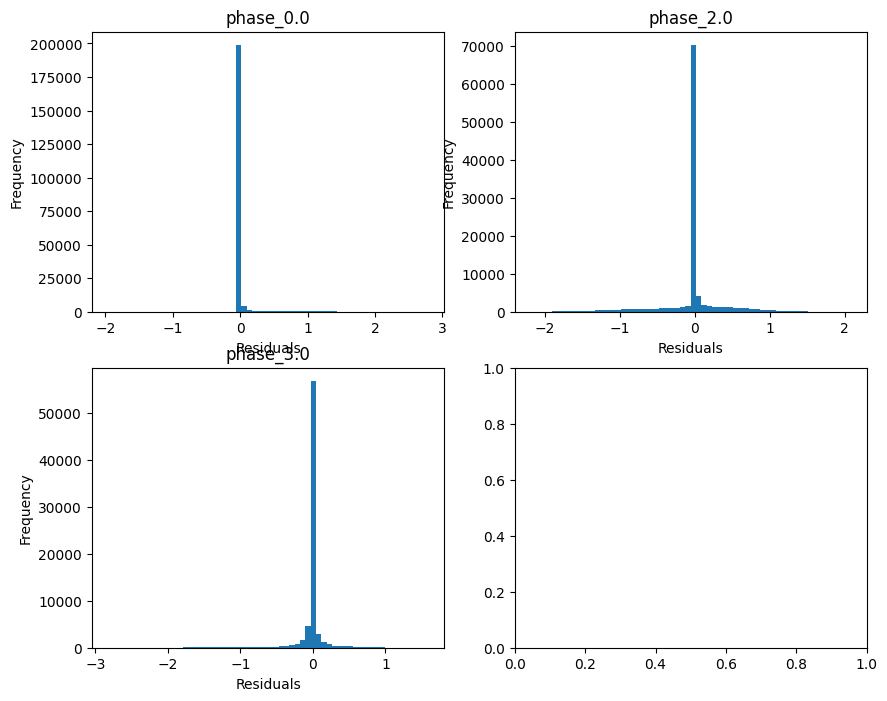

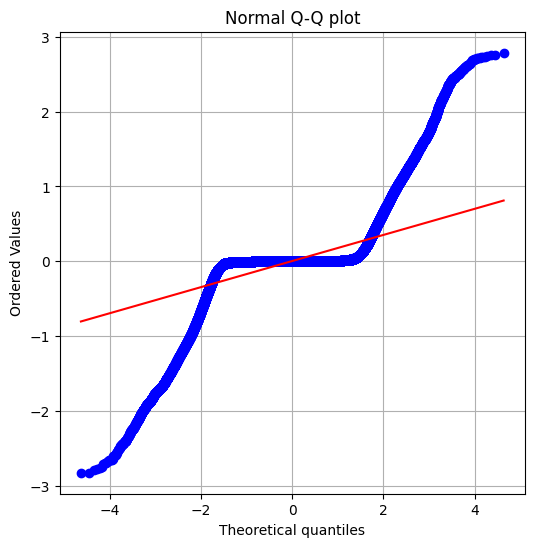

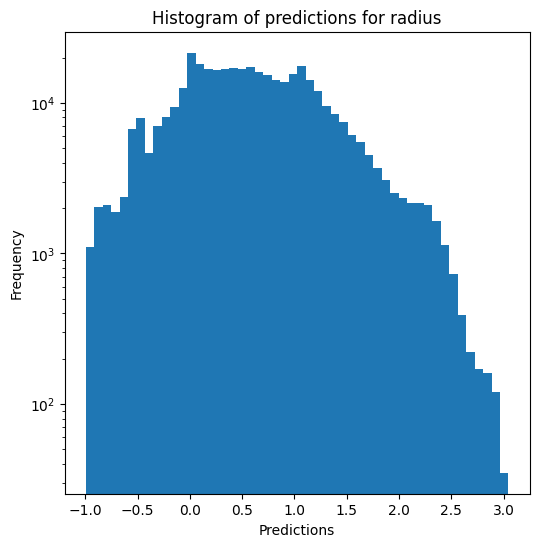

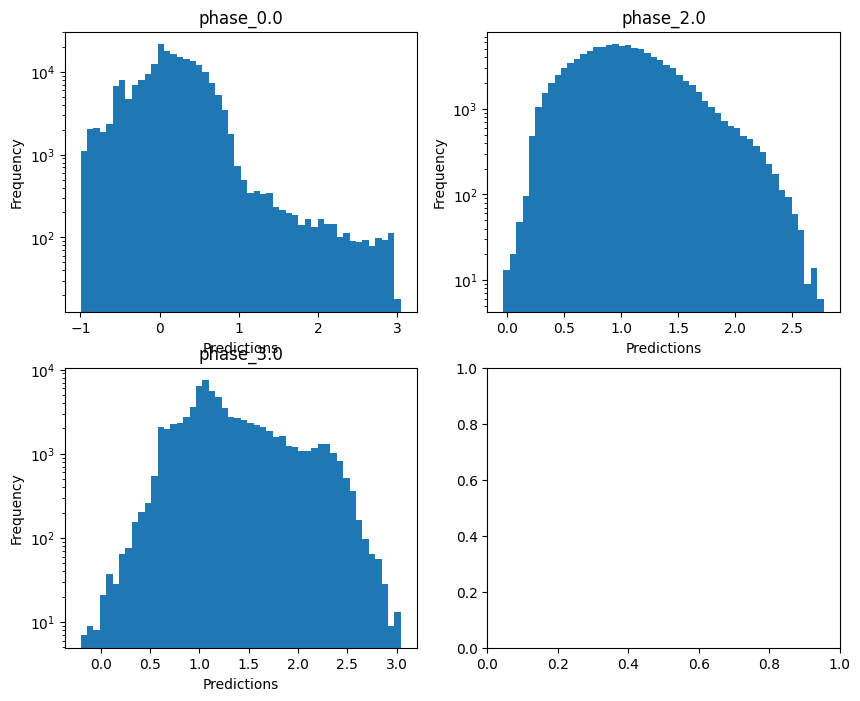

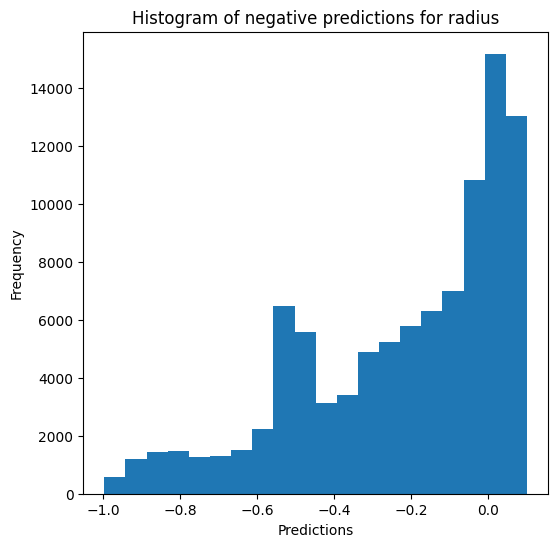

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.932921587854237
  RMSE :  0.08437701221951725
  MAE :  0.044226703947409476
  MedAE :  0.012464562894508369
  CORR :  0.9659427365347003
  MAX_ER :  0.8040913305138306
  Percentiles : 
    75th percentile :  0.04914504008351628
    90th percentile :  0.13743180378978476
    95th percentile :  0.2009425365312931
    99th percentile :  0.3371972622751056

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7786497498527037
  RMSE :  0.1184727474545974
  MAE :  0.08983272916457222
  MedAE :  0.06998039816737389
  CORR :  0.8824789623510839
  MAX_ER :  0.5231523927126212
  Percentiles : 
    75th percentile :  0.12399488900512468
    90th percentile :  0.19644118588601683
 

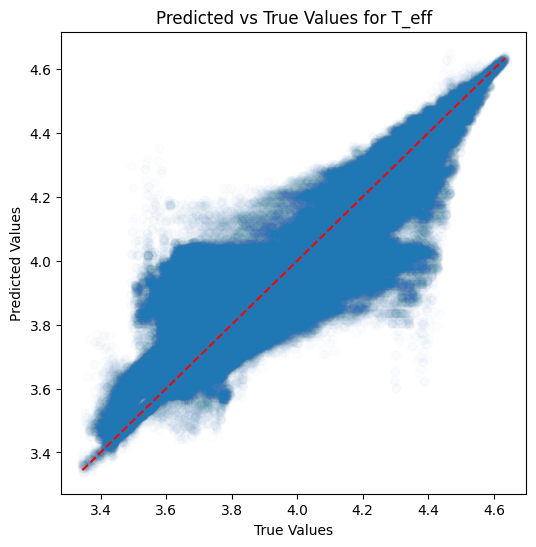

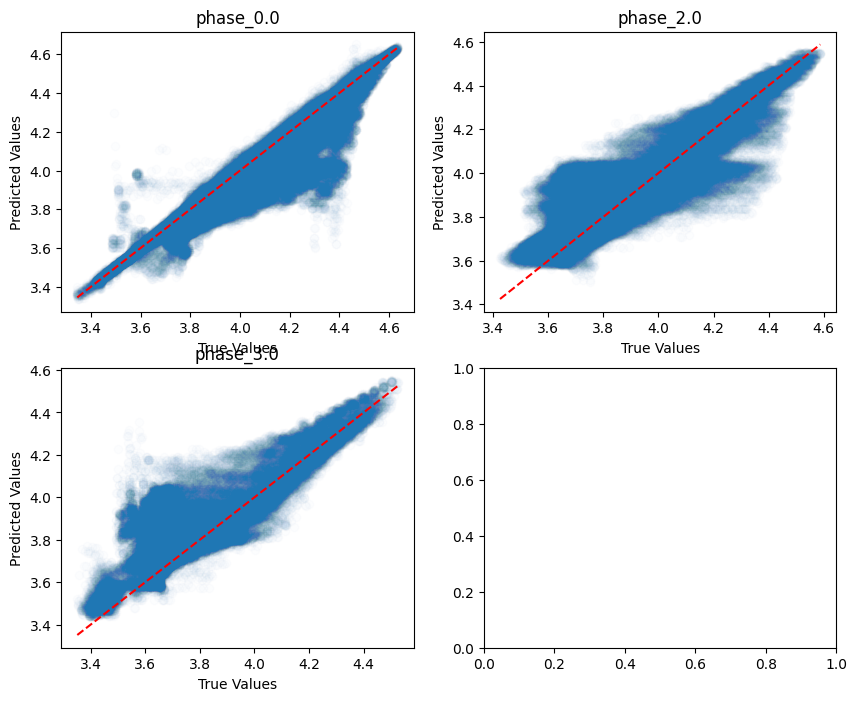

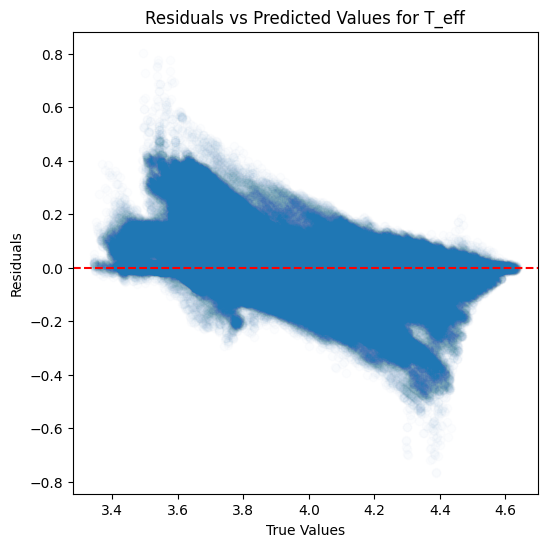

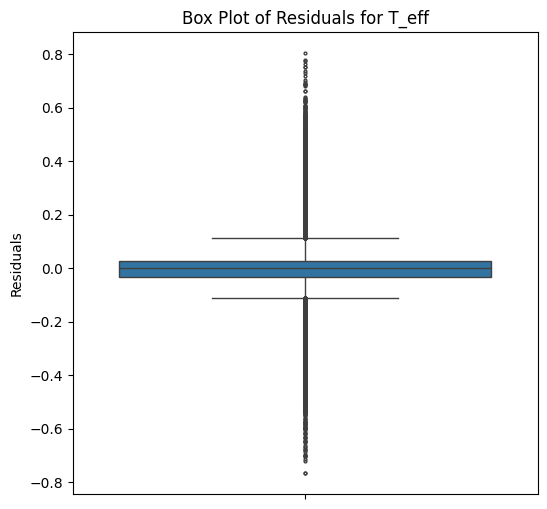

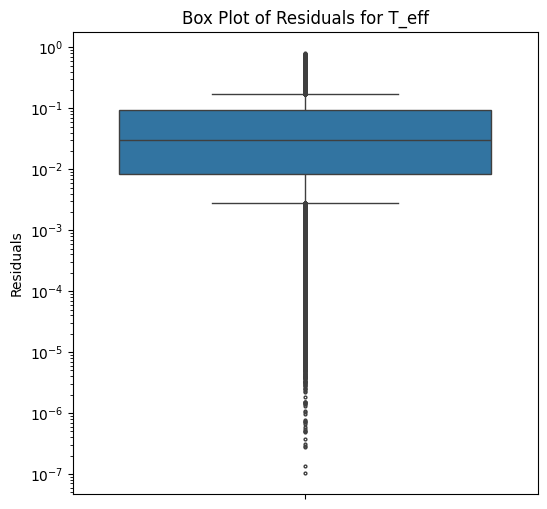

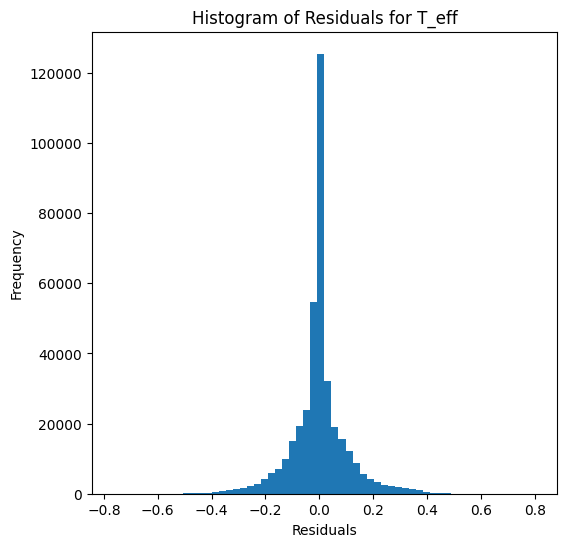

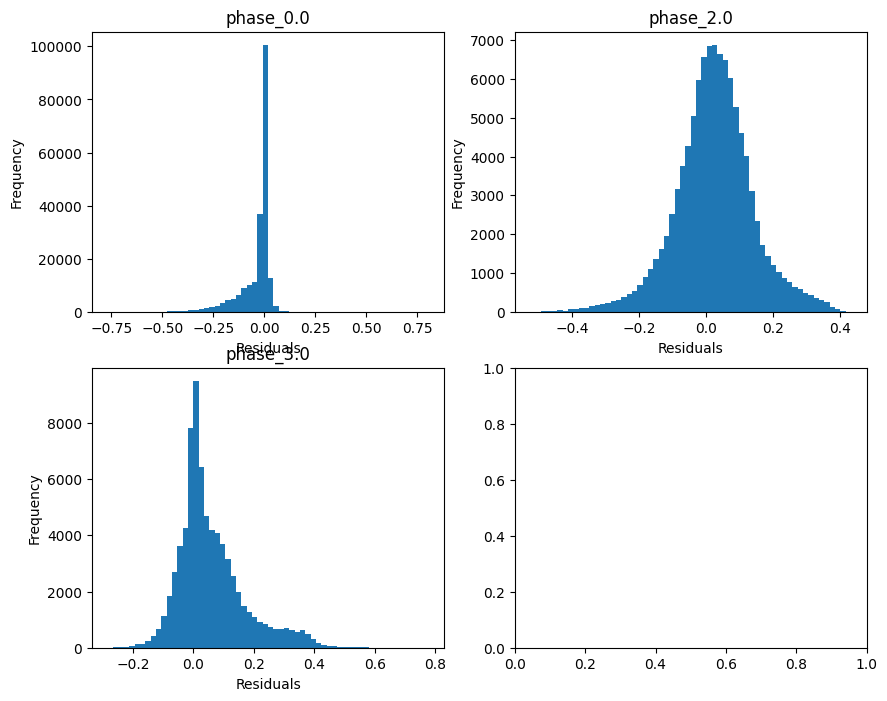

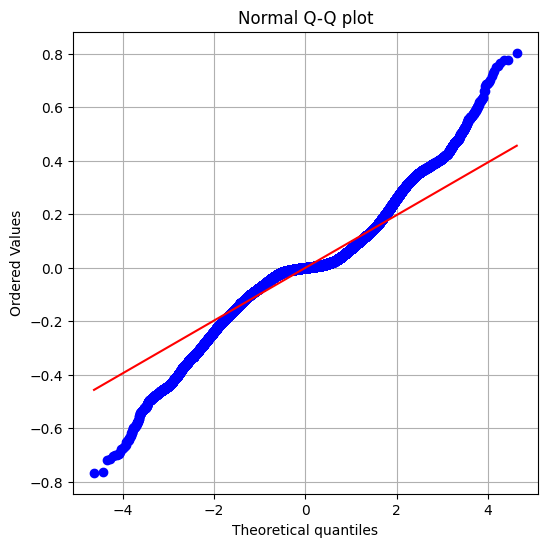

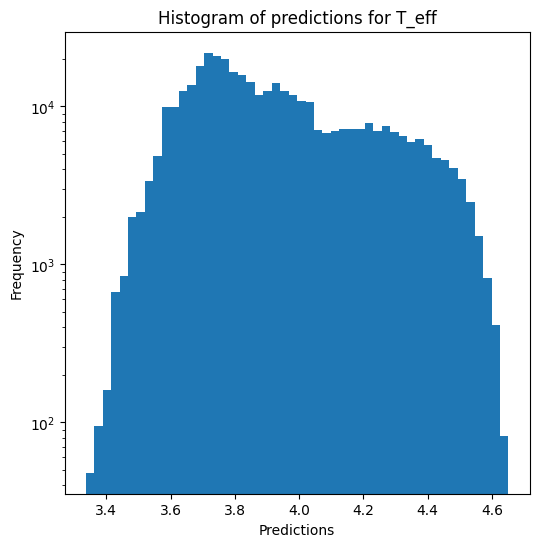

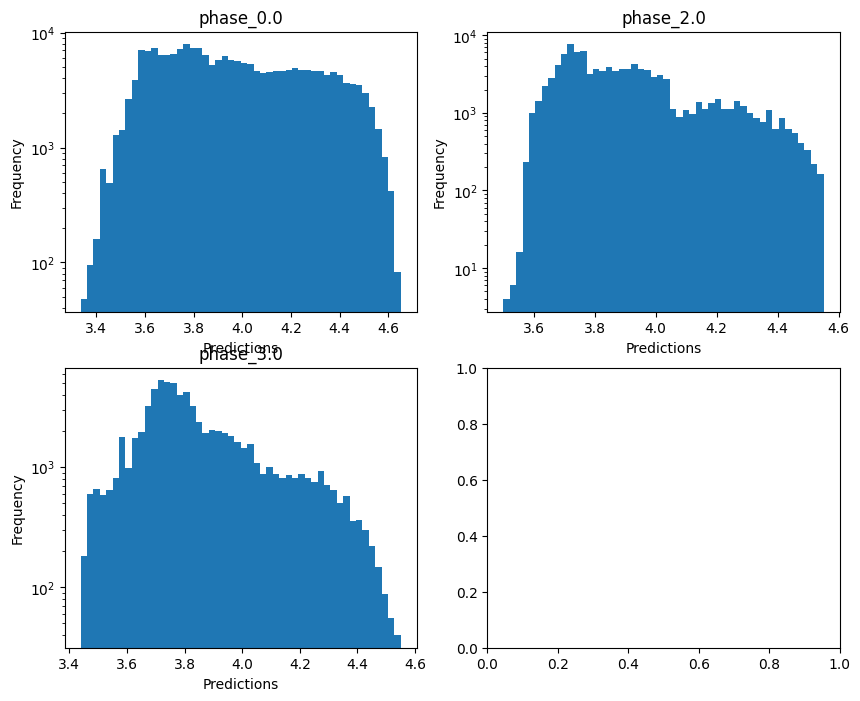


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.021904212748686813
  RMSE :  0.49544270587567374
  MAE :  0.26170088157730714
  MedAE :  0.06378554344742149
  CORR :  0.8406565411828604
  MAX_ER :  4.770746369705396
  Percentiles : 
    75th percentile :  0.31525945339232564
    90th percentile :  0.8458023901279212
    95th percentile :  1.1618127738136819
    99th percentile :  1.7208308285469112

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.36346191305835307
  RMSE :  0.7493588783406603
  MAE :  0.5818747733008509
  MedAE :  0.46623679251464933
  CORR :  0.6028781118353035
  MAX_ER :  3.784145573899452
  Percentiles : 
    75th percentile :  0.8340816352941091
    90th percentile :  1.2394371840251588
    95th percentile :  1.5053066796379277
    99th percentile :  2.0790485086898958

log_g results for the phase category with 

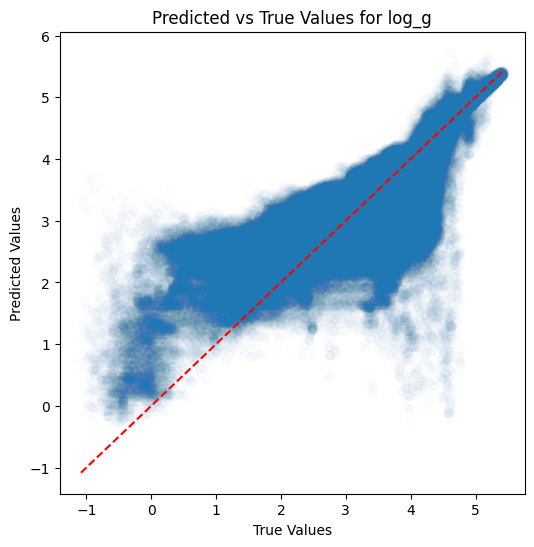

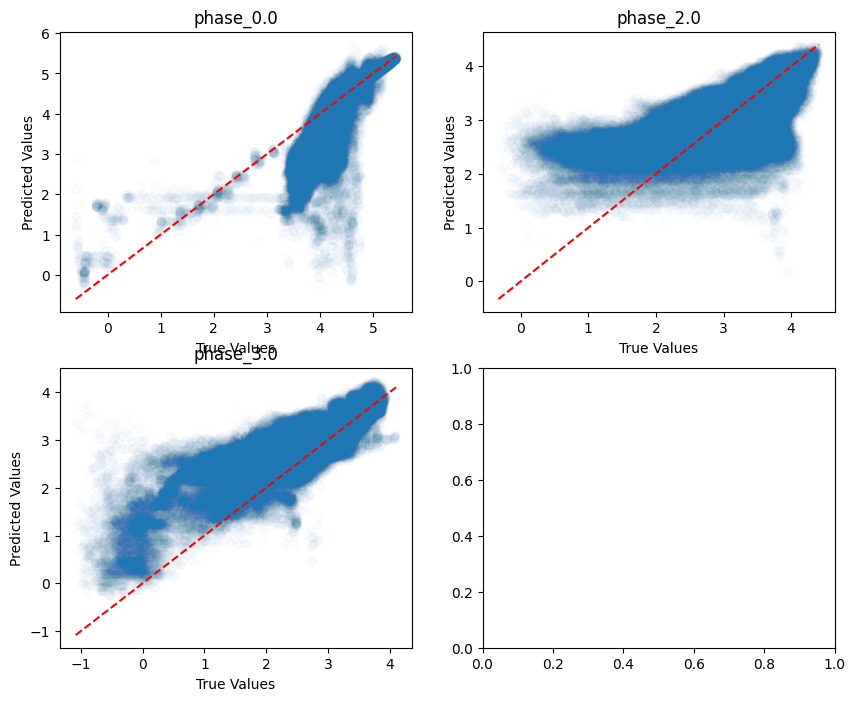

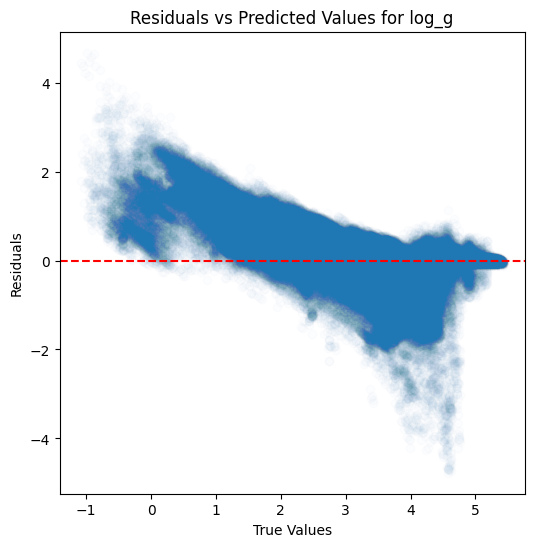

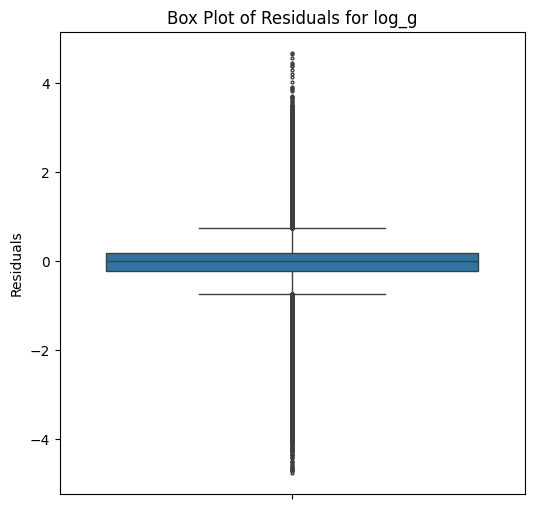

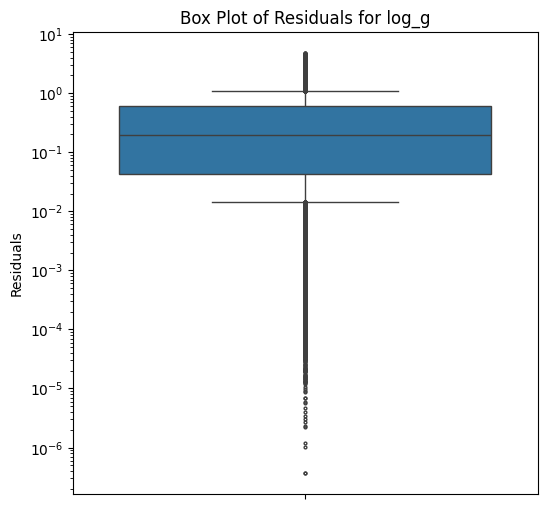

...

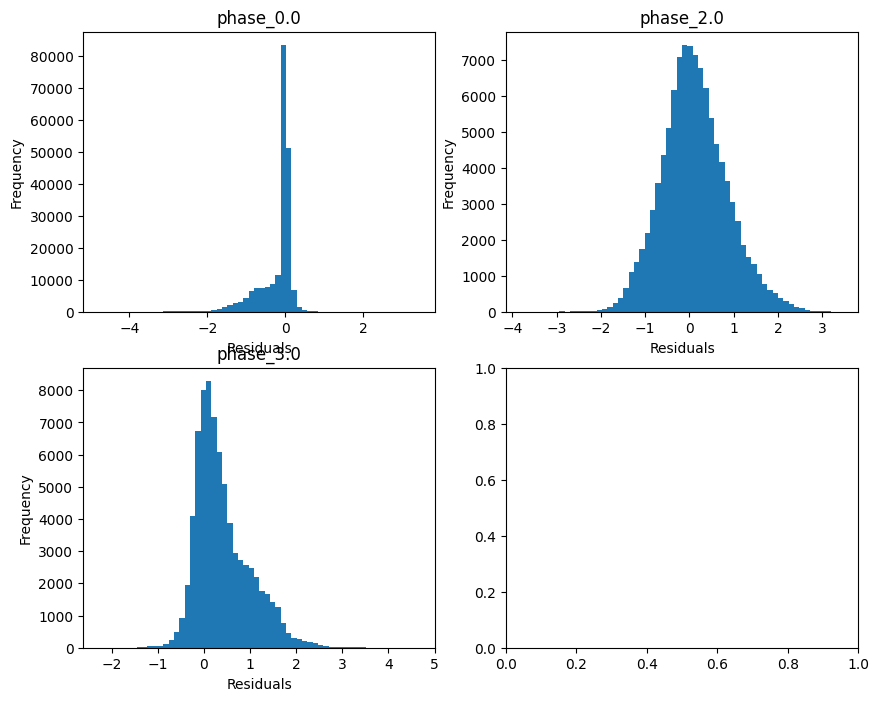

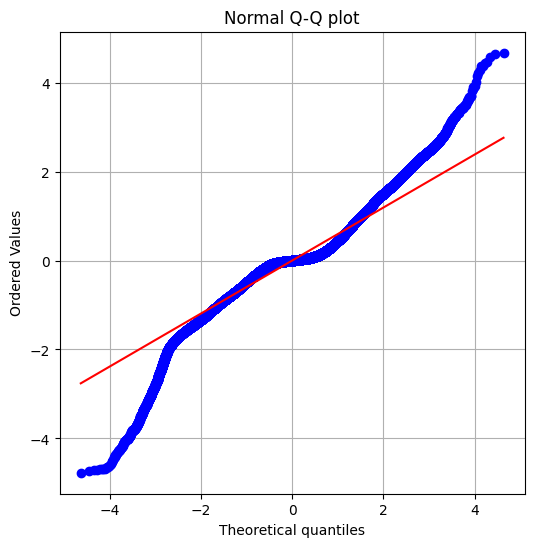

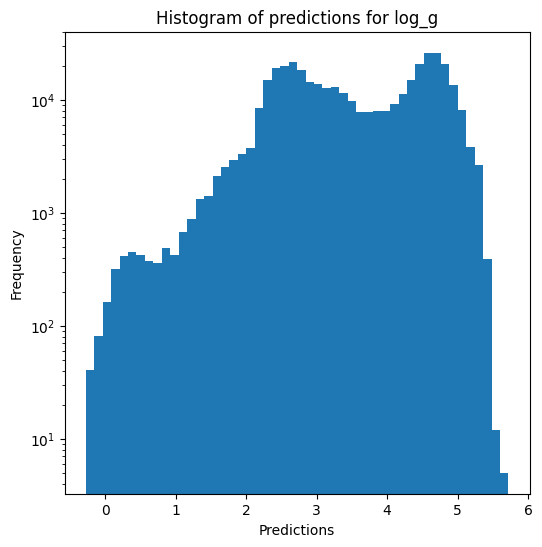

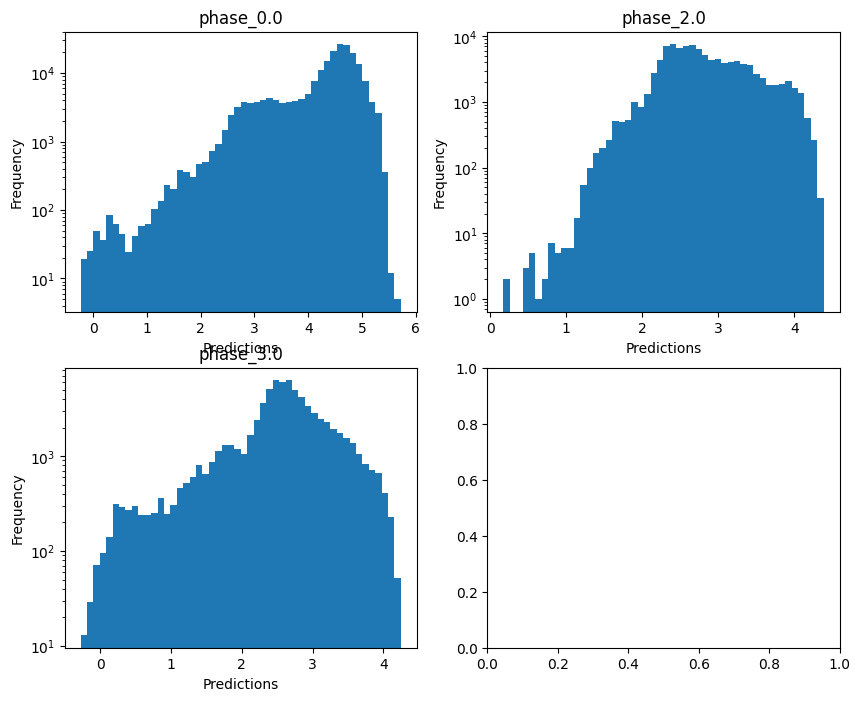

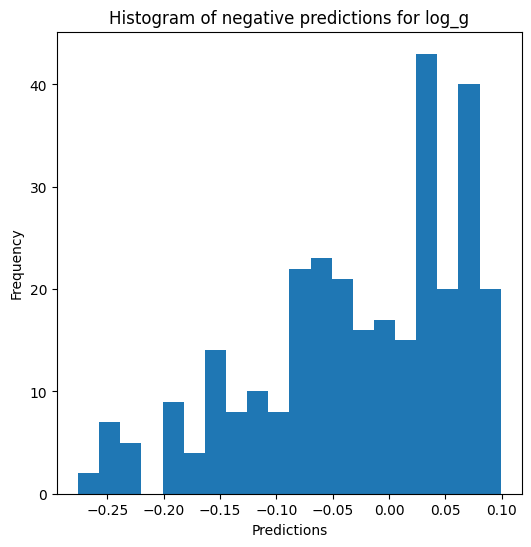


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7088385763868229
  RMSE :  0.24983772380072208
  MAE :  0.13341763993029207
  MedAE :  0.03444664975780154
  CORR :  0.9152220708325838
  MAX_ER :  2.4770098104175076
  Percentiles : 
    75th percentile :  0.1619715789581714
    90th percentile :  0.4289190961982774
    95th percentile :  0.5851177250678089
    99th percentile :  0.8623638803691293

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.36670702663042454
  RMSE :  0.37502694796396374
  MAE :  0.29111603586317897
  MedAE :  0.23349120007369786
  CORR :  0.6062985380785164
  MAX_ER :  1.8832193702587927
  Percentiles : 
    75th percentile :  0.41830650327521224
    90th percentile :  0.6191536590733117
    95th percentile :  0.7522923870188383
    99th percentile :  1.0481364821001338

radius results for the phase category w

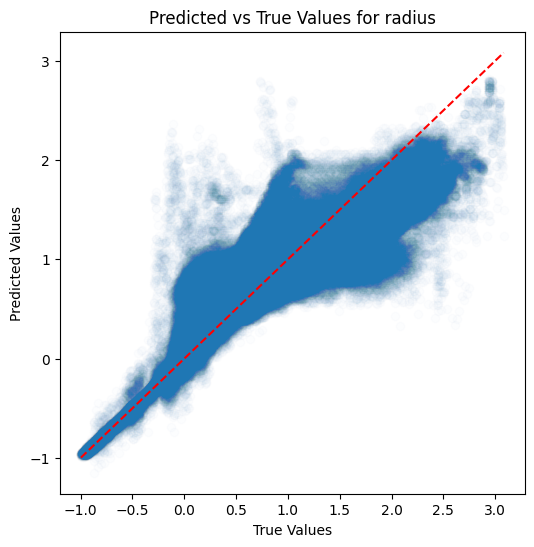

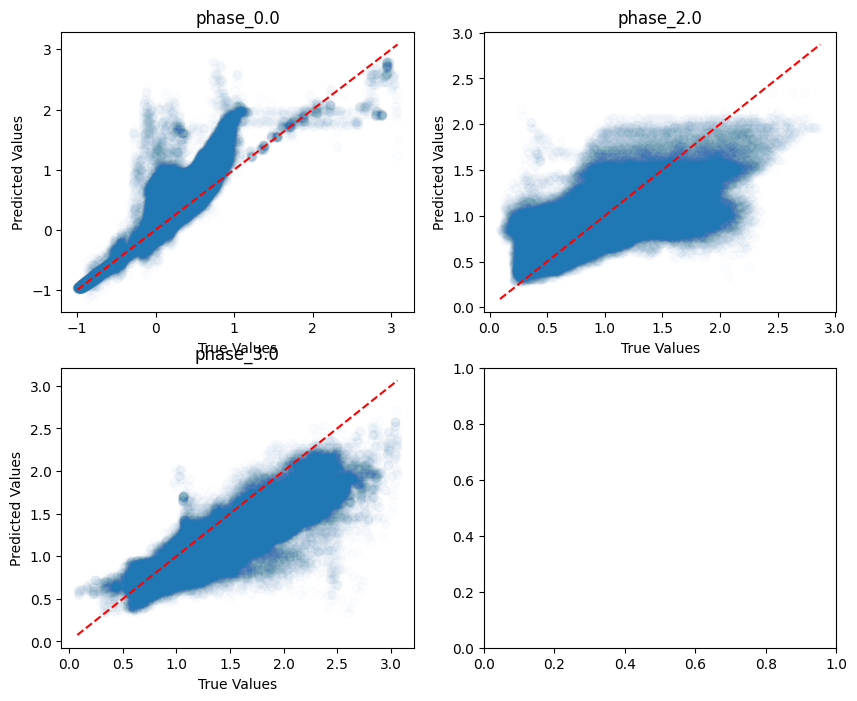

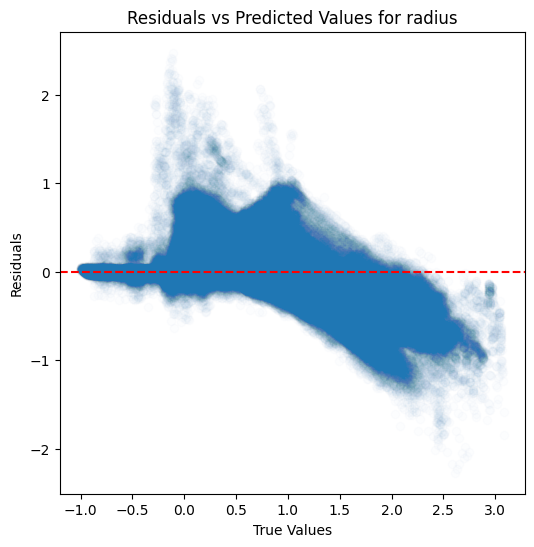

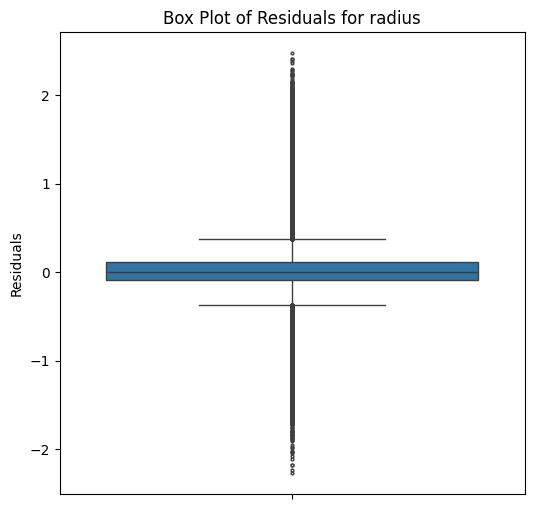

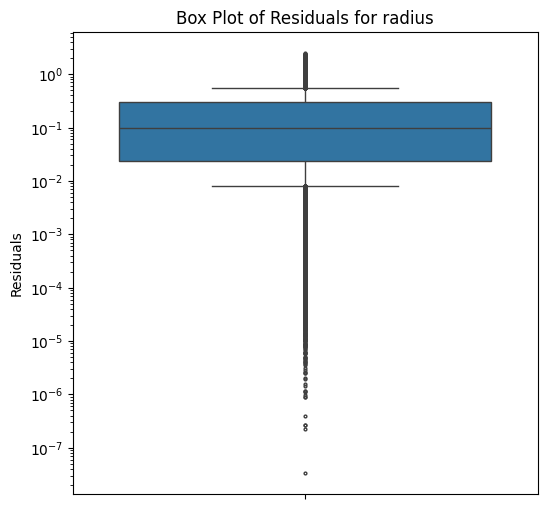

...

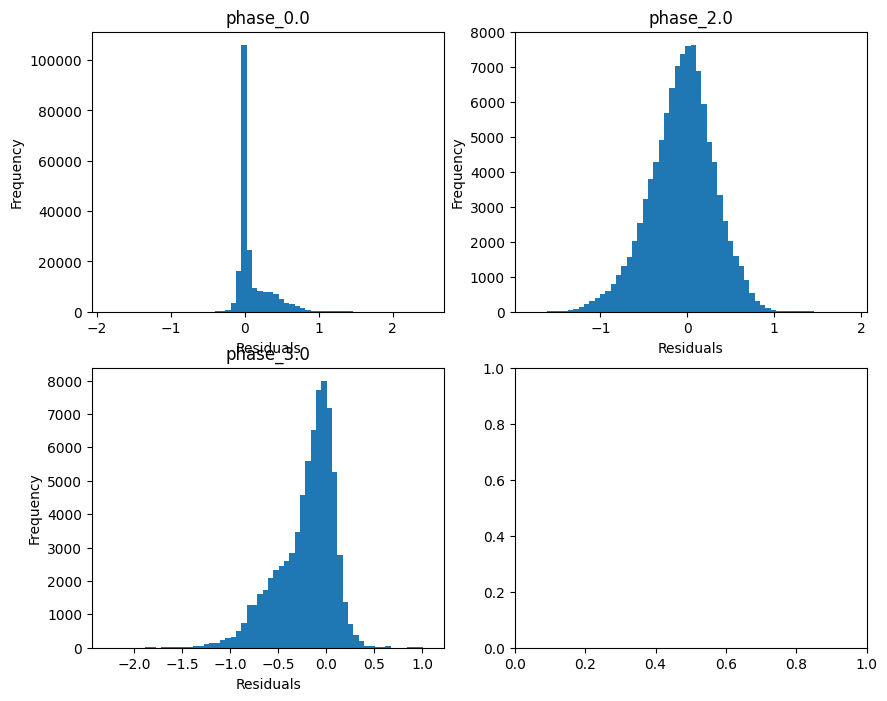

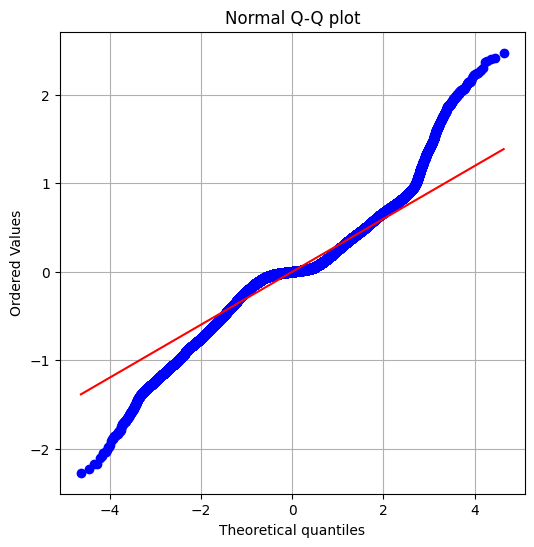

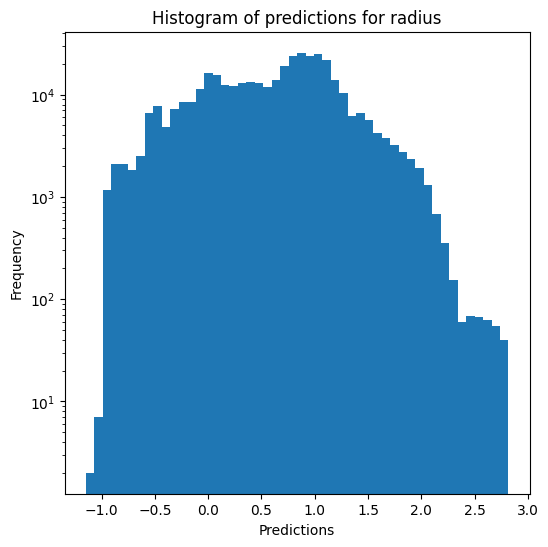

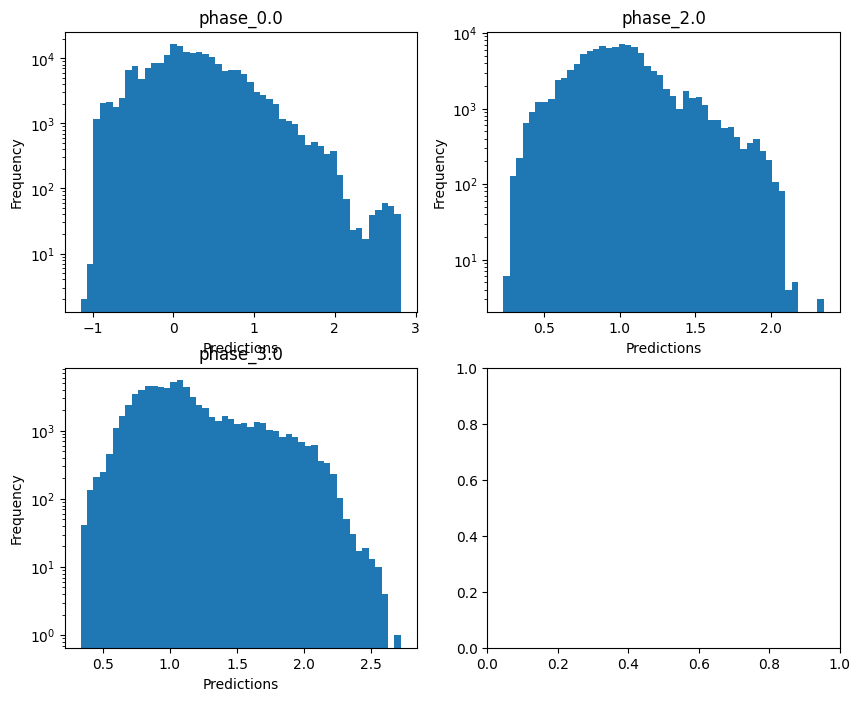

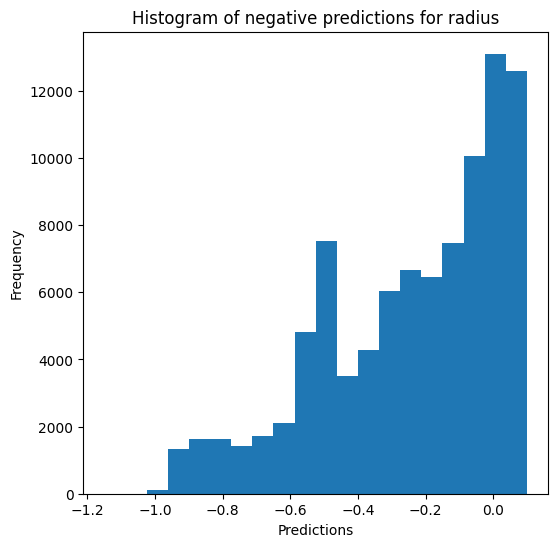

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard_14 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08281869749142412
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0798031279666859
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07947919940689872
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0836012025124396
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08063898932228693

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.917726160490435
  RMSE :  0.09375590082158206
  MAE :  0.057661928318728774
  MedAE :  0.0363038689720514
  CORR :  0.9582626998429461
  MAX_ER :  0.7672934087873458
  Percentiles : 
    75th percentile :  0.06141319529898226
    90th percentile :  0.12341552938327016
    95th percentile :  0.2200218103686933
    99th percentile :  0.38762814799811995

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7512065999499599
  RMSE :  0.1226136855247209
  MAE :  0.09091816674406519
  MedAE :  0.06752567929013131
  CORR :  0.8667458960911956
  MAX_ER :  0.6002209676531169
  Percentiles : 
    75th percentile :  0.12611199082458546
    90th percentile :  0.20410665459164562
    95th percentile :  0.2580386842287169
    99th percentile 

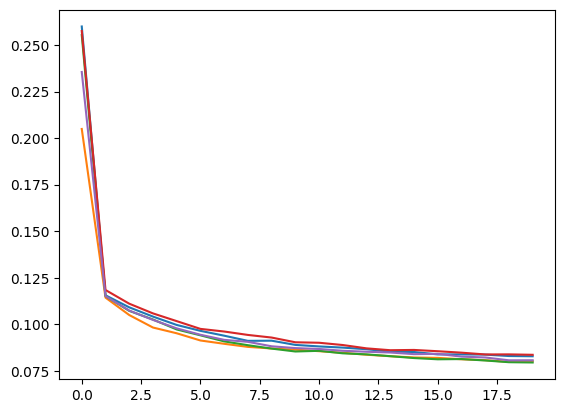

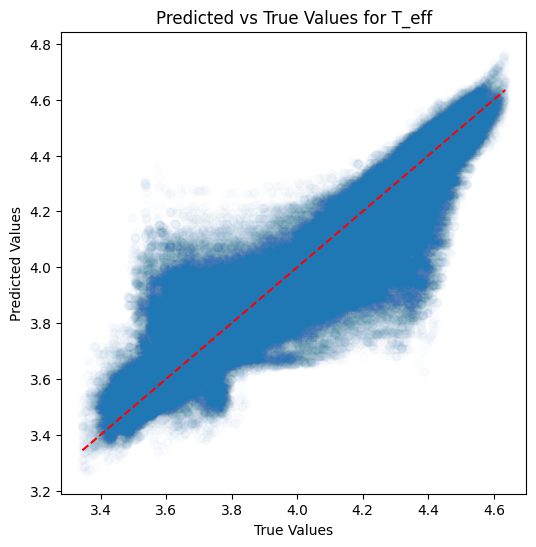

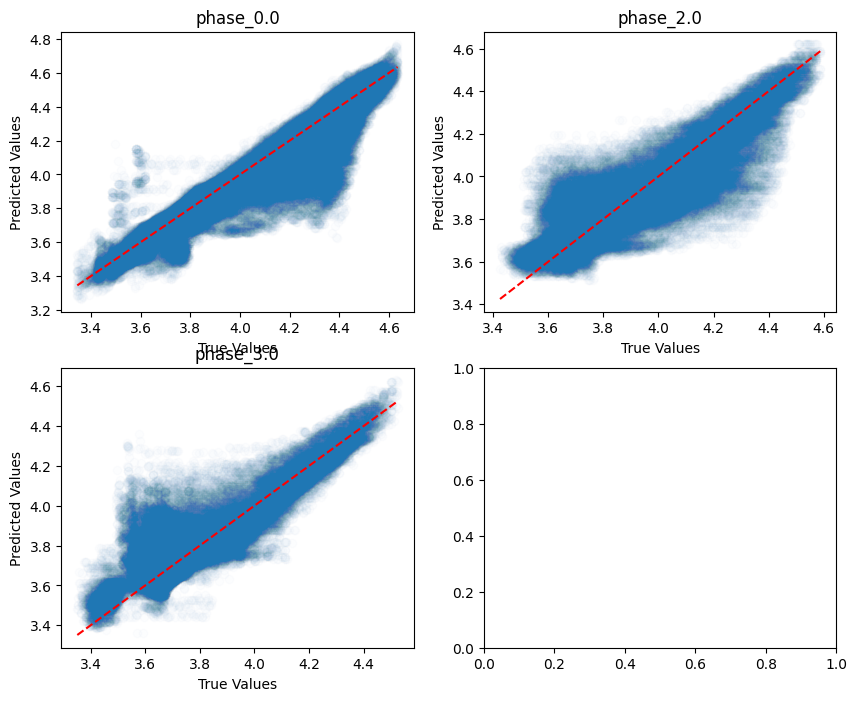

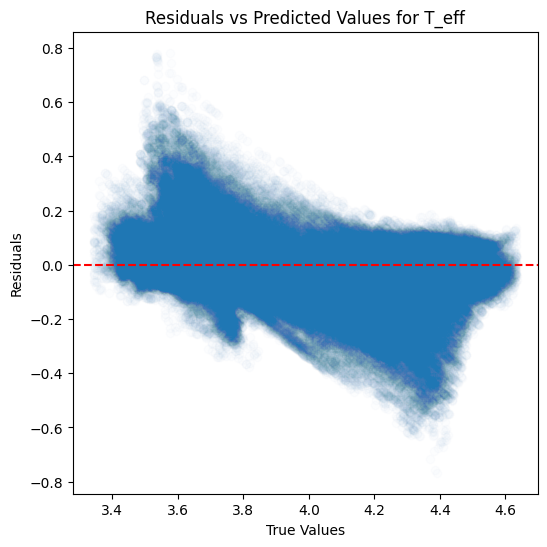

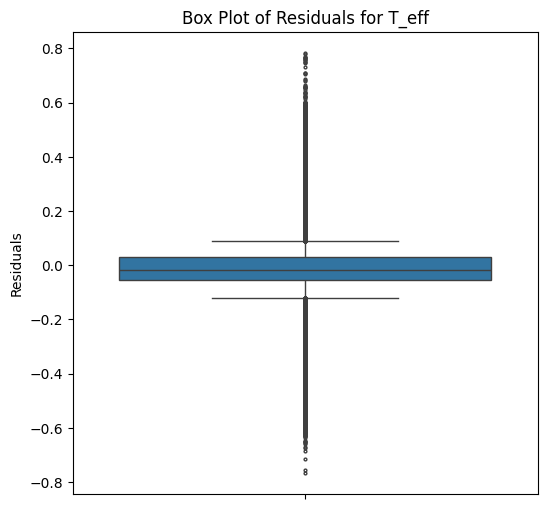

...

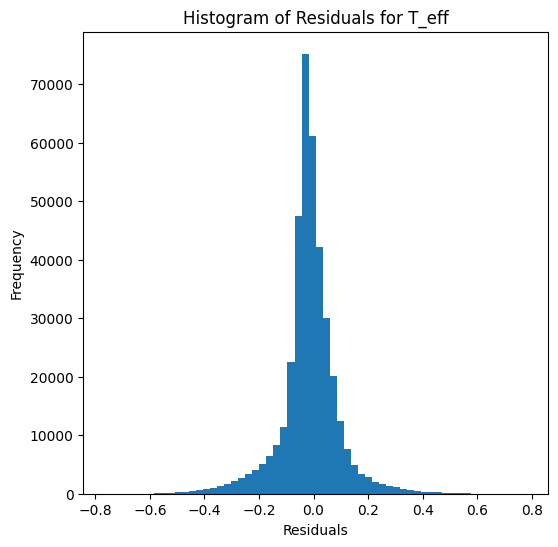

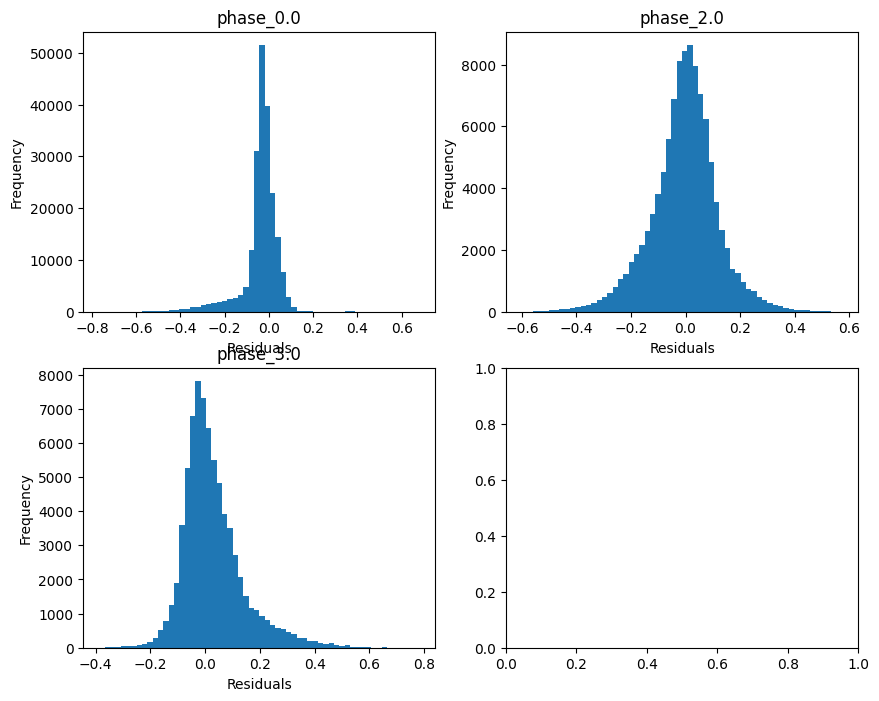

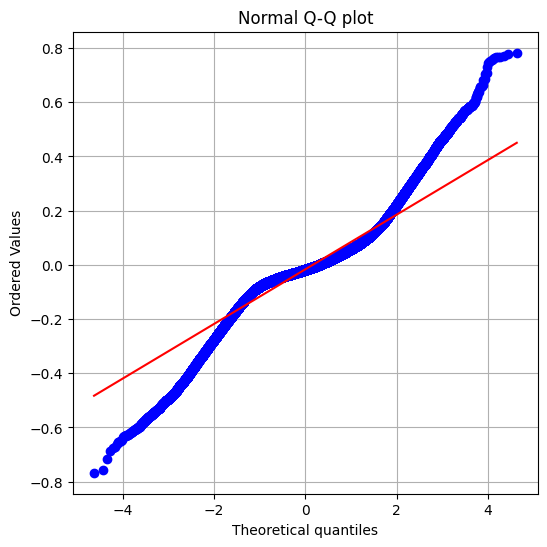

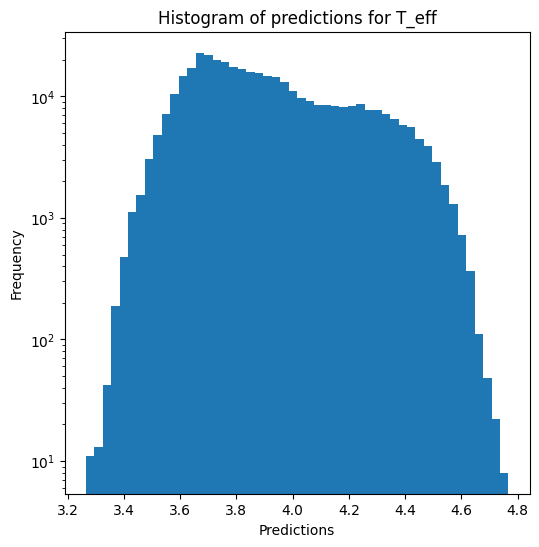

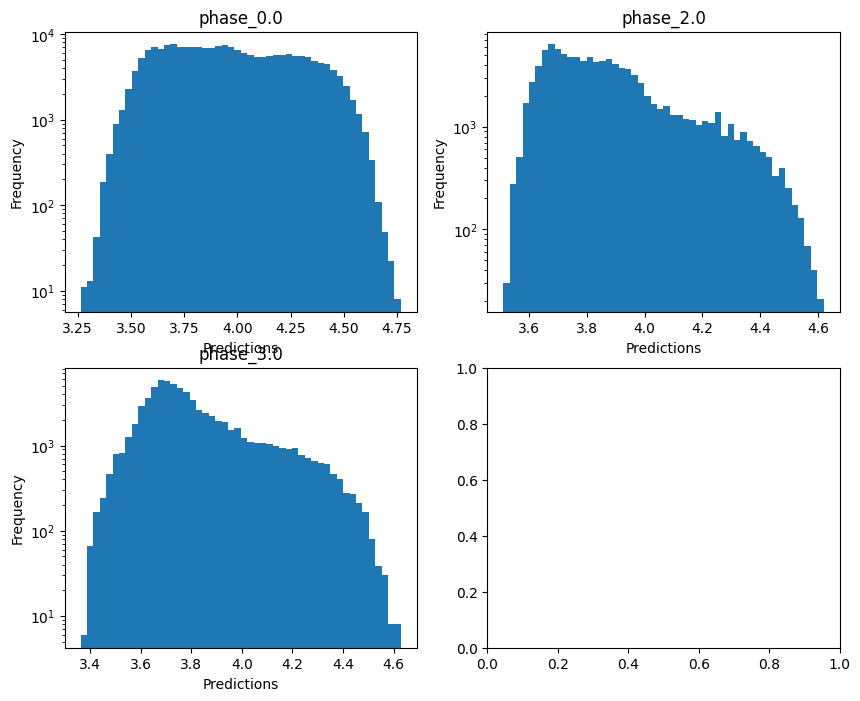


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.10183148848216939
  RMSE :  0.5107314022482616
  MAE :  0.22039450077632153
  MedAE :  0.06441231674741754
  CORR :  0.7731103990554585
  MAX_ER :  4.1500484444040495
  Percentiles : 
    75th percentile :  0.11194321636493765
    90th percentile :  0.7046171654821131
    95th percentile :  1.3044576439822937
    99th percentile :  2.2733434085012125

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.34390977510534104
  RMSE :  0.7513935967581772
  MAE :  0.5784625451010749
  MedAE :  0.4538512569793256
  CORR :  0.5888379556143981
  MAX_ER :  3.717938314421037
  Percentiles : 
    75th percentile :  0.8398114498920957
    90th percentile :  1.260276237068085
    95th percentile :  1.5241176349403773
    99th percentile :  2.0737797996417

log_g results for the phase category with a val

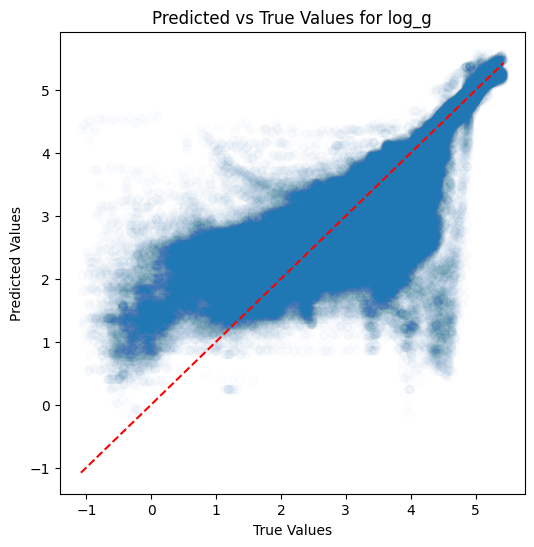

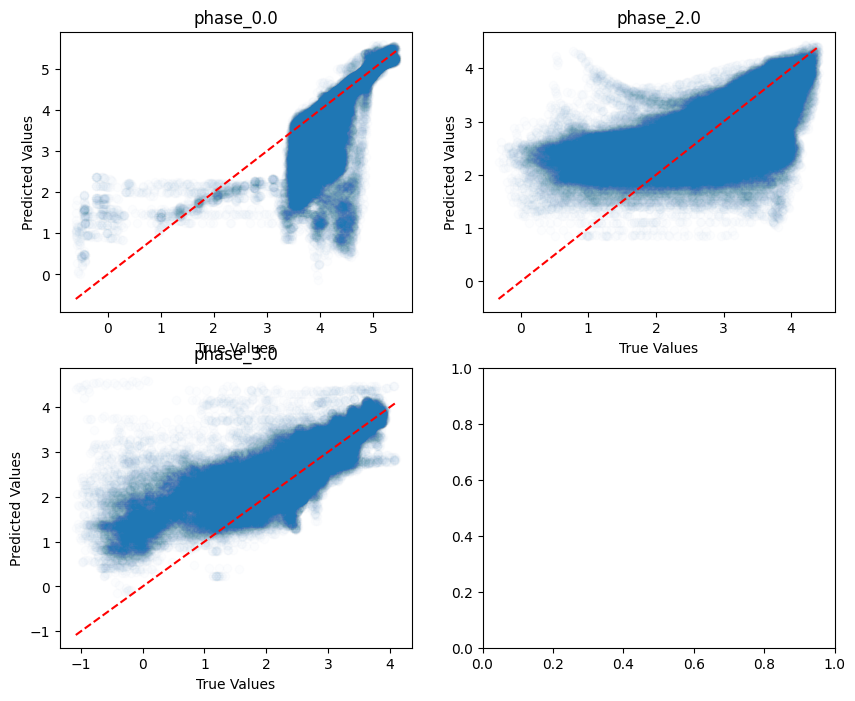

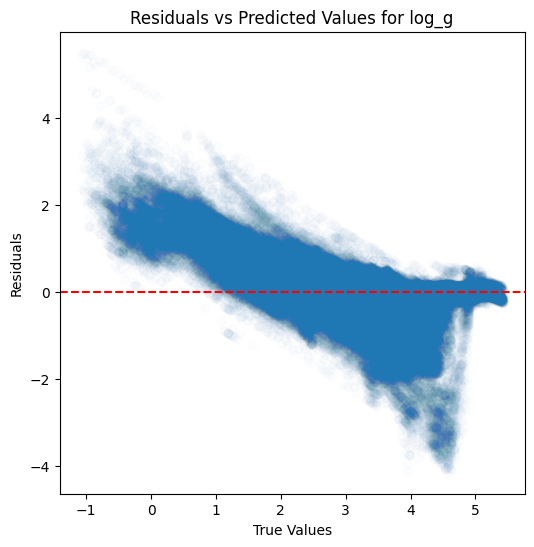

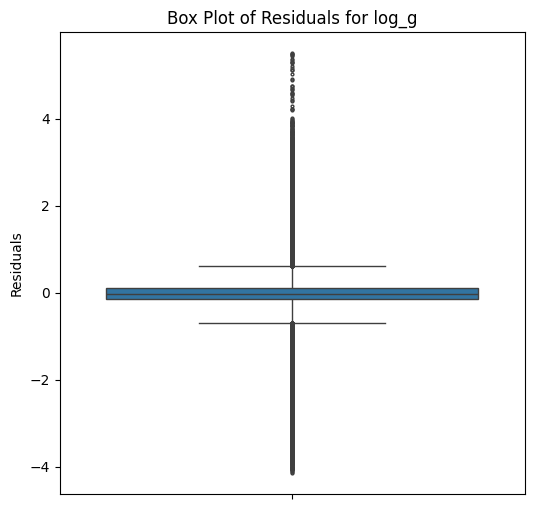

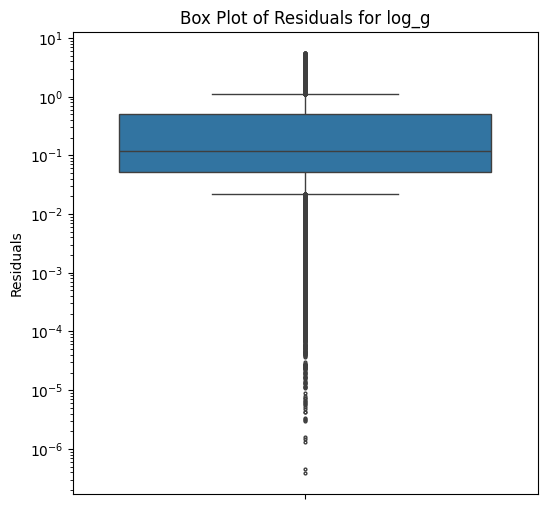

...

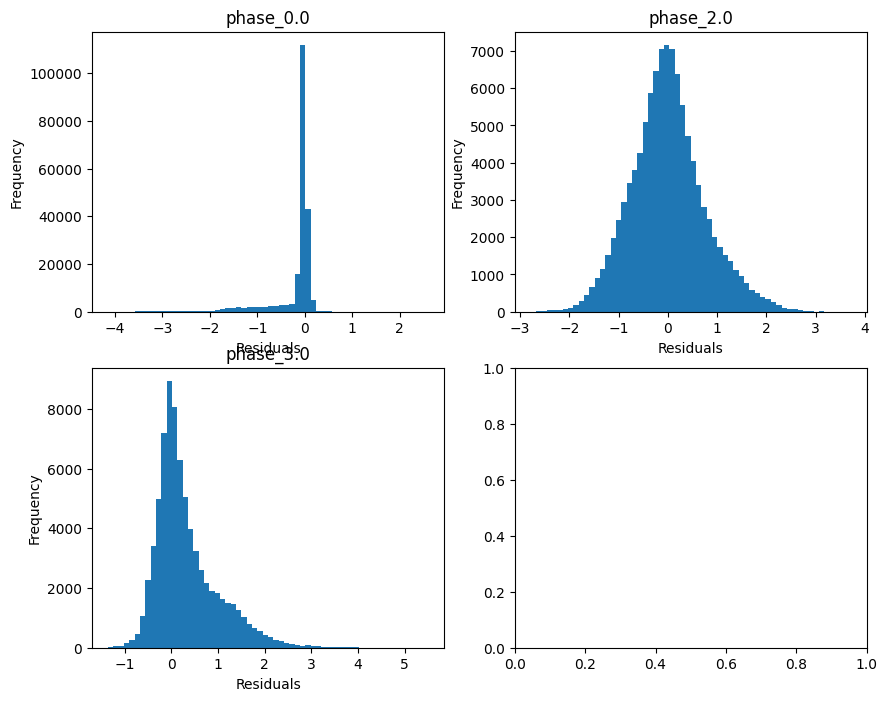

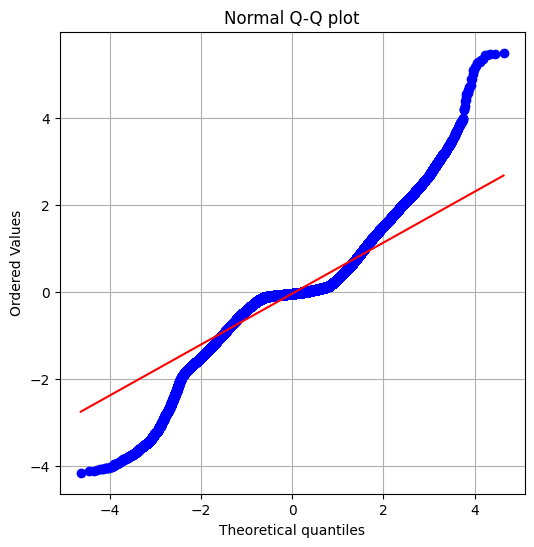

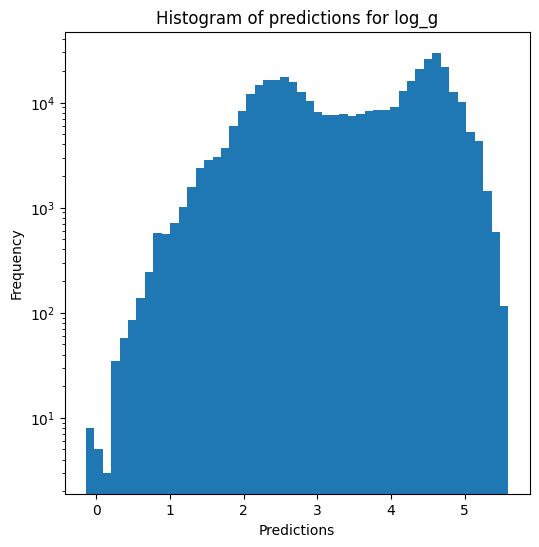

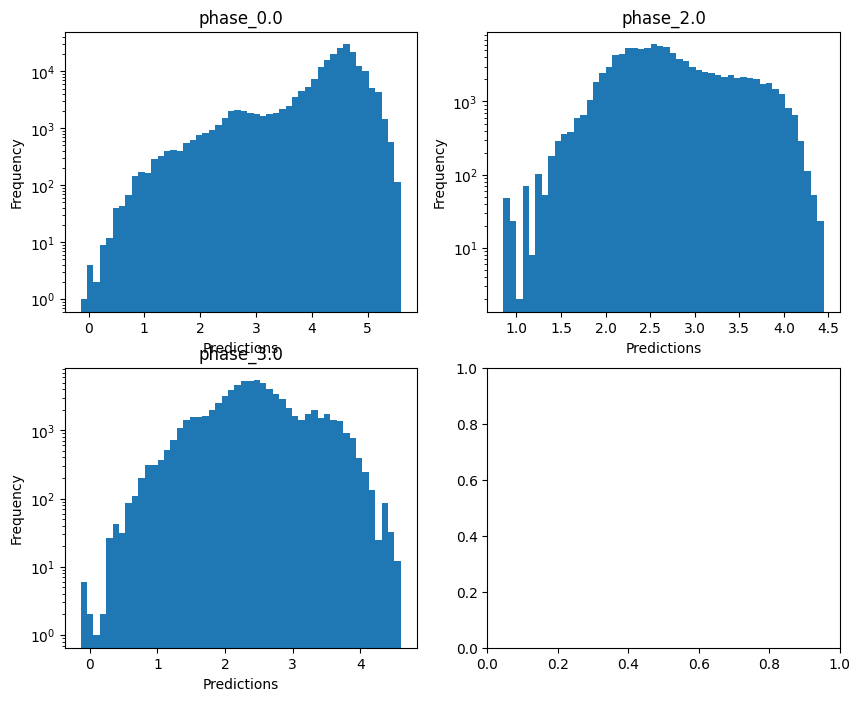

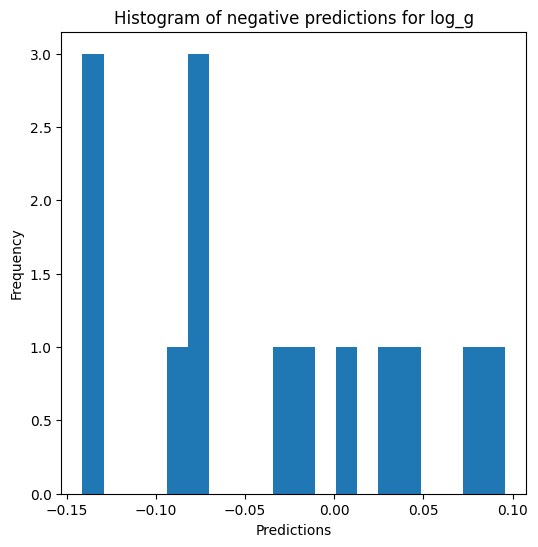


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.6724446849112911
  RMSE :  0.2561196897112789
  MAE :  0.1076575905233114
  MedAE :  0.02601979791364707
  CORR :  0.8916722789857834
  MAX_ER :  2.0970862278376208
  Percentiles : 
    75th percentile :  0.05695389672846768
    90th percentile :  0.349684804691684
    95th percentile :  0.6568186530599135
    99th percentile :  1.1330578423513735

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.3494912446599099
  RMSE :  0.3752682861521088
  MAE :  0.288870028112584
  MedAE :  0.2256033514286101
  CORR :  0.6007807635424285
  MAX_ER :  1.8566382531110885
  Percentiles : 
    75th percentile :  0.4195416882861773
    90th percentile :  0.6308546009747834
    95th percentile :  0.7621444602366907
    99th percentile :  1.034671855897249

radius results for the phase category with a val

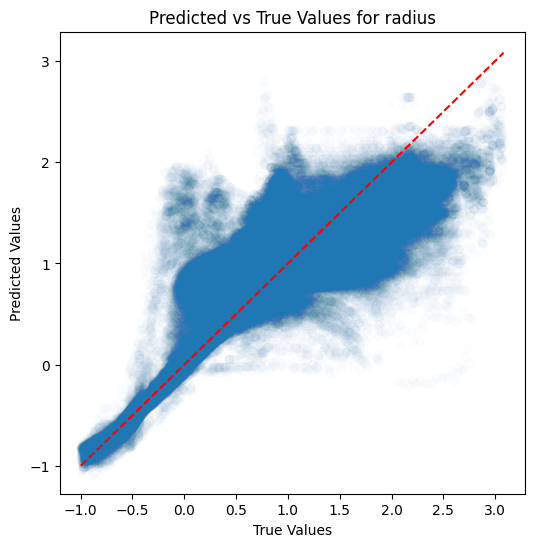

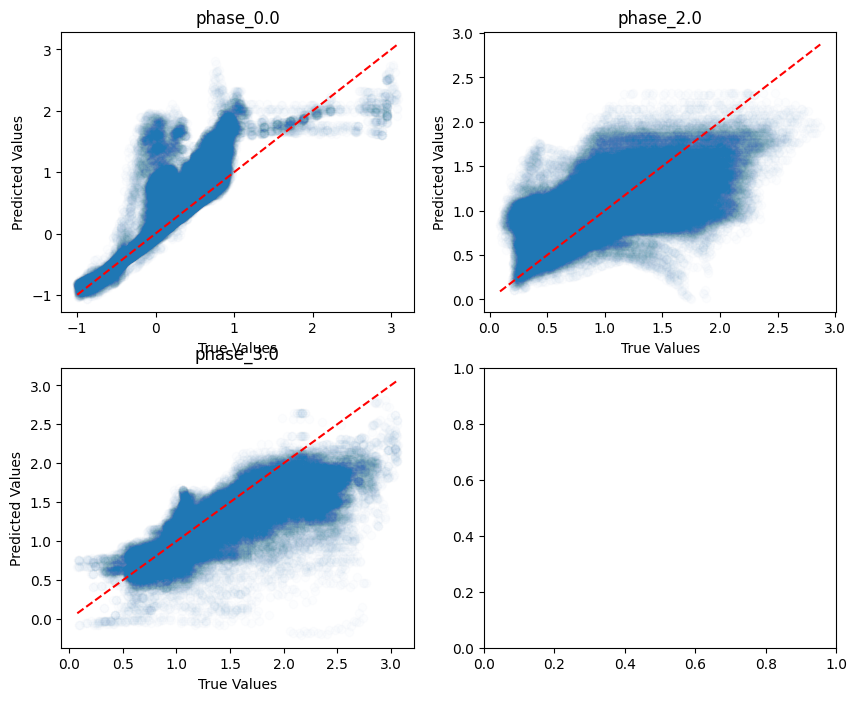

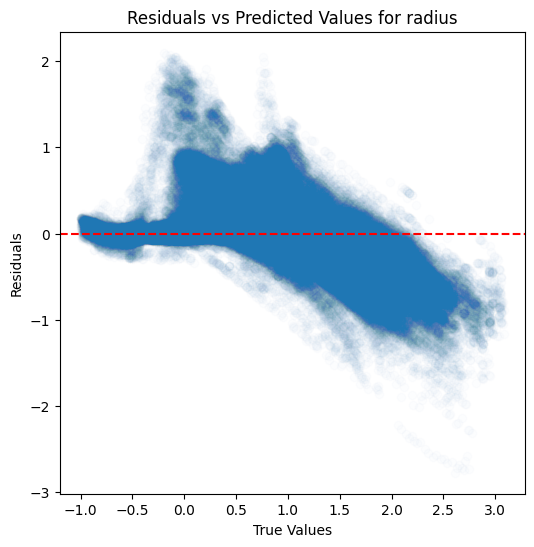

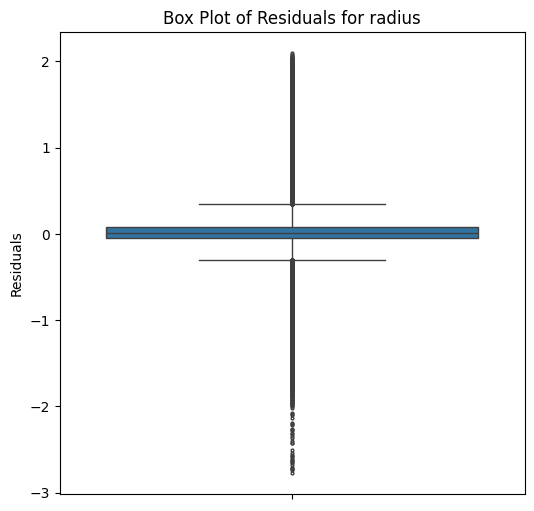

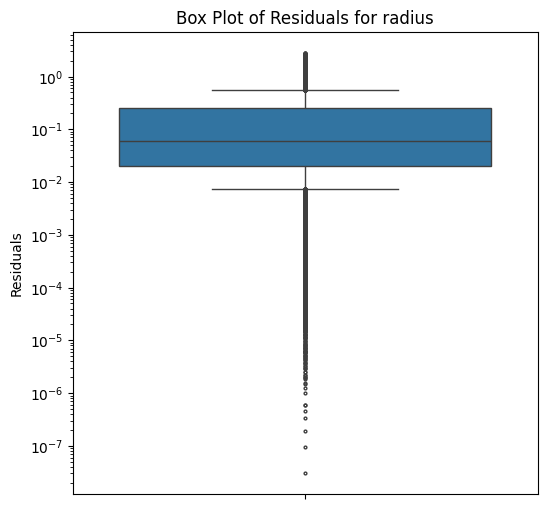

...

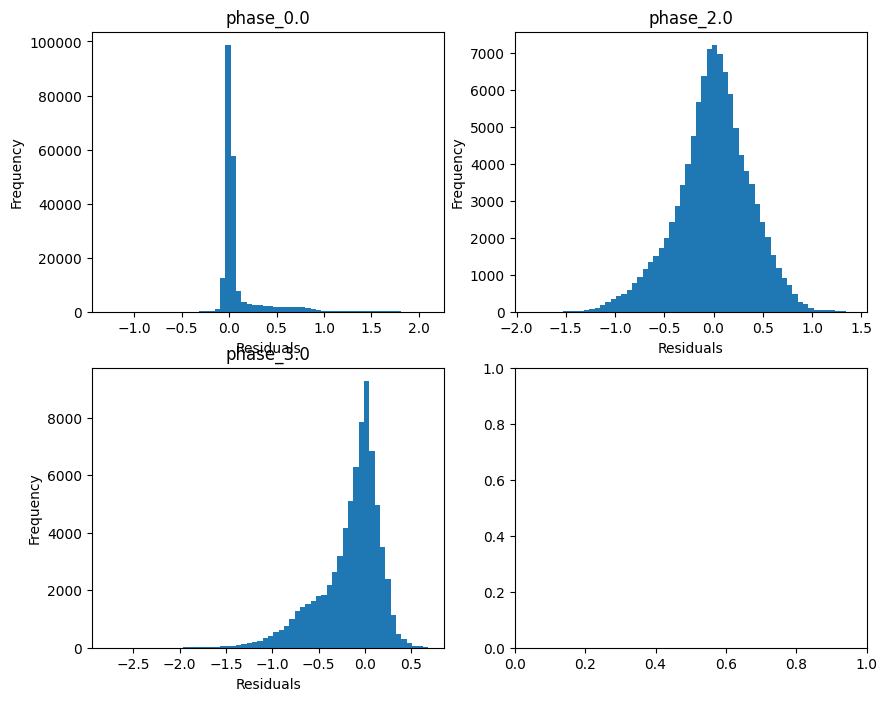

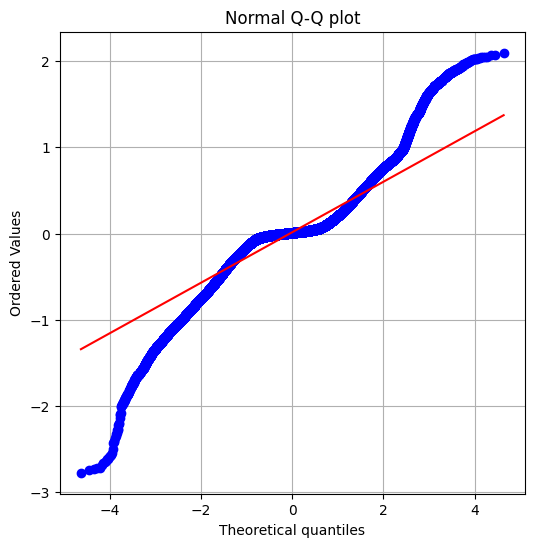

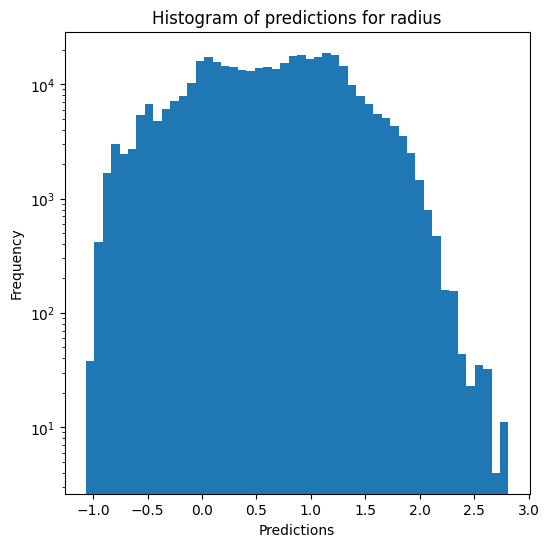

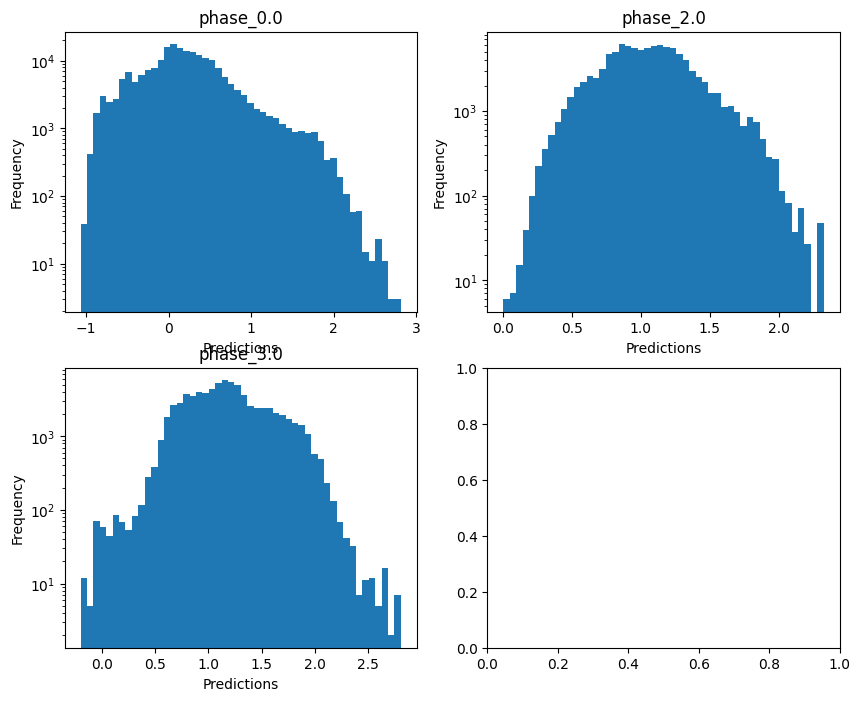

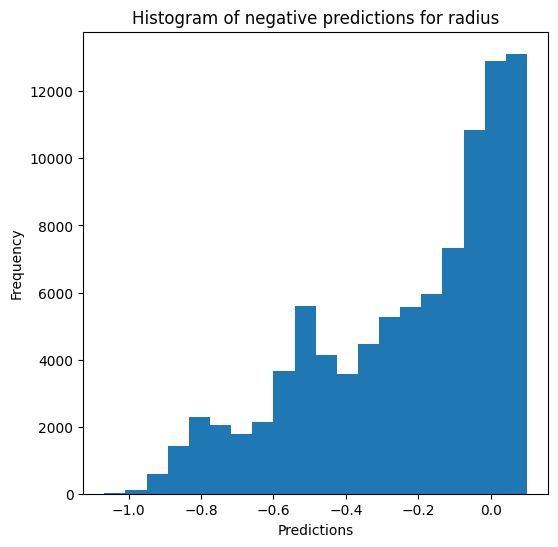

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon